# Imports

In [1]:
from __future__ import division
from __future__ import print_function
from __future__ import absolute_import

import time
import collections
from typing import Dict
from typing import List
import pandas as pd
import numpy as np
import datetime
import matplotlib.pyplot as plt
import seaborn as sns
import networkx as nx
import imp
import os
import pickle as pk
%matplotlib inline

import sys
sys.path.insert(0, '../../../src/')

import network_utils
import utils

# Helper functions

In [2]:
def reload():
    imp.reload(network_utils)
    imp.reload(utils)

# Parameters

In [3]:
fulldata_filepath = '../../../data/Countries/Countries_1995_to_2018.pkl'
country_list_filepath = 'data_saved/CountryList.csv'
weeks = 12

# Loading pickled results

In [4]:
# utils.load_all_variables_of_saved_session(globals(), '/local/home/student/omid55/sbt_data_saved/avg_all_vars.pkl')

In [ ]:
# Loading all pickled results
# with open('/home/omid/Downloads/DT/transitions_avg.pk', 'rb') as f:
#     result = pk.load(f)
    
# with open('/home/omid/Downloads/DT/networks_avg.pk', 'rb') as f:
#     nets = pk.load(f)

# separate_dgraphs = nets['separate_dgraphs']
# accumulative_dgraphs = nets['accumulative_dgraphs']

# Data loading

In [26]:
data = pd.read_pickle(fulldata_filepath)

if os.path.isfile(country_list_filepath):
    country_df = pd.read_csv(country_list_filepath, index_col=0)
else:
    country_list = list(
        set.union(set(data['source']), set(data['target'])))
    country_list = sorted(country_list)
    country_df = pd.DataFrame(
        {'index': np.arange(len(country_list)),
         'country': country_list},
        columns=['index', 'country'])
    country_df.to_csv(country_list_filepath)
    
country_names = country_df['country']
indices = country_df['index']
country_map = {
    country_names[i]: indices[i]
    for i in range(len(country_df))}

source_ids = []
for source in data['source']:
    source_ids.append(country_map[source])

target_ids = []
for target in data['target']:
    target_ids.append(country_map[target])
    
data['source'] = source_ids
data['target'] = target_ids

In [27]:
country_df

,index,country
0,0,Afghanistan
1,1,Aland Islands
2,2,Albania
3,3,Algeria
4,4,American Samoa
5,5,Andorra
6,6,Angola
7,7,Anguilla
8,8,Antarctica
9,9,Antigua and Barbuda


In [28]:
data.head()

,edge_date,source,target,weight
1,1995-01-01,28,196,4.0
2,1995-01-01,196,28,4.0
10,1995-01-01,182,237,4.0
18,1995-01-01,99,199,3.4
19,1995-01-01,113,108,8.0


In [29]:
print(data.shape)

(8073921, 4)


In [30]:
print('How many edges are given from a source to target more than once over time: ',
      len(np.where(data[['source', 'target']].duplicated())[0]))

How many edges are given from a source to target more than once over time:  8045522


# Data basic analysis

In [31]:
data_len = len(data)
print('Data has {} #edges.\nIt spans from {} to {}.\n'
      'It has {} #nodes (unique) in total duration.'.format(
          data_len,
          min(data['edge_date']),
          max(data['edge_date']),
          len(set(data['source']).union(set(data['target'])))))

pos = len(np.where(data['weight'] > 0)[0])
neg = len(np.where(data['weight'] < 0)[0])
zer = len(np.where(data['weight'] == 0)[0])  # It should not be any zeros.
print('\nEdge (trust/distrust) over time:\n\t+:'
      ' {}({}%)\n\t-: {}({}%)\n\t0: {}({}%).'.format(
          pos, round(100*pos/data_len),
          neg, round(100*neg/data_len),
          zer, round(100*zer/data_len)))

Data has 8073921 #edges.
It spans from 1995-01-01 to 2018-09-30.
It has 250 #nodes (unique) in total duration.

Edge (trust/distrust) over time:
	+: 5974283(74%)
	-: 1333646(17%)
	0: 765992(9%).


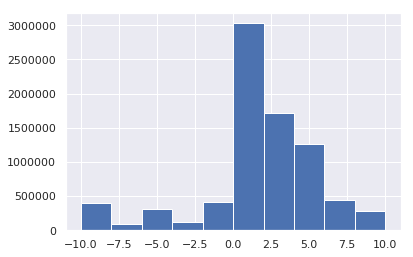

In [32]:
plt.hist(data['weight']);

# Extracting the networks

In [12]:
start_time = time.time()

separate_dgraphs = network_utils.extract_graphs(edge_list=data, weeks=weeks, accumulative=False, sum_multiple_edge=True)
accumulative_dgraphs = network_utils.extract_graphs(edge_list=data, weeks=weeks, accumulative=True, sum_multiple_edge=True)

duration = time.time() - start_time
print('It took :', duration/60, 'mins.')

It took : 9.216327476501466 mins.


In [13]:
# Saves the networks.
with open('/local/home/student/omid55/sbt_data_saved/networks_avg.pkl', 'wb') as f:
    pk.dump({'separate_dgraphs': separate_dgraphs, 'accumulative_dgraphs': accumulative_dgraphs}, f)

# Plotting

In [ ]:
from pyvis.network import Network

In [ ]:
sns.set(rc={'figure.figsize':(8, 8)})
G = separate_dgraphs[0]

colors = []
for edge in G.edges():
    weight = G.get_edge_data(edge[0], edge[1])['weight']
    if weight == 0:
        colors.append('b')
    elif weight > 0:
        colors.append('g')
    else:
        colors.append('r')

pos = nx.spring_layout(G)
nx.draw_networkx_nodes(G, pos, node_size=30,
                       node_color='k',
                       cmap=plt.cm.Greys)
nx.draw_networkx_edges(G, pos, alpha=0.5, edge_color=colors)
plt.show()

In [ ]:
G = Network(directed=True, notebook=True)
G.from_nx(separate_dgraphs[0])
G.show_buttons(filter_=['physics'])
G.show("mygraph.html")

In [ ]:
# Just to create title names.
title_names = []
start_date = min(data['edge_date'])
end_date = max(data['edge_date'])
periods_num = int(np.floor((end_date - start_date).days / (weeks * 7)))
for period_index in range(periods_num):
    period_start = (
        start_date + period_index * datetime.timedelta(weeks * 7))
    period_end = period_start + datetime.timedelta(weeks * 7)
    title_names.append('{} to {}'.format(period_start, period_end))

network_utils.plot_evolving_graphs(dgraphs=separate_dgraphs, titles=title_names)

# Computing the metrics for networks in periods

## Metrics for separate dynamic graphs

In [ ]:
sorted_keys = sorted(
    network_utils.get_metrics_for_network(separate_dgraphs[0]).keys())

evolving_metrics = collections.defaultdict(list)
for index, directed_graph in enumerate(separate_dgraphs):
    print(index, '...')
    metrics = network_utils.get_metrics_for_network(directed_graph)
    for key in sorted_keys:
        evolving_metrics[key].append(metrics[key])

In [ ]:
m = 6
n = 5
sns.set(rc={'figure.figsize':(25, 30)})

sorted_keys = sorted(list(
    set(evolving_metrics.keys()) - set([
        '#pos edges', '#neg edges', '#gcc pos edges', '#gcc neg edges'])))

plt.subplot(m, n, 1)
plt.plot(evolving_metrics['#pos edges'], 'g')
plt.plot(evolving_metrics['#neg edges'], 'r')
plt.xlabel('#edges')
plt.legend(['pos', 'neg'])

plt.subplot(m, n, 2)
plt.plot(evolving_metrics['#gcc pos edges'], 'g')
plt.plot(evolving_metrics['#gcc neg edges'], 'r')
plt.xlabel('#gcc edges')
plt.legend(['pos', 'neg'])

for index, key in enumerate(sorted_keys):
    plt.subplot(m, n, index+3)
    plt.plot(evolving_metrics[key])
    plt.ylabel(key)
    plt.xlabel('Time')

# Goodness and fairness metric

In [ ]:
res = network_utils.compute_fairness_goodness(separate_dgraphs[0])

### Metrics for accumulative dynamic graphs

In [ ]:
sorted_keys = sorted(
    network_utils.get_metrics_for_network(accumulative_dgraphs[0]).keys())

accumulative_evolving_metrics = collections.defaultdict(list)
for index, accumulative_dgraph in enumerate(accumulative_dgraphs):
    print(index, '...')
    metrics = network_utils.get_metrics_for_network(accumulative_dgraph)
    for key in sorted_keys:
        accumulative_evolving_metrics[key].append(metrics[key])

In [ ]:
m = 6
n = 5
sns.set(rc={'figure.figsize':(25, 30)})

sorted_keys = sorted(list(
    set(accumulative_evolving_metrics.keys()) - set([
        '#pos edges', '#neg edges', '#gcc pos edges', '#gcc neg edges'])))

plt.subplot(m, n, 1)
plt.plot(accumulative_evolving_metrics['#pos edges'], 'g')
plt.plot(accumulative_evolving_metrics['#neg edges'], 'r')
plt.xlabel('#edges')
plt.legend(['pos', 'neg'])

plt.subplot(m, n, 2)
plt.plot(accumulative_evolving_metrics['#gcc pos edges'], 'g')
plt.plot(accumulative_evolving_metrics['#gcc neg edges'], 'r')
plt.xlabel('#gcc edges')
plt.legend(['pos', 'neg'])

for index, key in enumerate(sorted_keys):
    plt.subplot(m, n, index+3)
    plt.plot(accumulative_evolving_metrics[key])
    plt.ylabel(key)
    plt.xlabel('Time')

## Separated graphs

In [ ]:
start_time = time.time()

edge_balances = []
for separate_dgraph in separate_dgraphs:
    edge_balances.append(
        network_utils.compute_edge_balance(separate_dgraph))

duration = time.time() - start_time
print('It took :', duration/60, 'mins.')

In [ ]:
m = 4
n = 4
sns.set(rc={'figure.figsize':(20, 20)})
for index, edge_balance in enumerate(edge_balances):
    num_unbalanced = []
    for value in edge_balance.values():
        num_unbalanced.append(
            value['#cycle3'] - value['#balanced'])
    plt.subplot(m, n, index + 1)
    if num_unbalanced:
        num_unbalanced = np.array(num_unbalanced)
        num_unbalanced = num_unbalanced[num_unbalanced.nonzero()]
    plt.hist(num_unbalanced)
    
    # Period.
    period_start = (
        start_date + index * datetime.timedelta(weeks * 7))
    period_end = period_start + datetime.timedelta(weeks * 7)
    plt.title(
        '{} to {}'.format(str(period_start).split(' ')[0],
                          str(period_end).split(' ')[0]))

In [ ]:
transitions_balance = collections.defaultdict(list)
# transitions_div_unbalance = collections.defaultdict(list)
for edge_balance in edge_balances:
    for key, value in edge_balance.items():
        transitions_balance[key].append(value['#balanced']/value['#cycle3'])
#         transitions_div_unbalance[key].append(1 - value['#balanced'] / value['#cycle3'])


balanced_cycle3_ratio = []
for val in transitions_balance.values():
    if len(val) > 12:
        balanced_cycle3_ratio.append(val)

sns.set(rc={'figure.figsize':(8, 8)})
balanced_cycle3_ratio = np.array(balanced_cycle3_ratio)
n, m =balanced_cycle3_ratio.shape
plt.errorbar(x=np.arange(0, m),
             y=np.mean(balanced_cycle3_ratio, axis=0),
             yerr=np.std(balanced_cycle3_ratio, axis=0)/np.sqrt(n));

## Accumulative graphs

In [ ]:
accumulative_edge_balances = []
for accumulative_dgraph in accumulative_dgraphs:
    accumulative_edge_balances.append(
        network_utils.compute_edge_balance(accumulative_dgraph))

In [ ]:
m = 4
n = 4
sns.set(rc={'figure.figsize':(20, 20)})
for index, accumulative_edge_balance in enumerate(accumulative_edge_balances):
    num_unbalanced = []
    for value in accumulative_edge_balance.values():
        num_unbalanced.append(
            value['#cycle3'] - value['#balanced'])
    plt.subplot(m, n, index + 1)
    if num_unbalanced:
        num_unbalanced = np.array(num_unbalanced)
        num_unbalanced = num_unbalanced[num_unbalanced.nonzero()]
    plt.hist(num_unbalanced)
    
    # Period.
    period_start = (
        start_date + index * datetime.timedelta(weeks * 7))
    period_end = period_start + datetime.timedelta(weeks * 7)
    plt.title(
        '{} to {}'.format(str(period_start).split(' ')[0],
                          str(period_end).split(' ')[0]))

In [ ]:
acc_transitions_balance = collections.defaultdict(list)
for accumulative_edge_balance in accumulative_edge_balances:
    for key, value in accumulative_edge_balance.items():
        acc_transitions_balance[key].append(value['#balanced'] / value['#cycle3'])

acc_balanced_cycle3_ratio = []
for val in acc_transitions_balance.values():
    if len(val) > 12:
        acc_balanced_cycle3_ratio.append(val)

sns.set(rc={'figure.figsize':(8, 8)})
acc_balanced_cycle3_ratio = np.array(acc_balanced_cycle3_ratio)
n, m = acc_balanced_cycle3_ratio.shape
plt.errorbar(x=np.arange(0, m),
             y=np.mean(acc_balanced_cycle3_ratio, axis=0),
             yerr=np.std(acc_balanced_cycle3_ratio, axis=0)/np.sqrt(n));

# Markov Chain of Sparse Triads

In [5]:
triad_map, triad_list = network_utils.generate_all_possible_sparse_triads()
unique_triad_num = len(triad_list)

## Separated graphs

In [15]:
start_time = time.time()

result = network_utils.compute_transition_matrix(
    dgraphs=separate_dgraphs,
    unique_triad_num=unique_triad_num,
    triad_map=triad_map,
    verbose=True)

duration = time.time() - start_time
print('It took :', duration/60, 'mins.')

.......................................................................................................

../../../src/utils.py:161: RuntimeWarning: invalid value encountered in true_divide
  return np.nan_to_num(matrix.T / np.sum(matrix, axis=1)).T


It took : 772.378849085172 mins.


In [16]:
# Saves the transitions.
with open('/local/home/student/omid55/sbt_data_saved/transitions_avg.pkl', 'wb') as f:
    pk.dump(result, f)

Nonzero percentage:  8.55 %


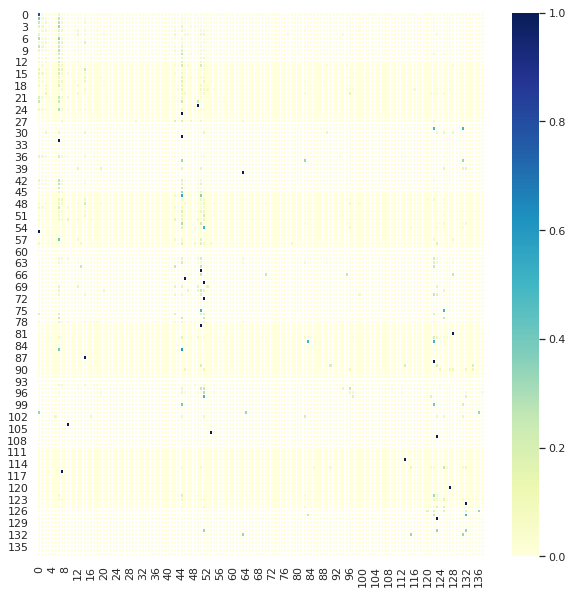

Nonzero percentage:  14.19 %


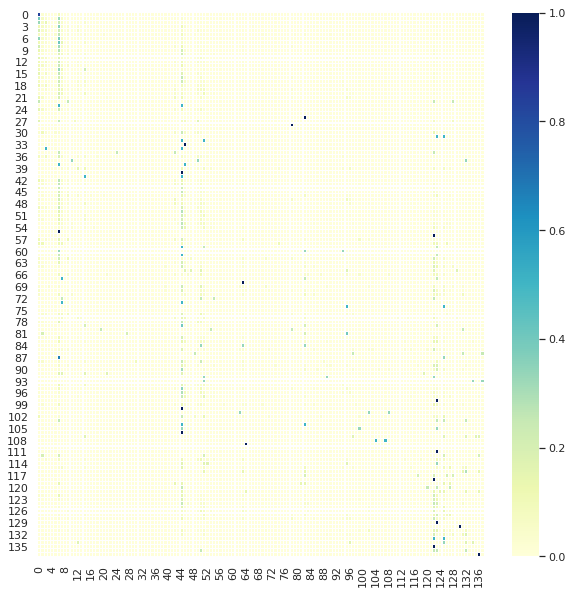

Nonzero percentage:  17.69 %


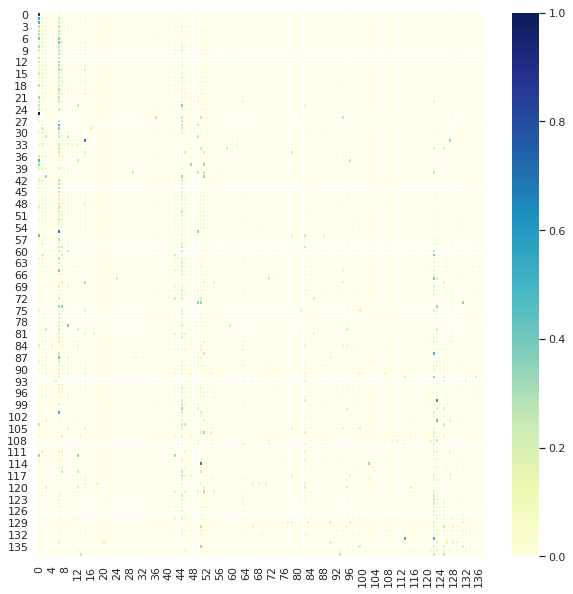

Nonzero percentage:  16.01 %


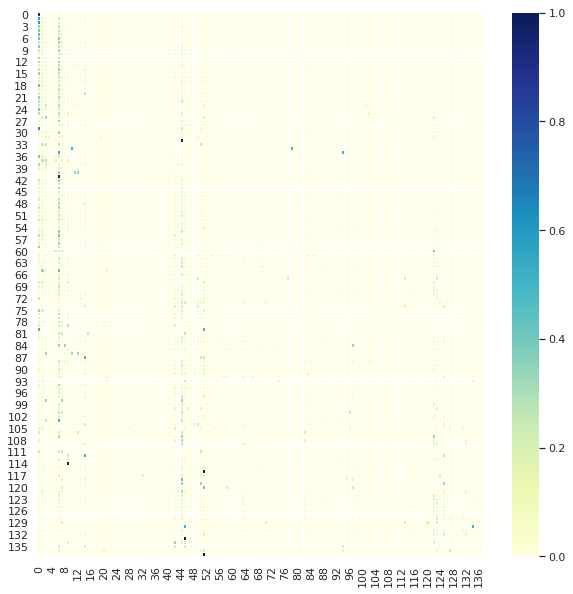

Nonzero percentage:  15.35 %


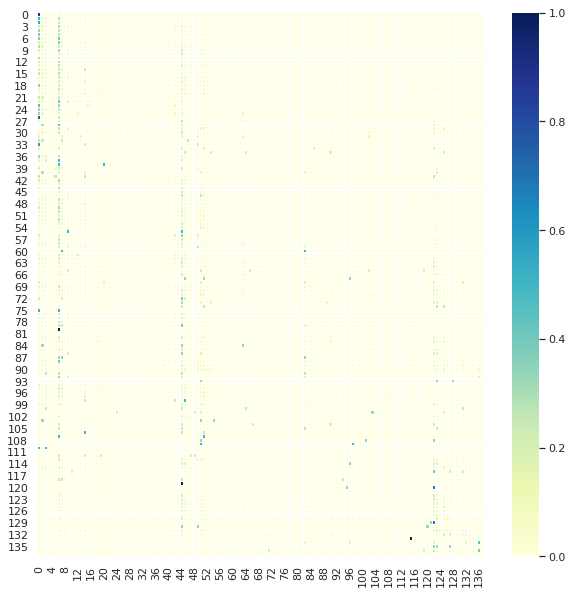

Nonzero percentage:  15.38 %


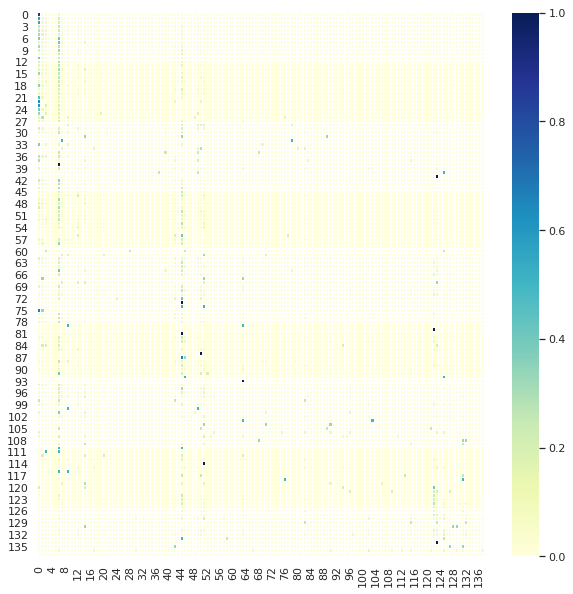

Nonzero percentage:  15.39 %


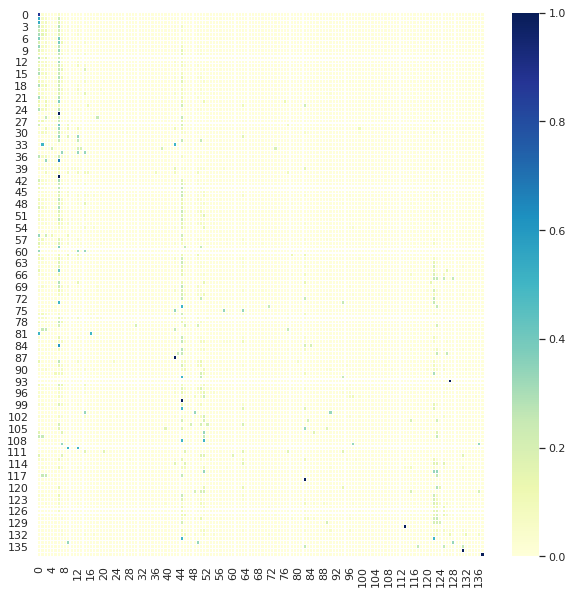

Nonzero percentage:  15.38 %


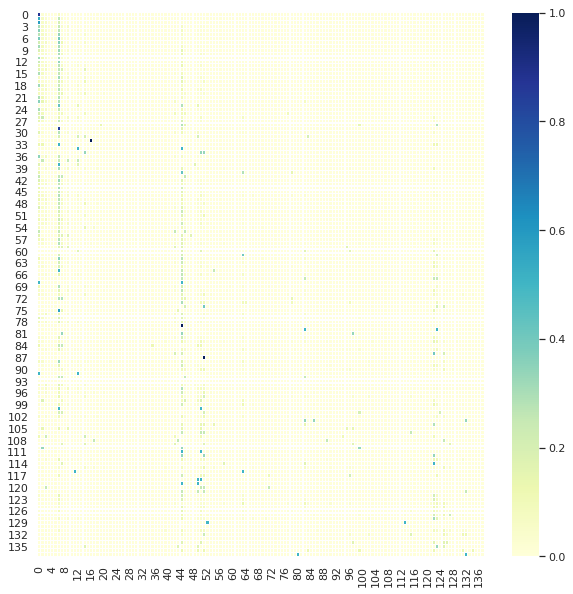

Nonzero percentage:  15.91 %


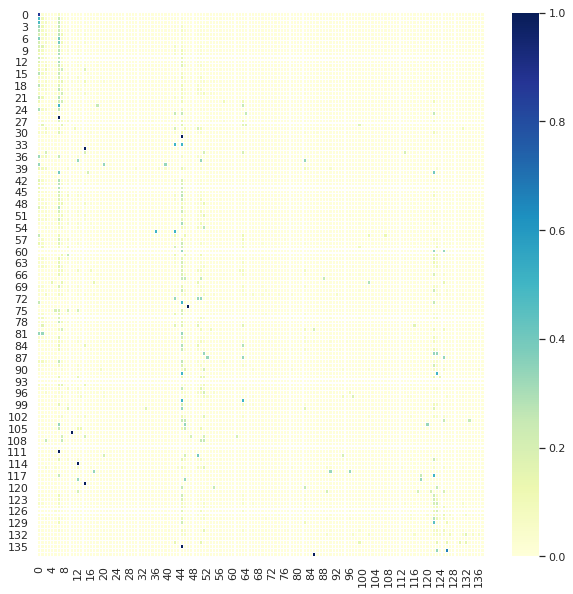

Nonzero percentage:  16.77 %


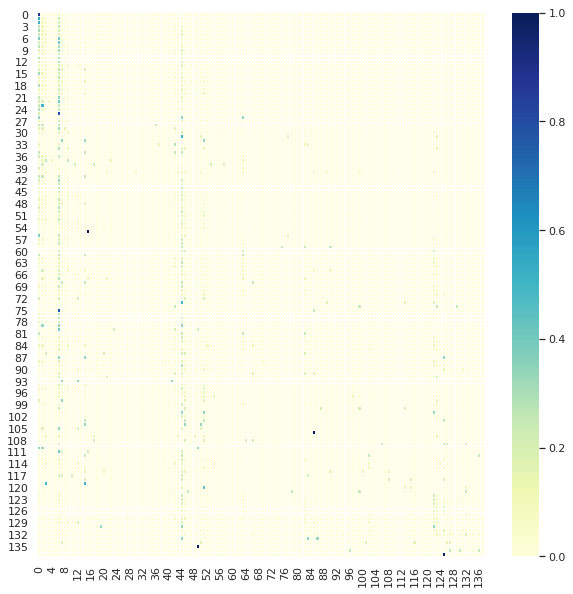

Nonzero percentage:  15.76 %


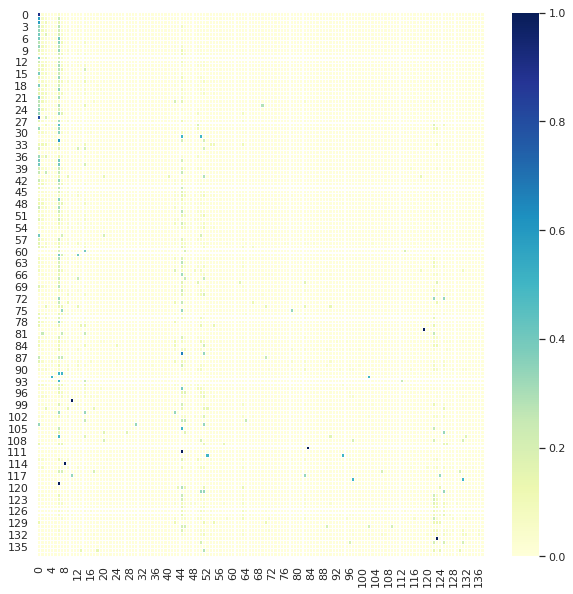

Nonzero percentage:  15.58 %


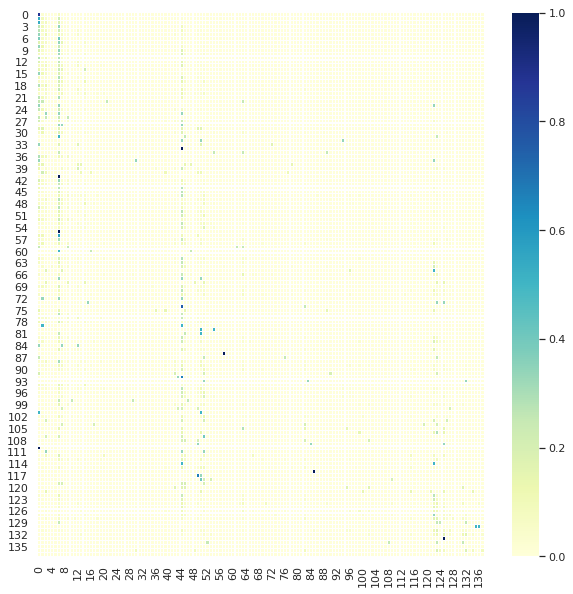

Nonzero percentage:  14.79 %


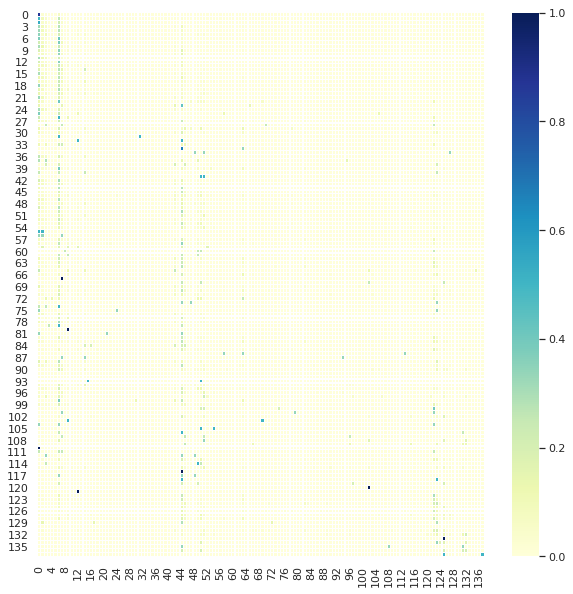

Nonzero percentage:  15.75 %


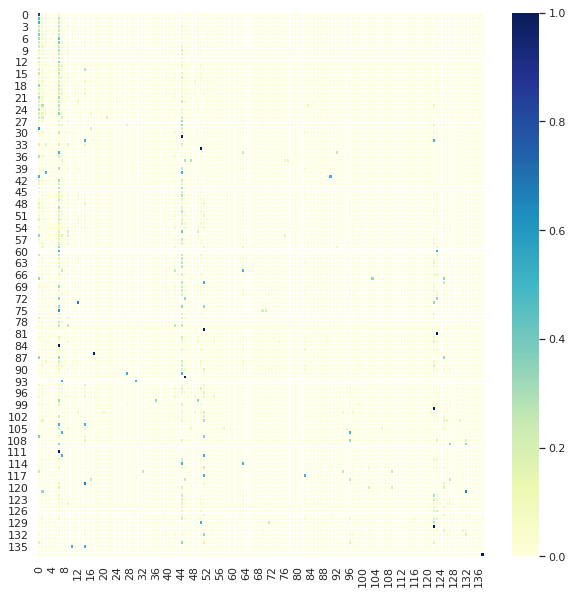

Nonzero percentage:  17.69 %


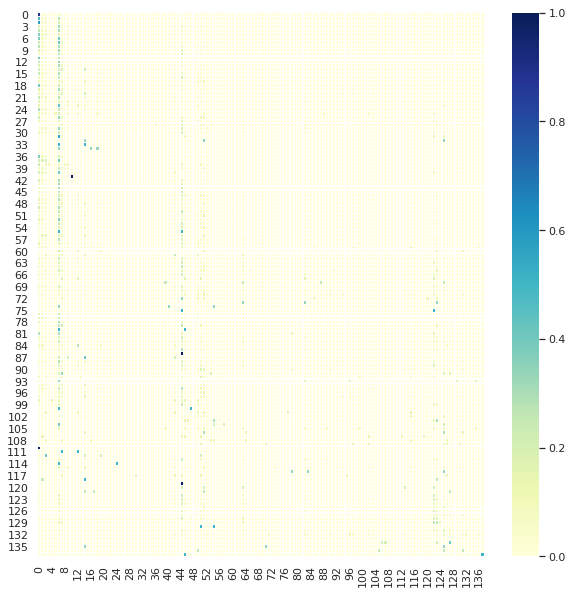

Nonzero percentage:  17.31 %


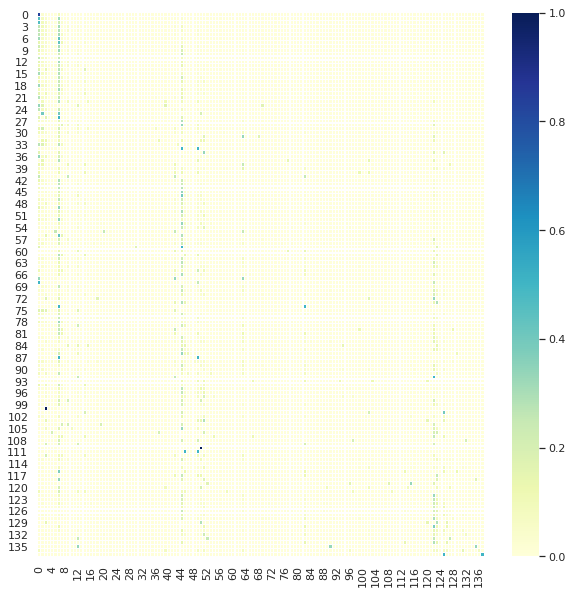

Nonzero percentage:  19.64 %


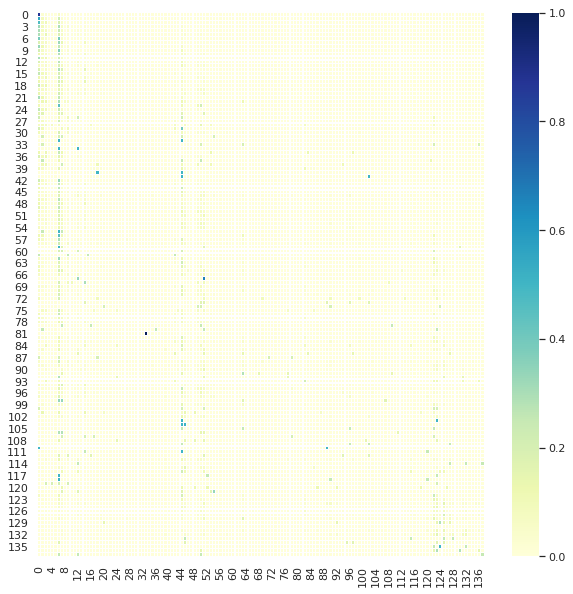

Nonzero percentage:  20.94 %


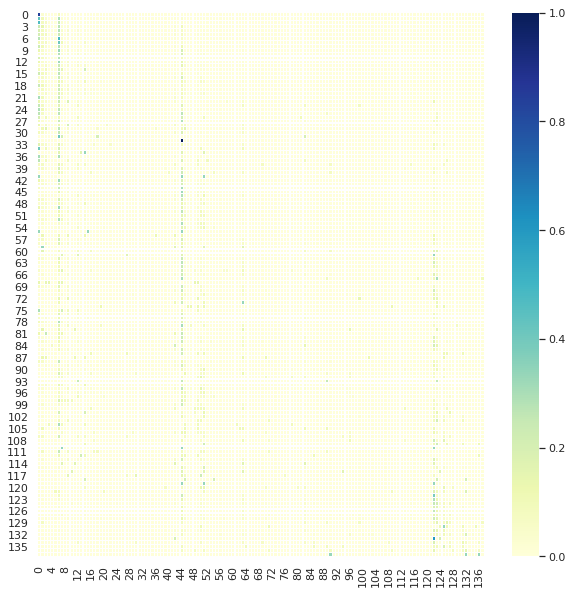

Nonzero percentage:  19.84 %


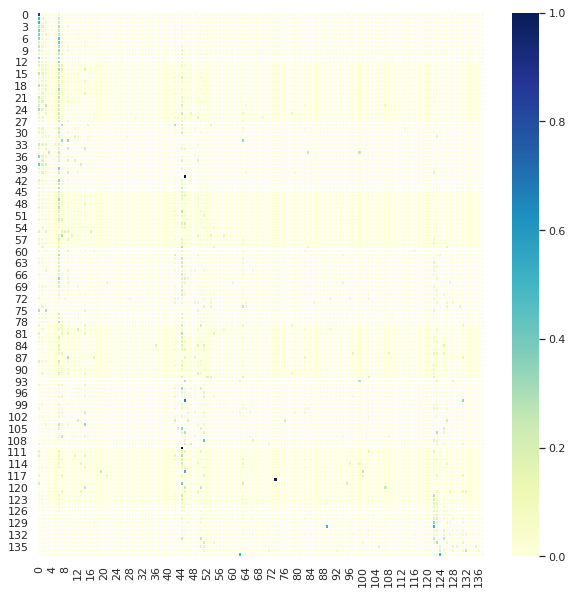

Nonzero percentage:  17.69 %


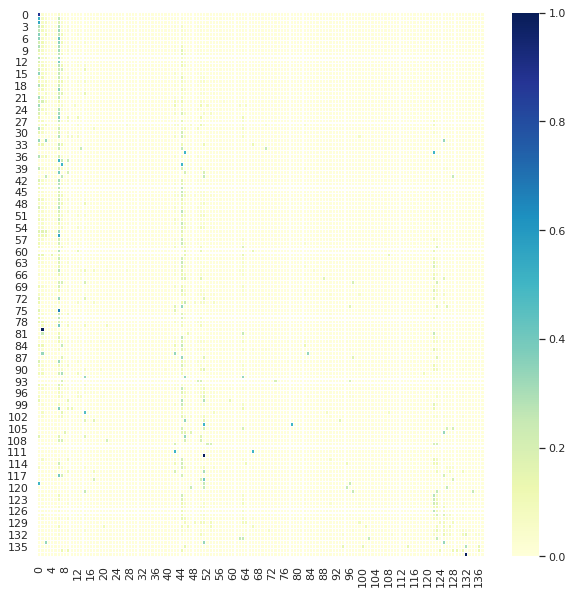

Nonzero percentage:  17.39 %


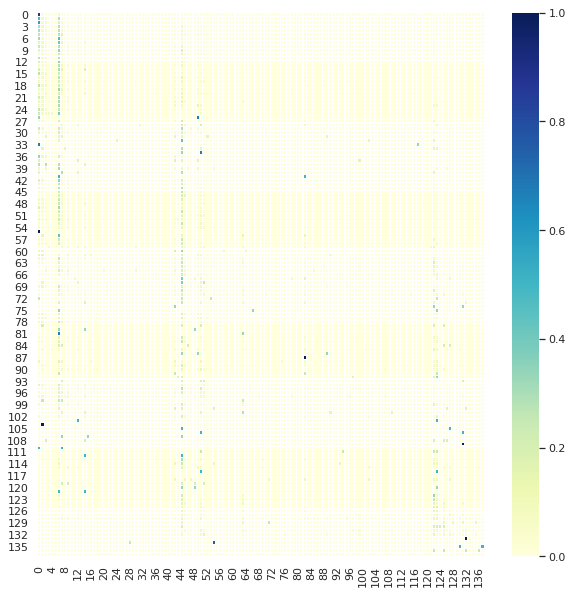

Nonzero percentage:  17.45 %


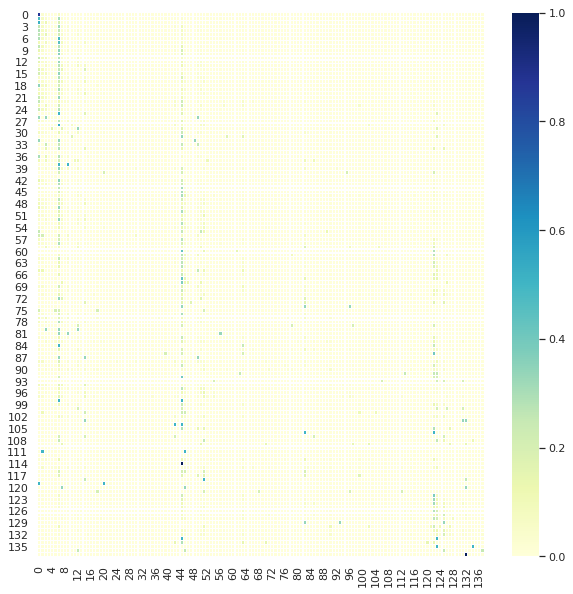

Nonzero percentage:  18.4 %


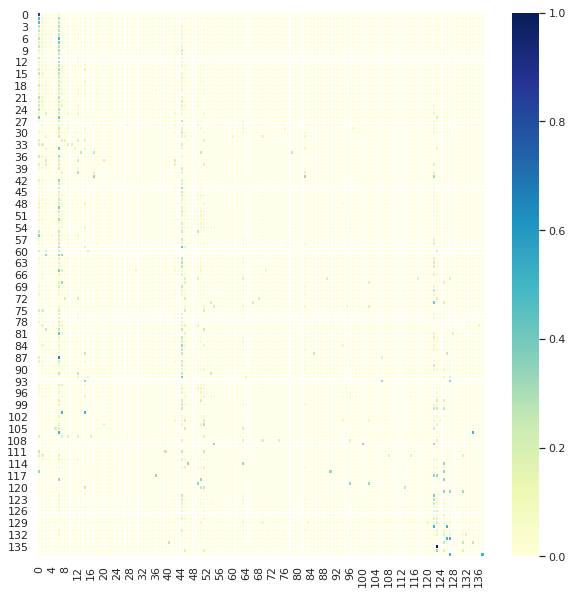

Nonzero percentage:  19.74 %


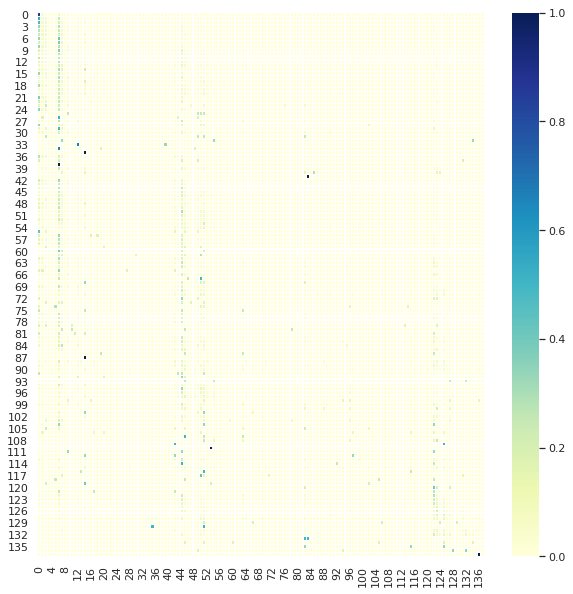

Nonzero percentage:  22.49 %


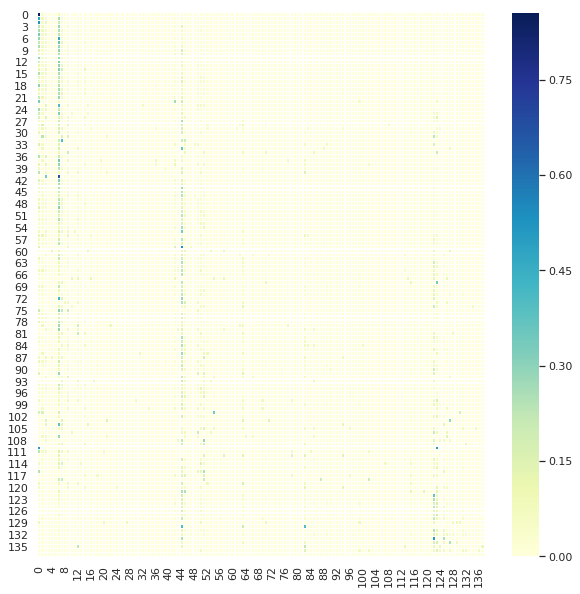

Nonzero percentage:  22.23 %


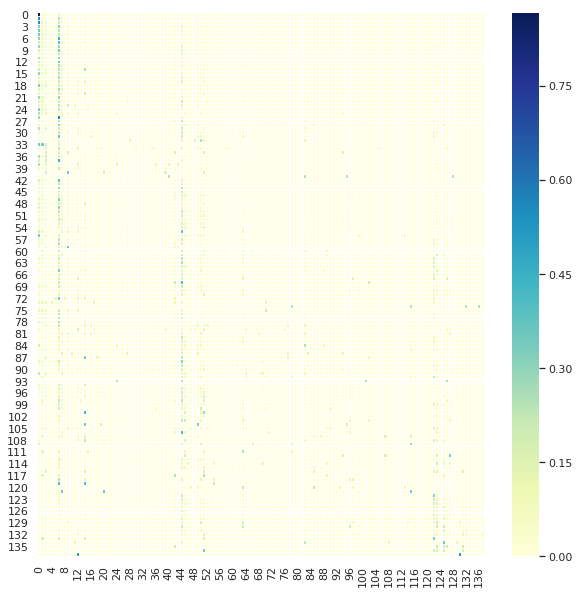

Nonzero percentage:  22.56 %


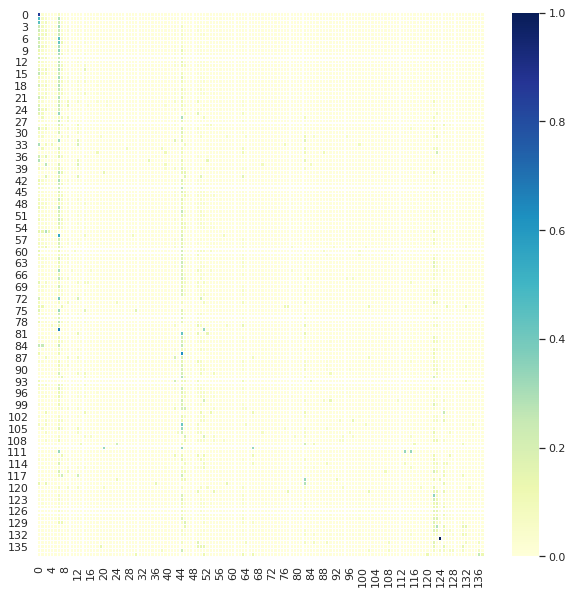

Nonzero percentage:  23.1 %


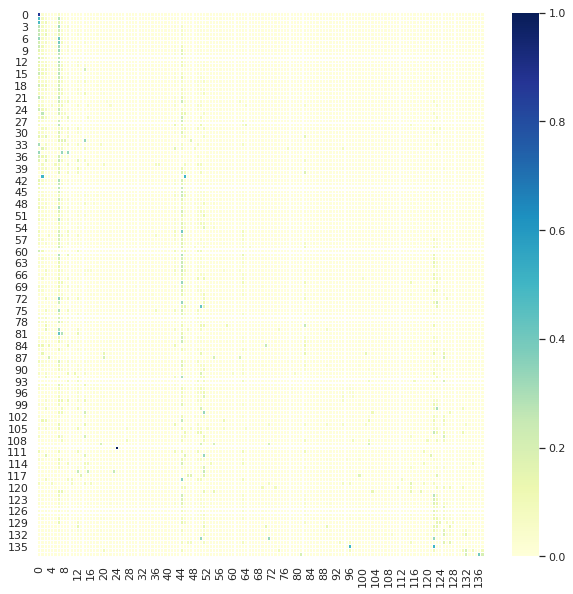

Nonzero percentage:  23.03 %


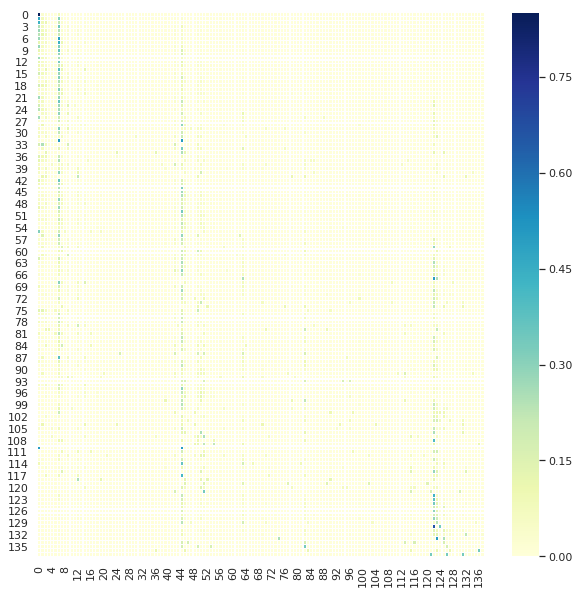

Nonzero percentage:  21.57 %


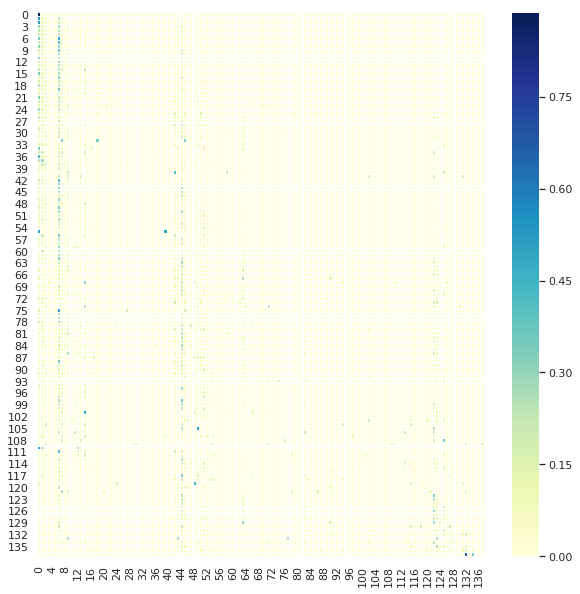

Nonzero percentage:  21.59 %


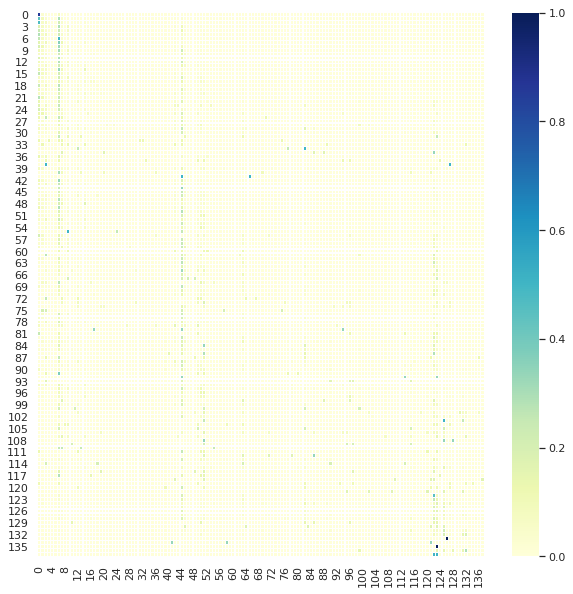

Nonzero percentage:  20.27 %


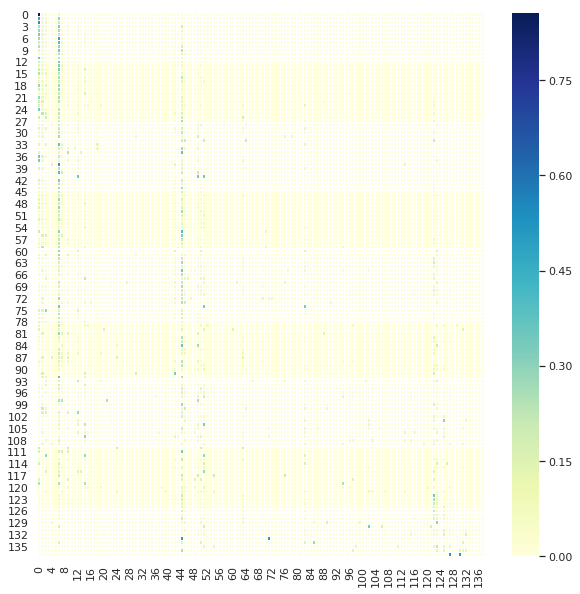

Nonzero percentage:  22.08 %


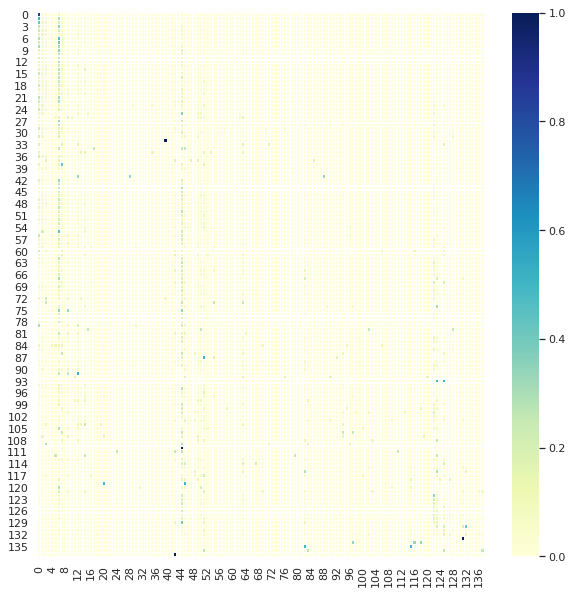

Nonzero percentage:  22.36 %


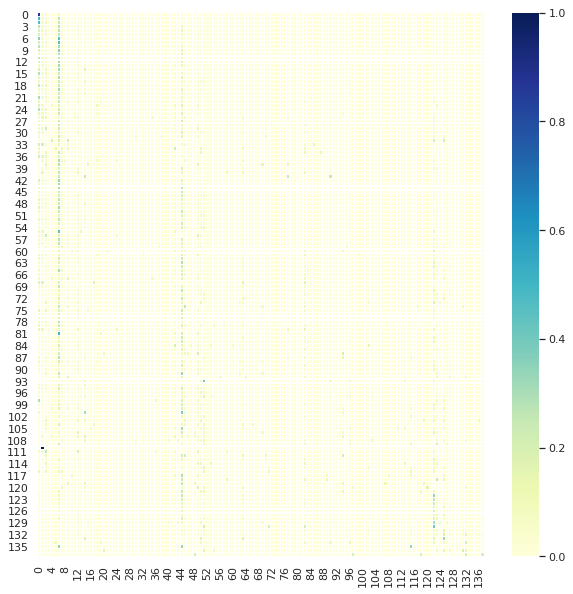

Nonzero percentage:  22.44 %


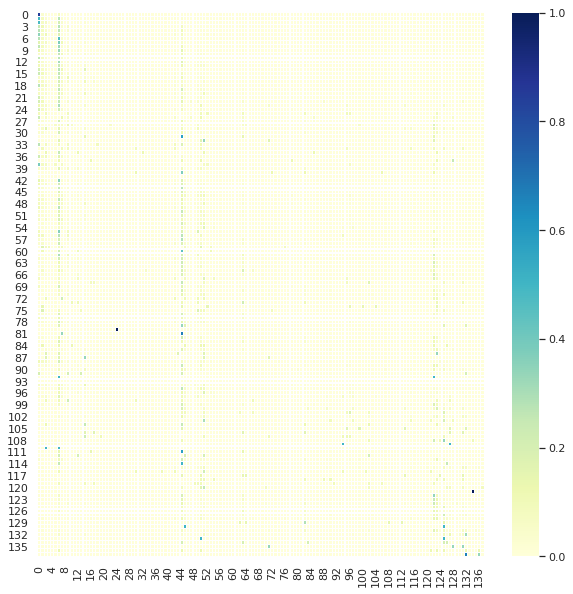

Nonzero percentage:  23.0 %


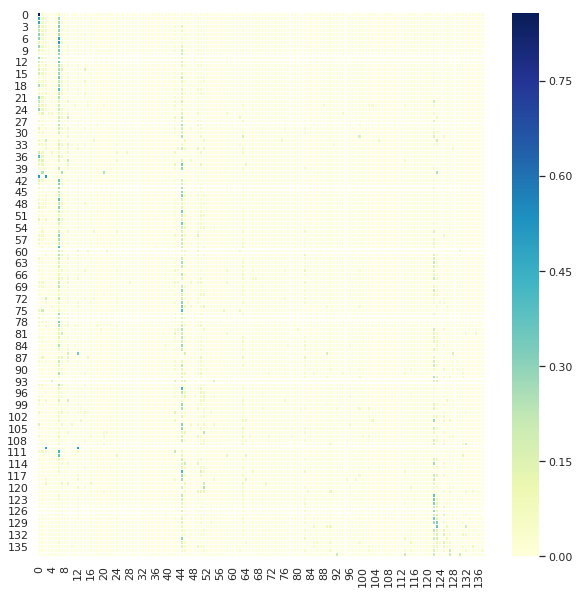

Nonzero percentage:  21.32 %


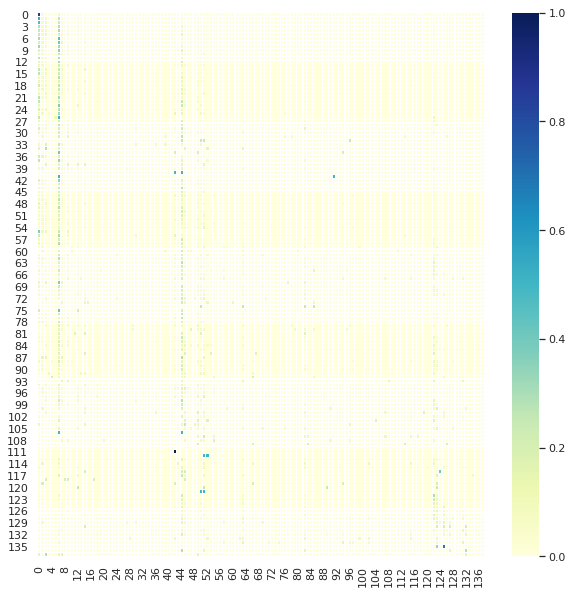

Nonzero percentage:  23.08 %


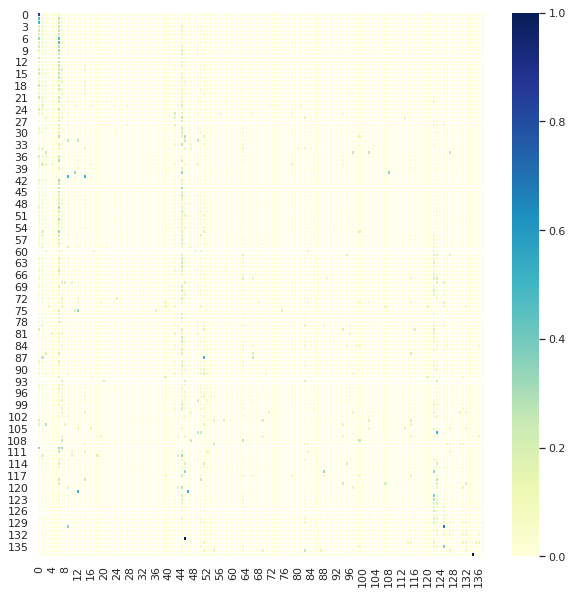

Nonzero percentage:  23.42 %


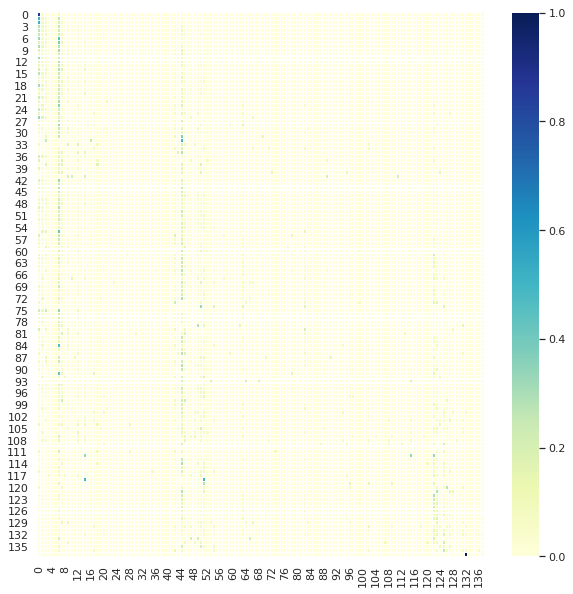

Nonzero percentage:  26.52 %


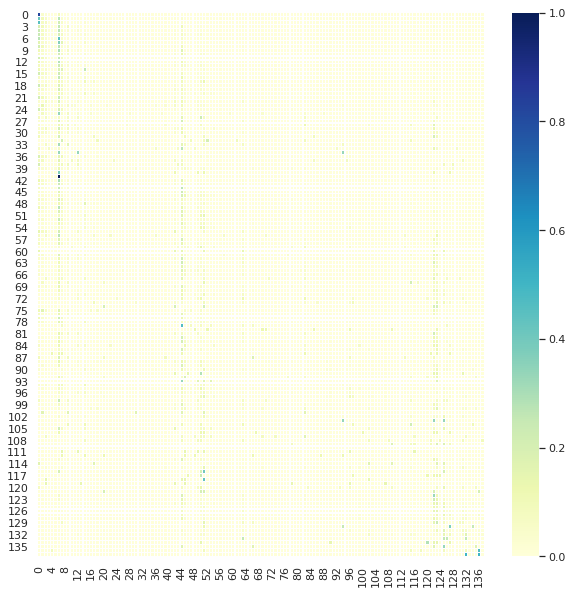

Nonzero percentage:  30.0 %


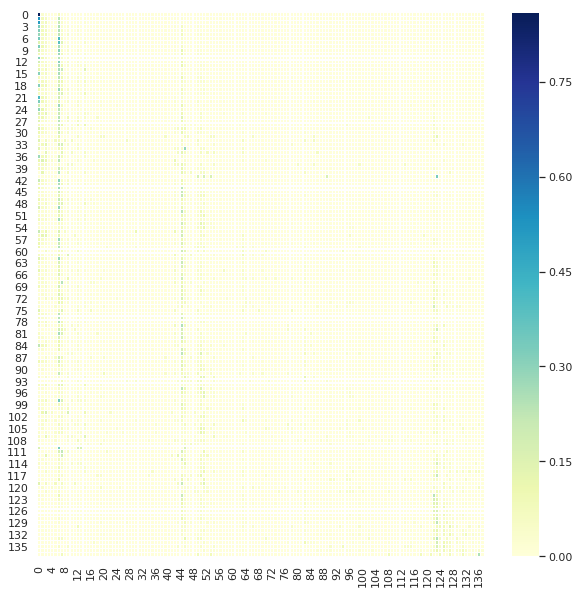

Nonzero percentage:  28.54 %


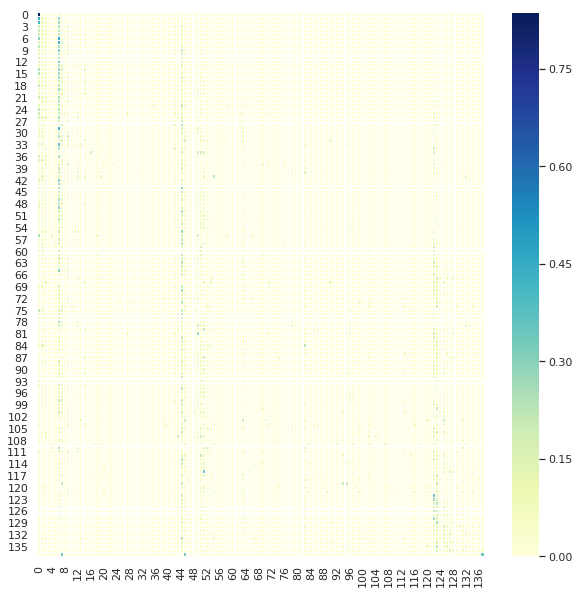

Nonzero percentage:  27.51 %


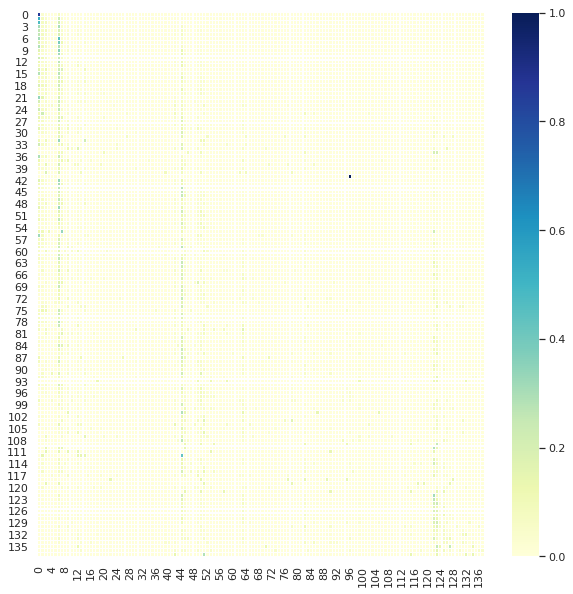

Nonzero percentage:  25.42 %


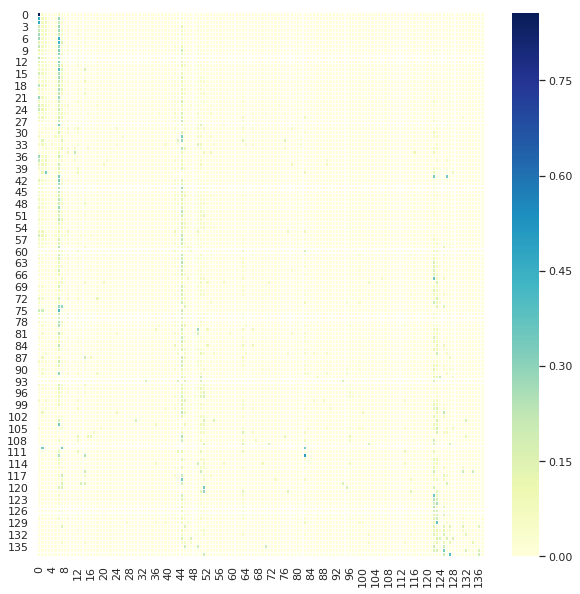

Nonzero percentage:  25.71 %


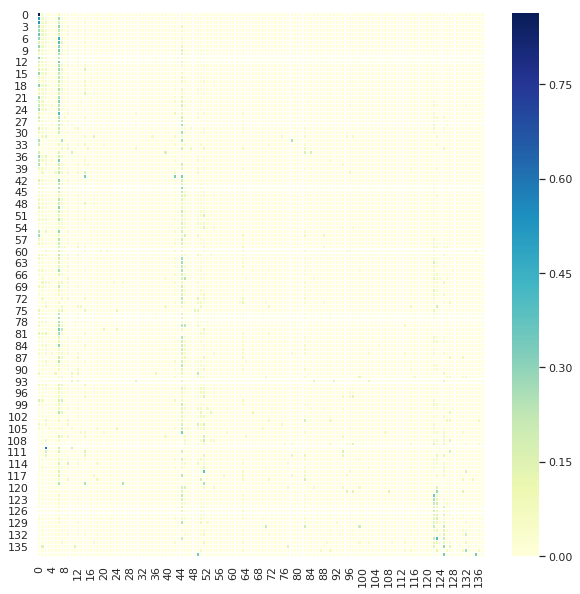

Nonzero percentage:  26.58 %


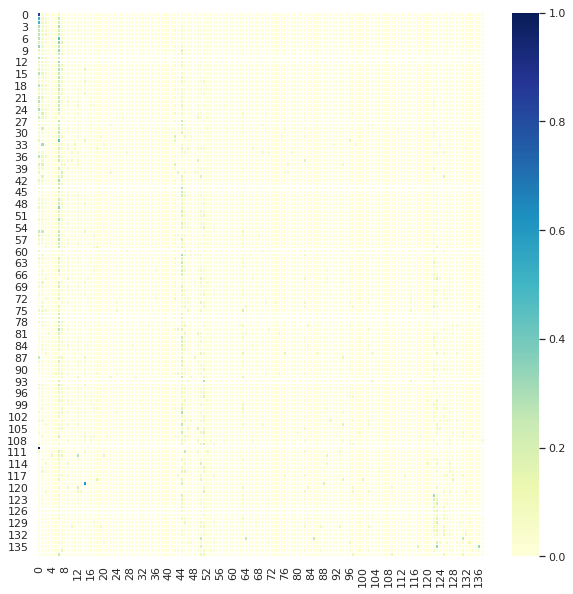

Nonzero percentage:  27.31 %


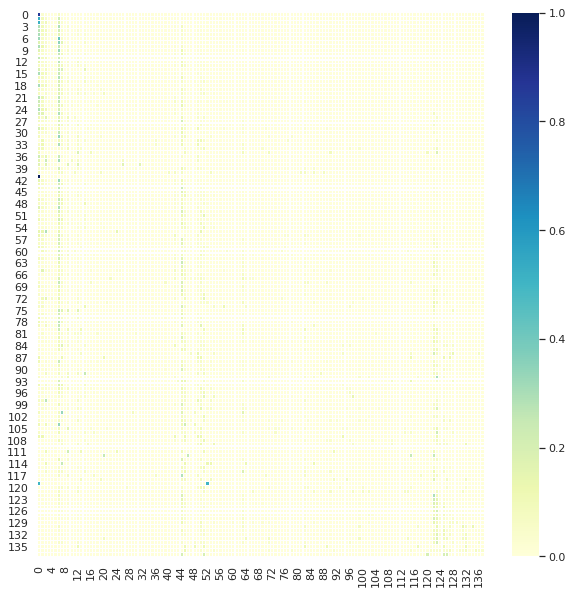

Nonzero percentage:  29.45 %


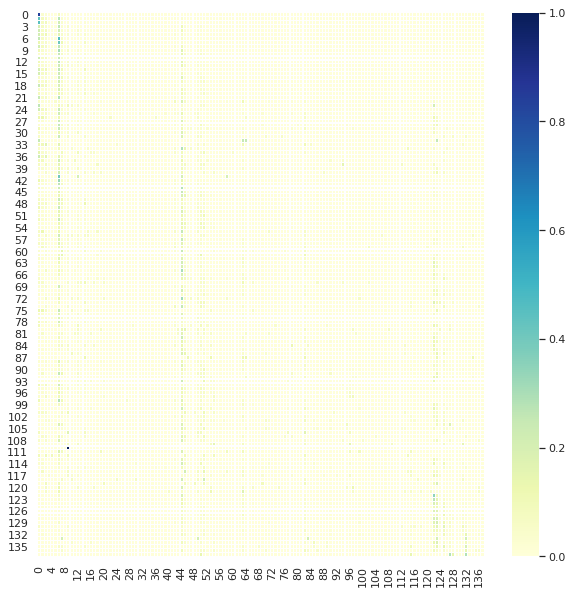

Nonzero percentage:  29.21 %


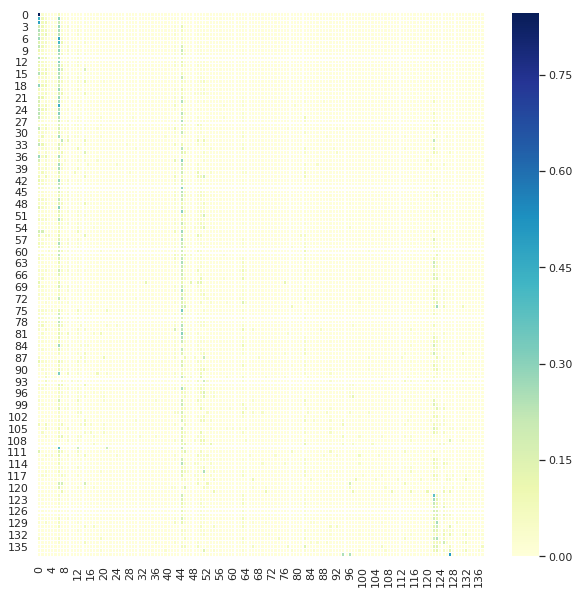

Nonzero percentage:  29.73 %


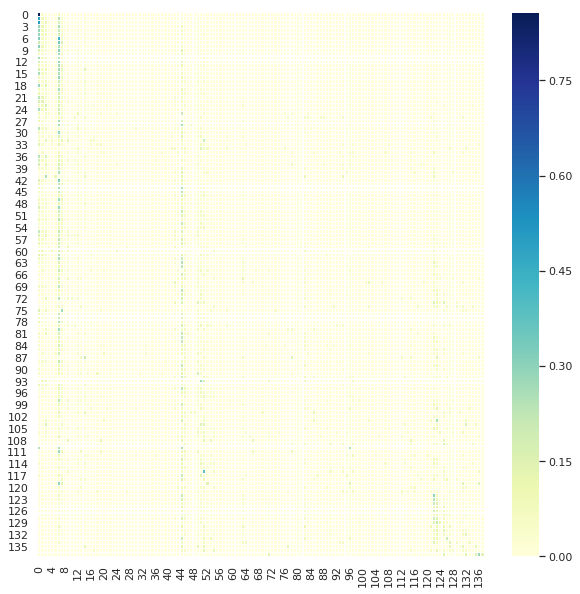

Nonzero percentage:  30.79 %


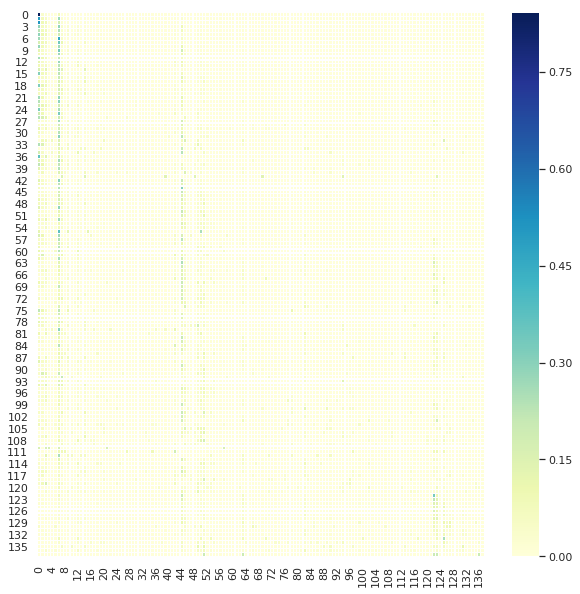

Nonzero percentage:  29.03 %


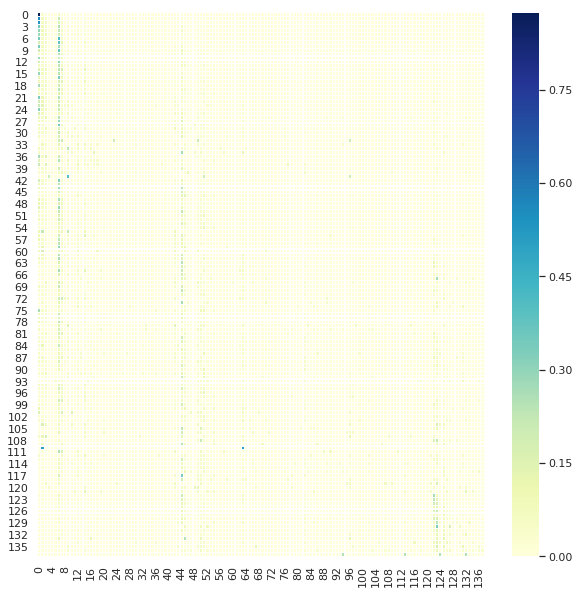

Nonzero percentage:  28.04 %


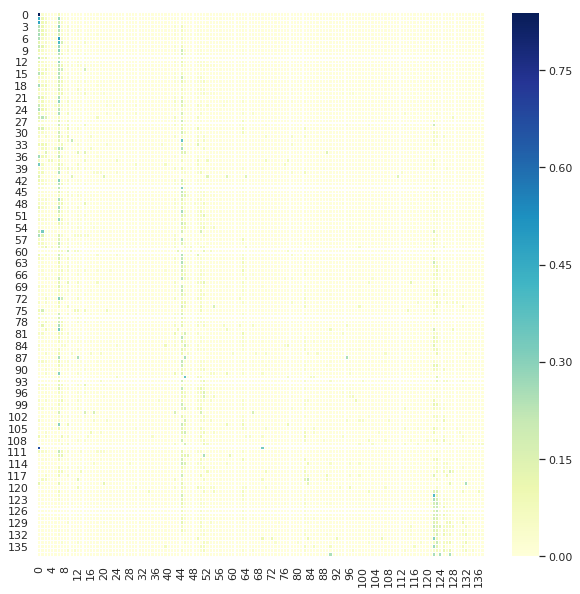

Nonzero percentage:  27.67 %


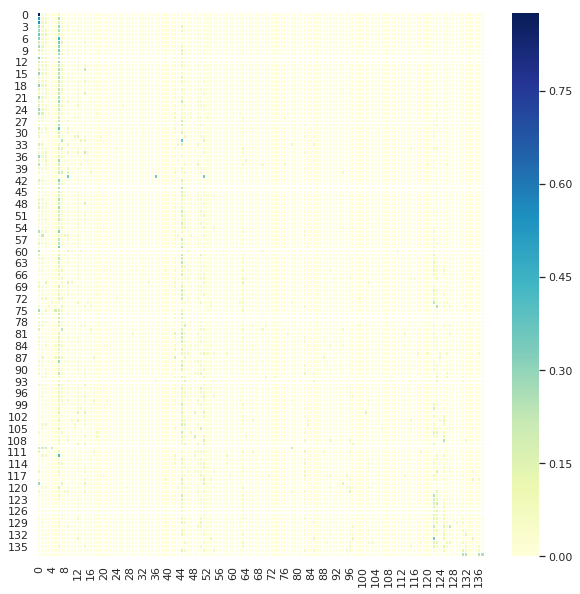

Nonzero percentage:  27.83 %


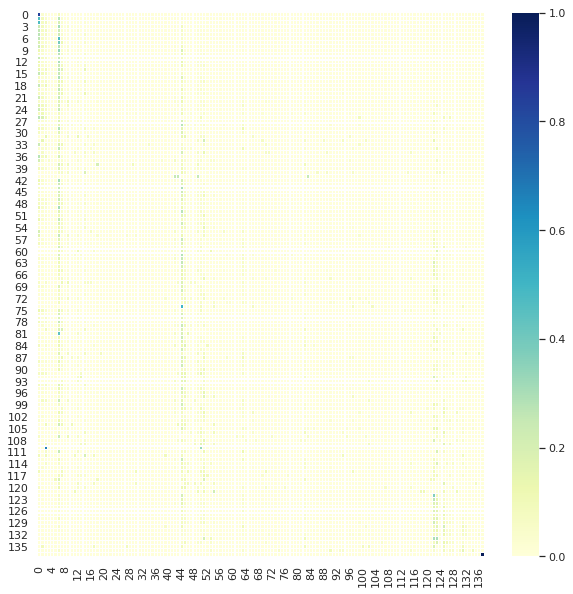

Nonzero percentage:  26.69 %


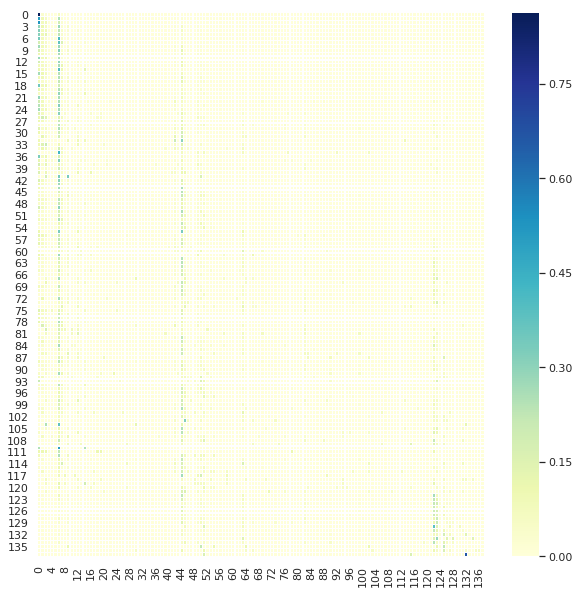

Nonzero percentage:  28.75 %


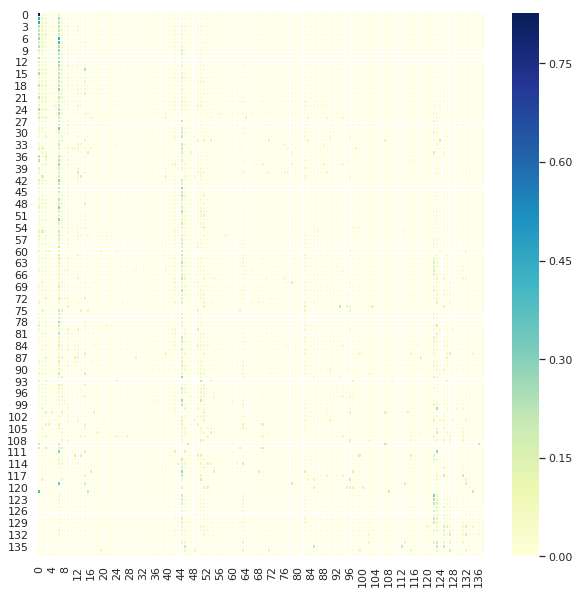

Nonzero percentage:  28.78 %


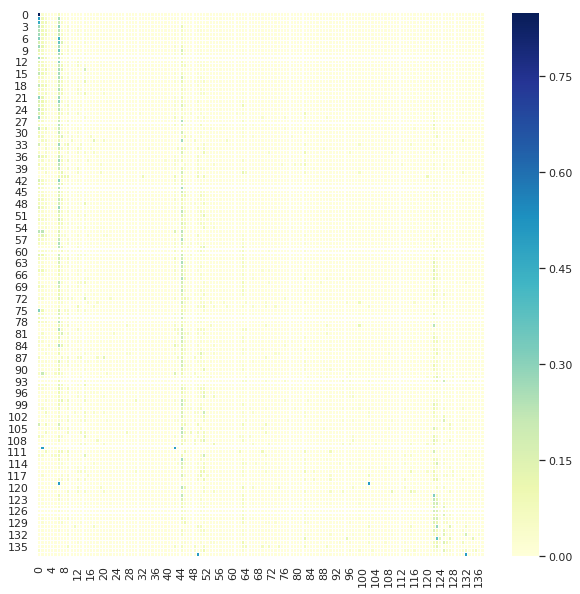

Nonzero percentage:  28.44 %


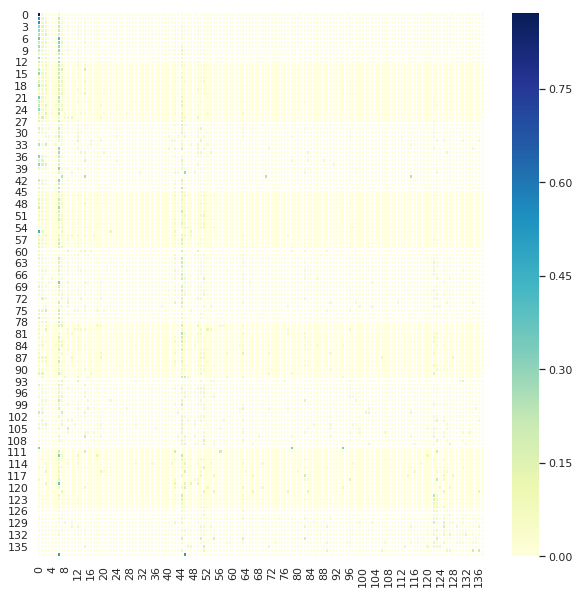

Nonzero percentage:  28.65 %


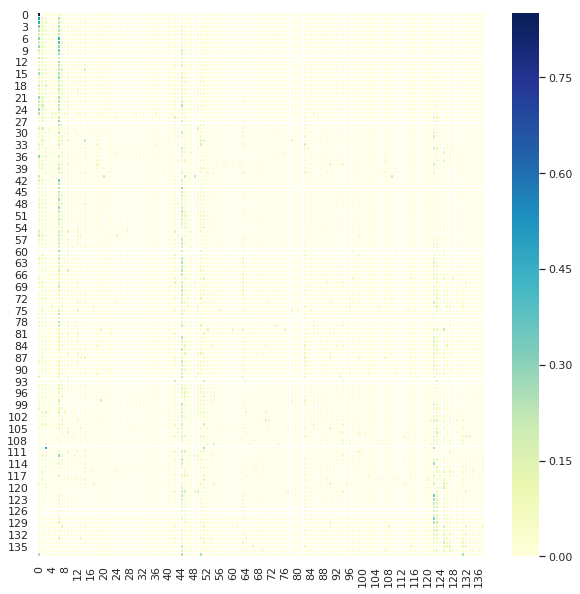

Nonzero percentage:  29.98 %


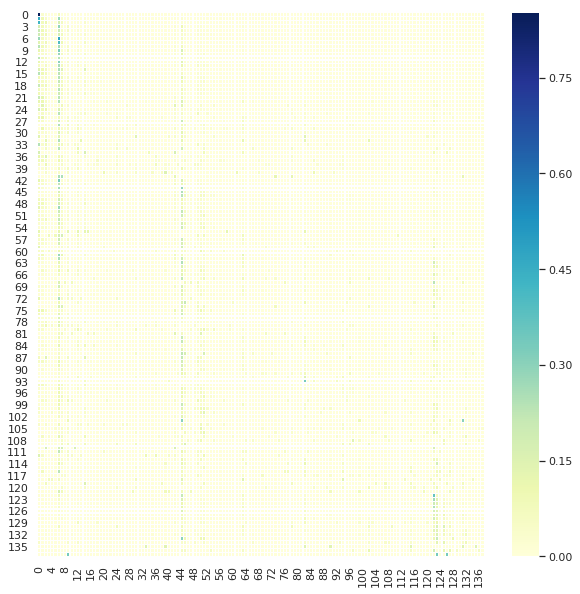

Nonzero percentage:  28.57 %


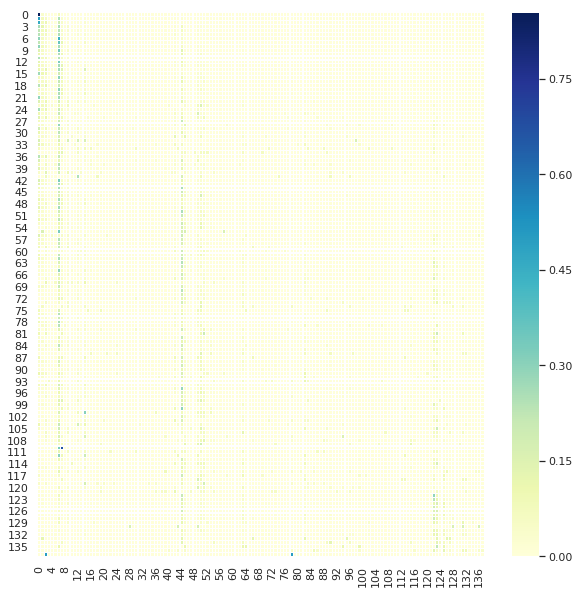

Nonzero percentage:  27.35 %


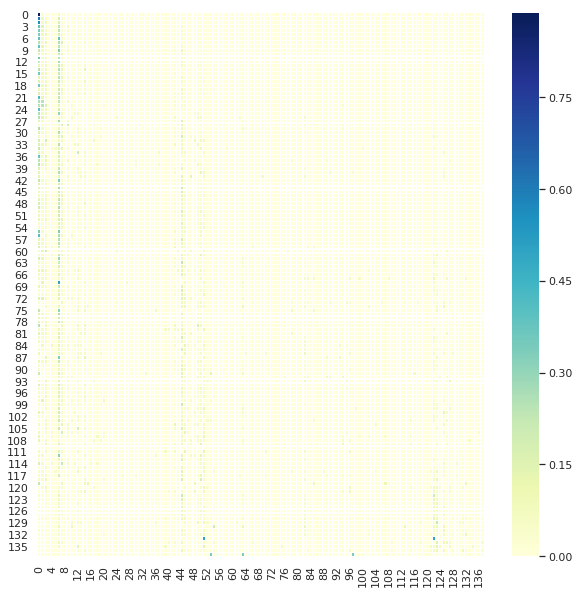

Nonzero percentage:  27.84 %


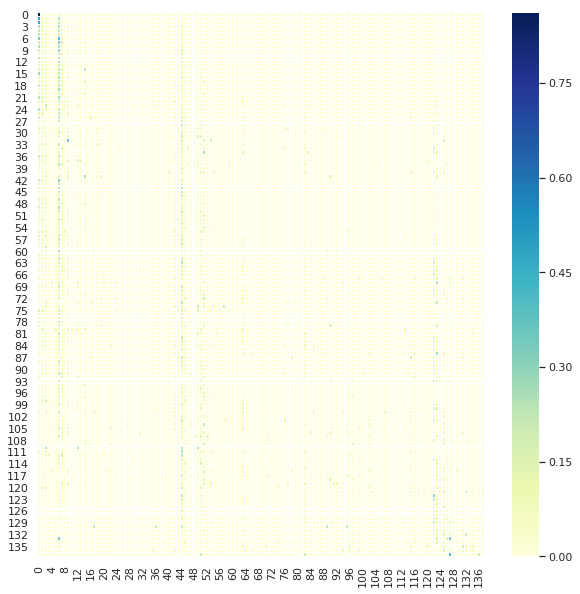

Nonzero percentage:  28.35 %


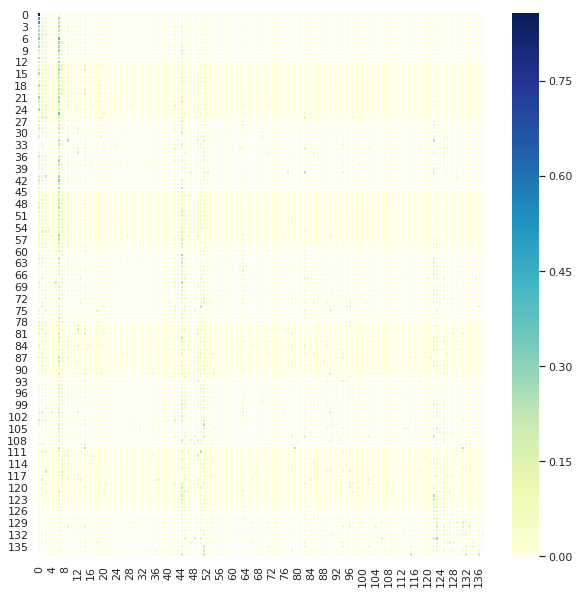

Nonzero percentage:  28.82 %


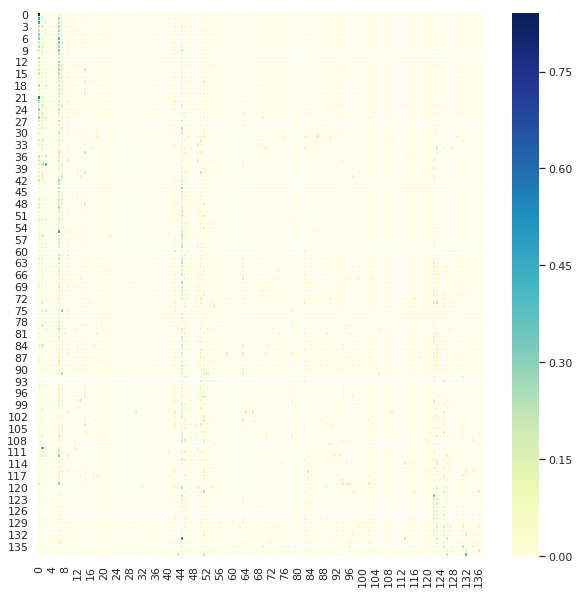

Nonzero percentage:  29.34 %


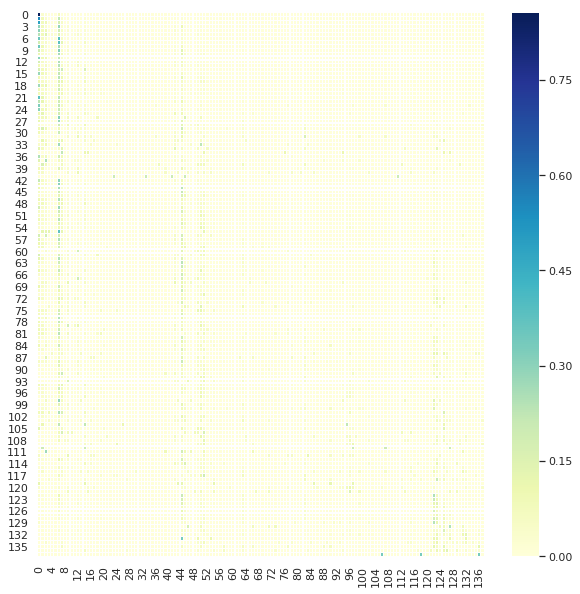

Nonzero percentage:  27.66 %


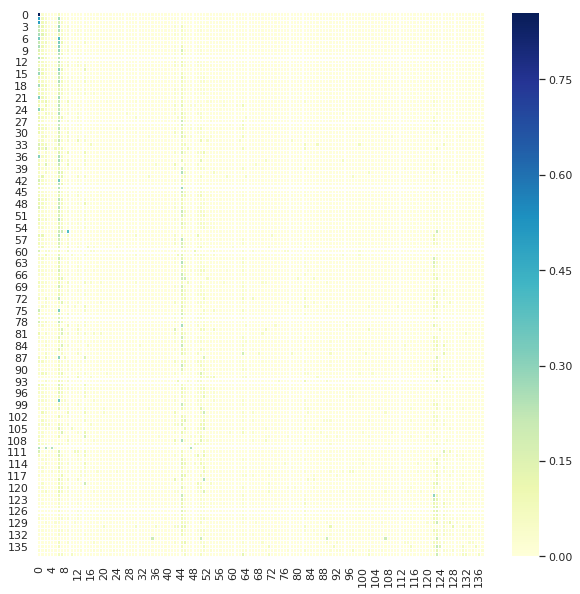

Nonzero percentage:  26.79 %


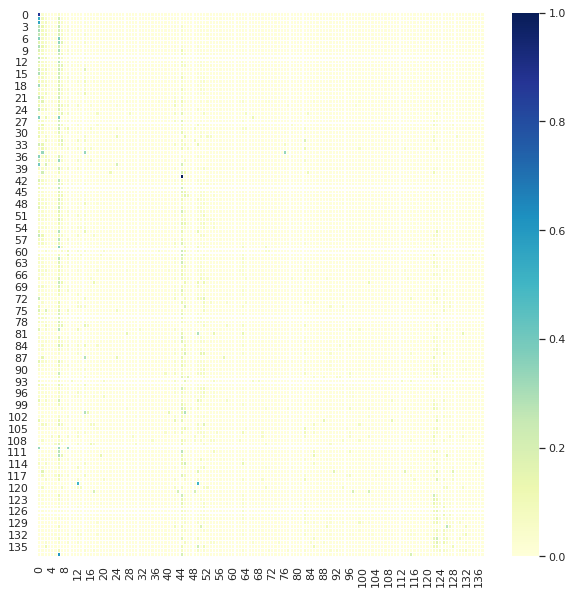

Nonzero percentage:  27.14 %


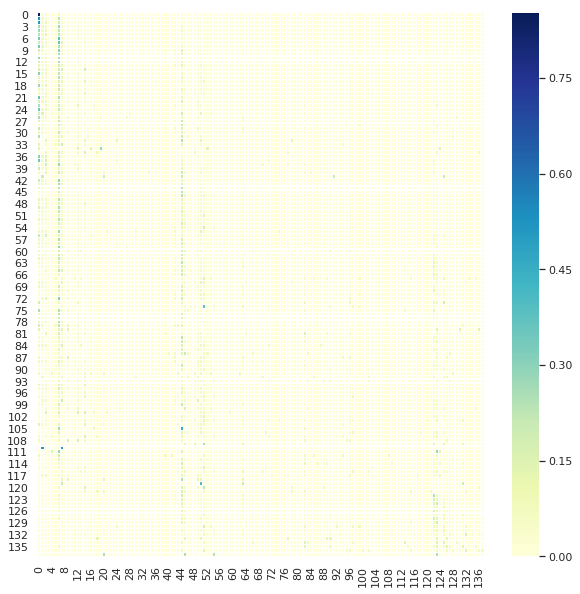

Nonzero percentage:  27.52 %


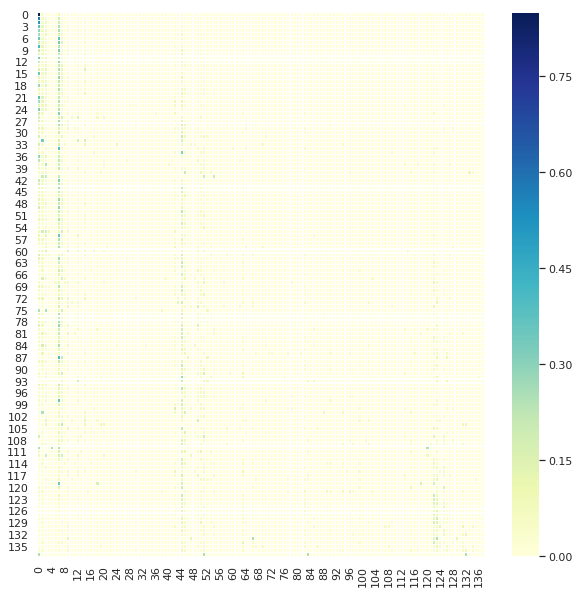

Nonzero percentage:  28.41 %


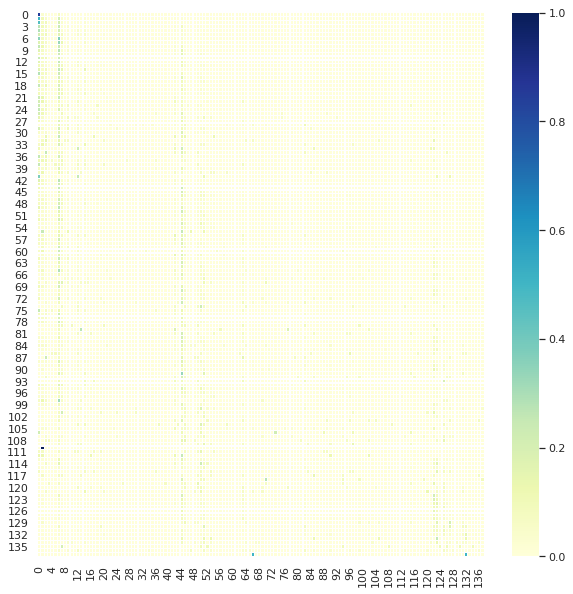

Nonzero percentage:  29.31 %


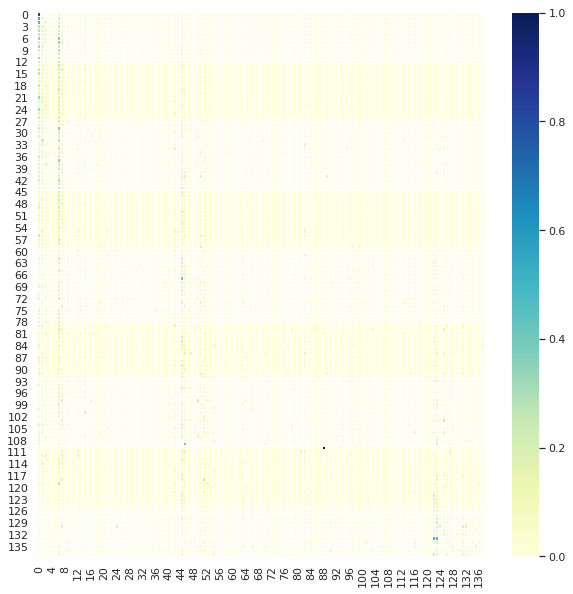

Nonzero percentage:  29.88 %


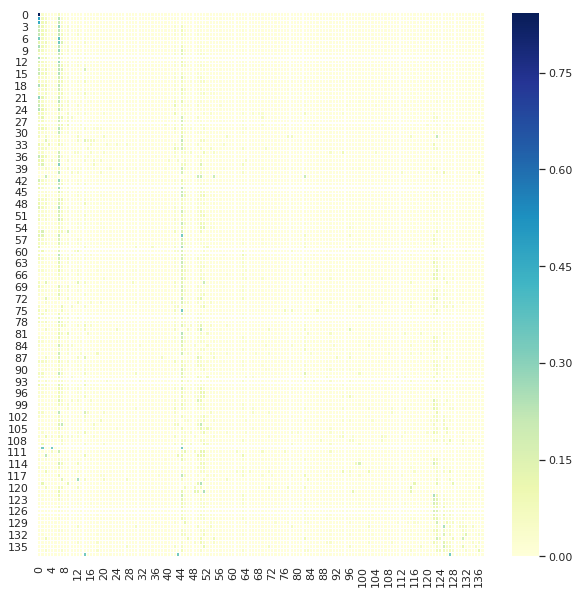

Nonzero percentage:  28.13 %


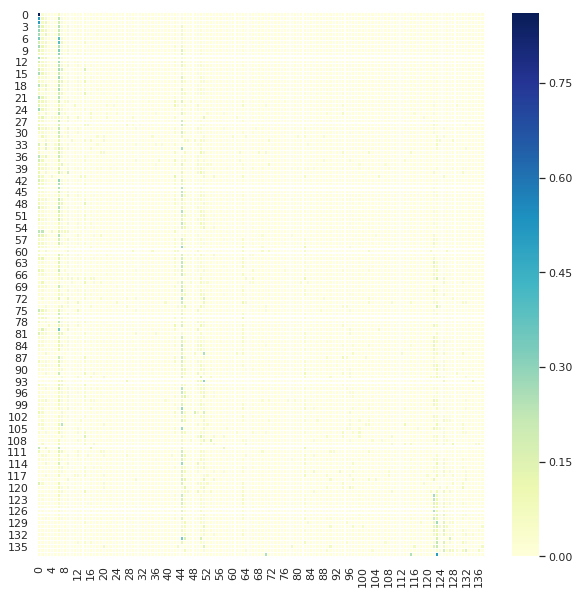

Nonzero percentage:  27.61 %


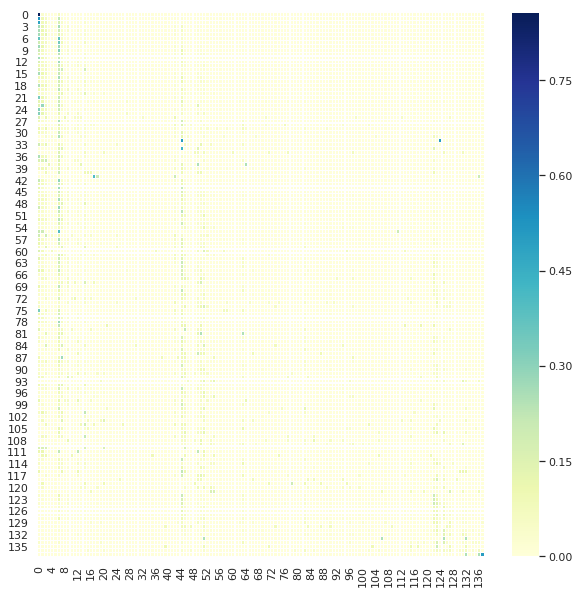

Nonzero percentage:  28.26 %


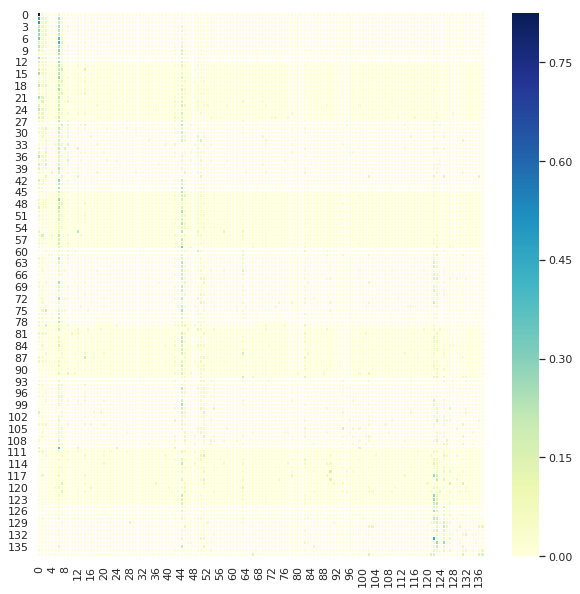

Nonzero percentage:  29.03 %


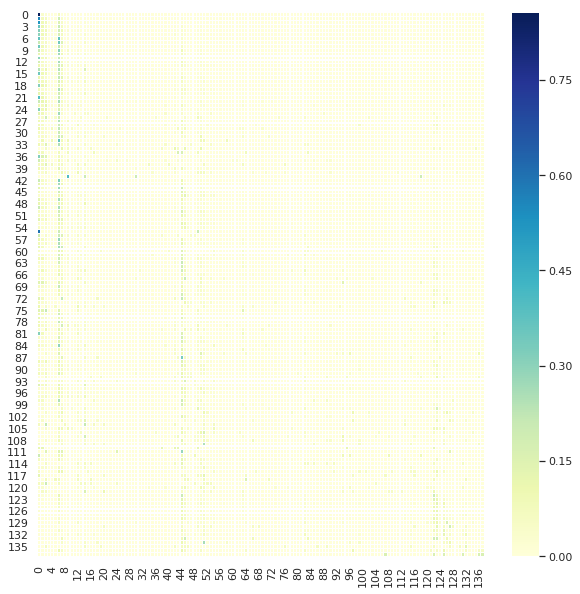

Nonzero percentage:  28.62 %


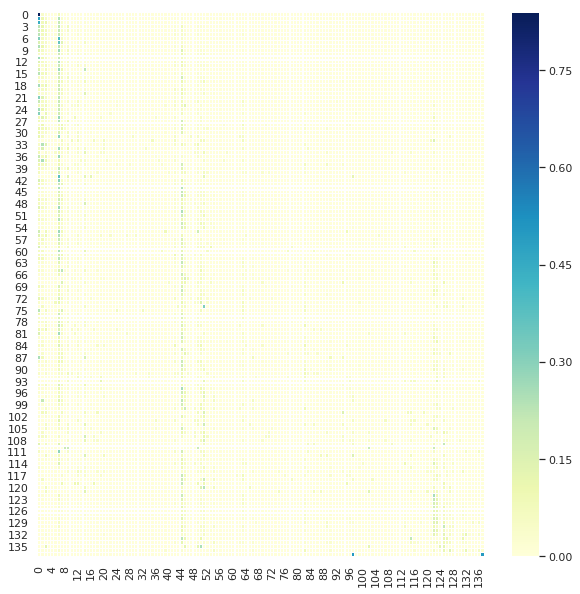

Nonzero percentage:  29.21 %


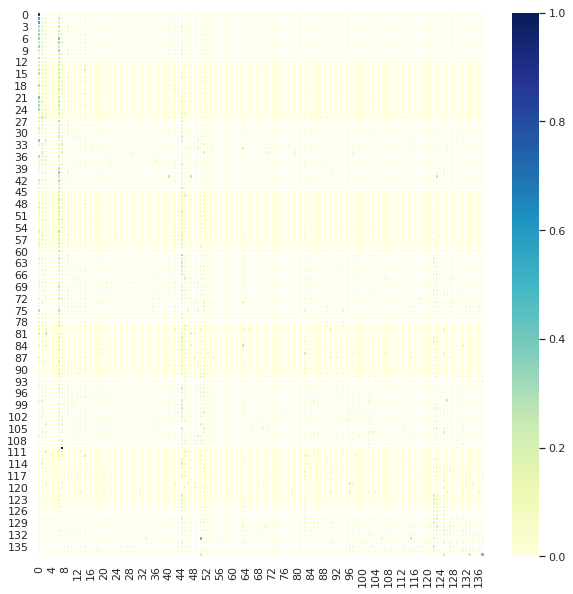

Nonzero percentage:  29.52 %


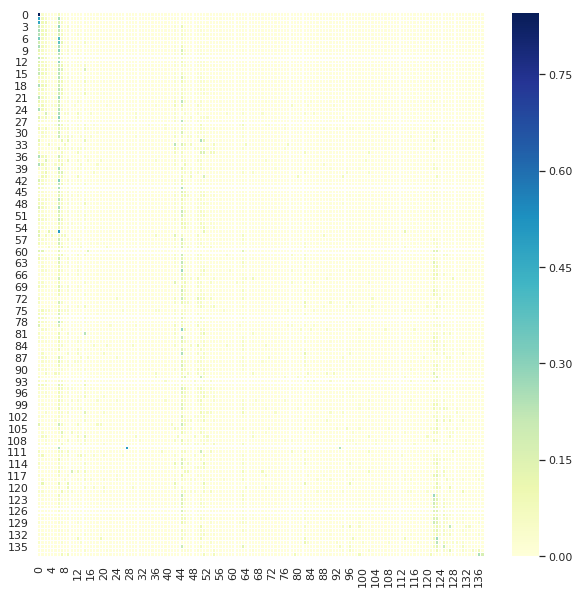

Nonzero percentage:  28.37 %


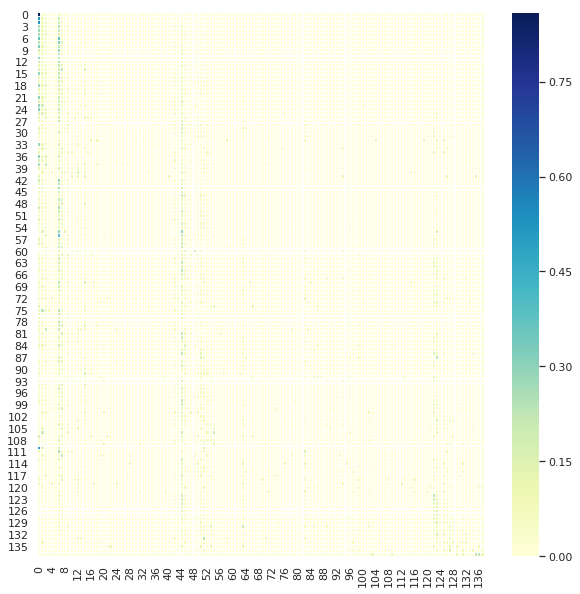

Nonzero percentage:  29.12 %


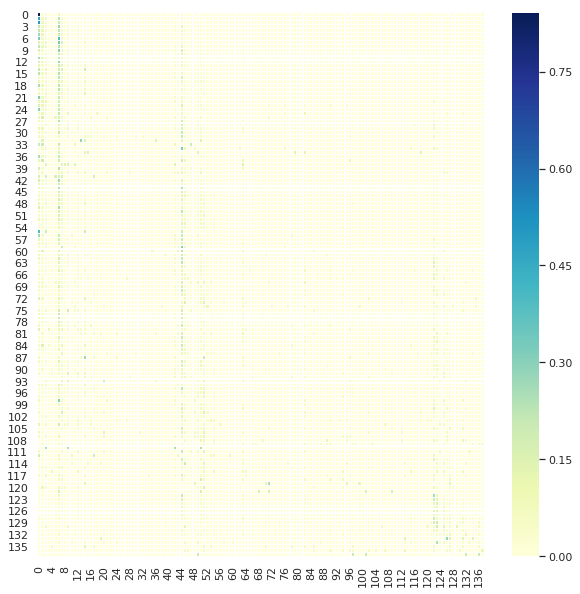

Nonzero percentage:  30.07 %


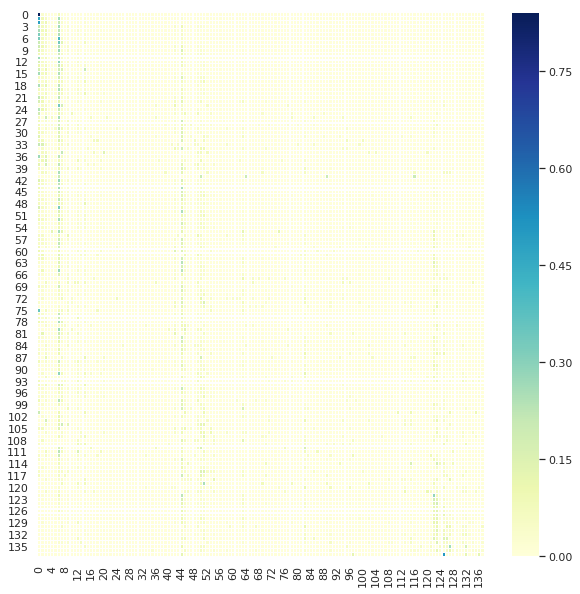

Nonzero percentage:  31.56 %


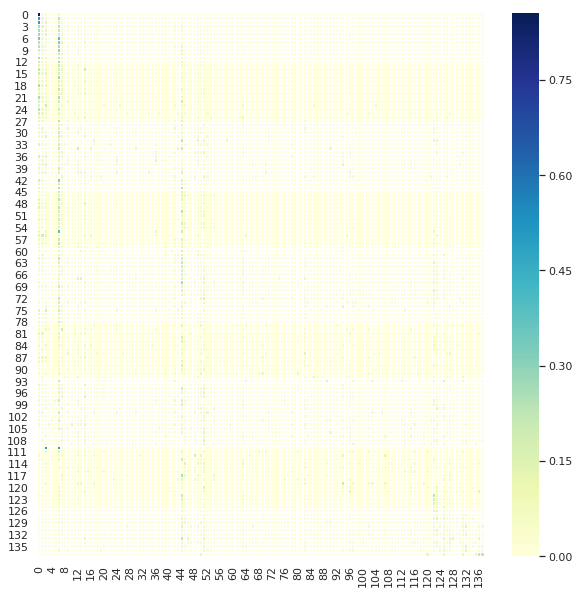

Nonzero percentage:  31.04 %


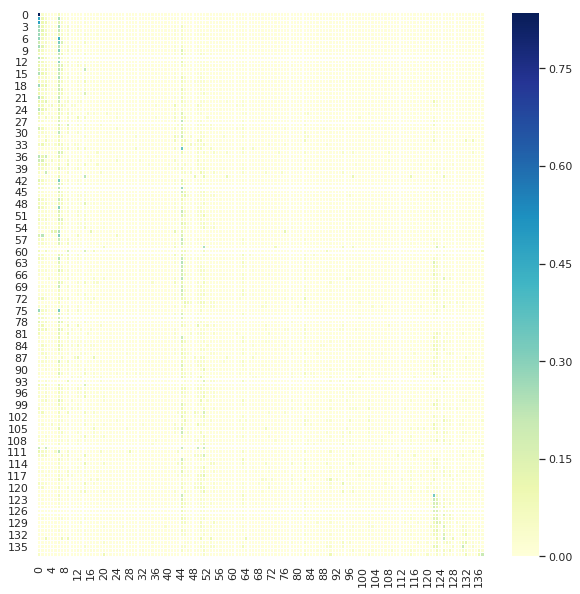

Nonzero percentage:  31.74 %


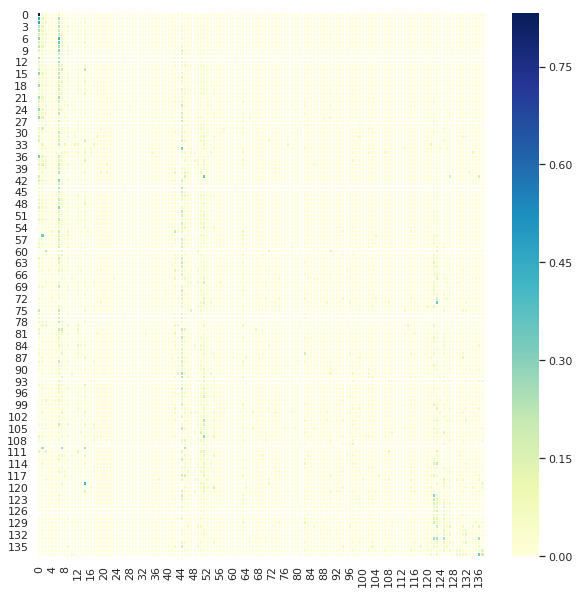

Nonzero percentage:  33.44 %


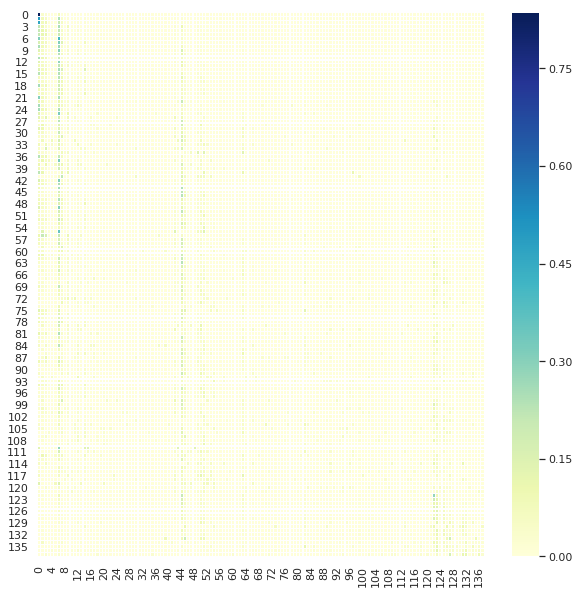

Nonzero percentage:  32.75 %


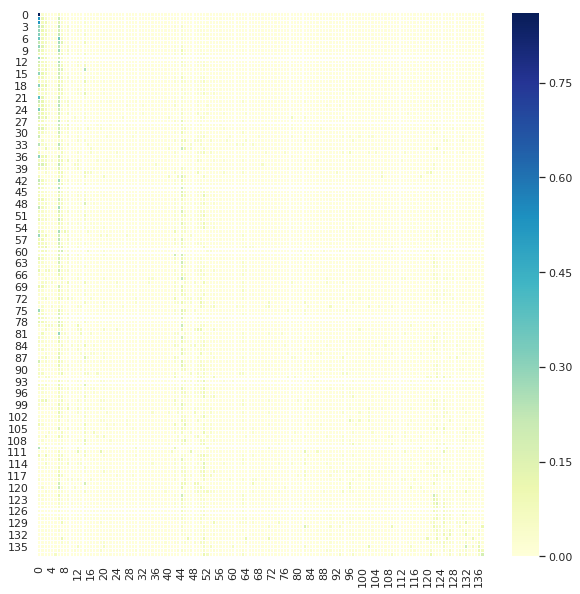

Nonzero percentage:  33.39 %


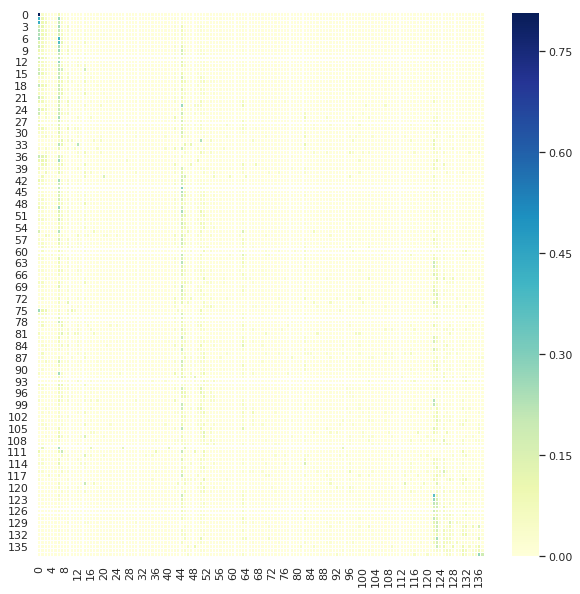

Nonzero percentage:  32.34 %


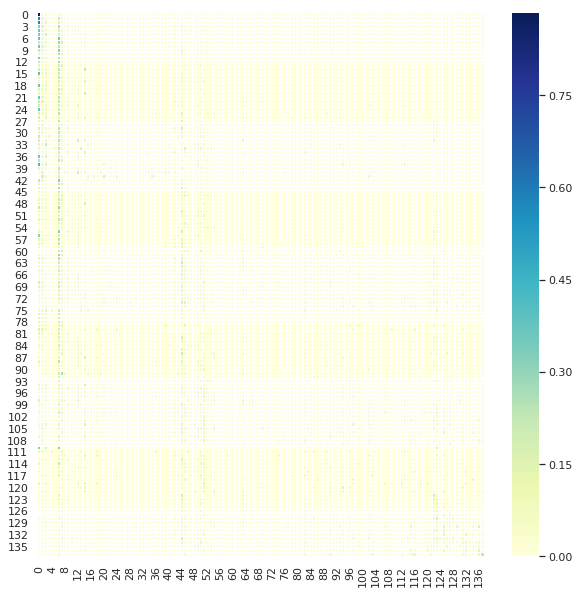

Nonzero percentage:  31.57 %


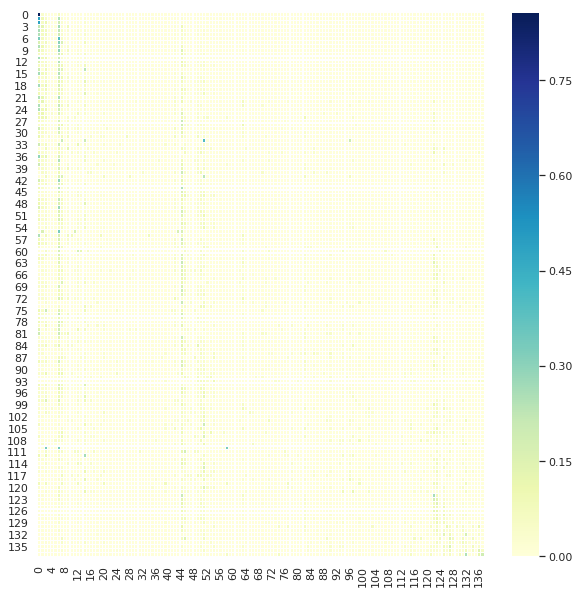

Nonzero percentage:  31.34 %


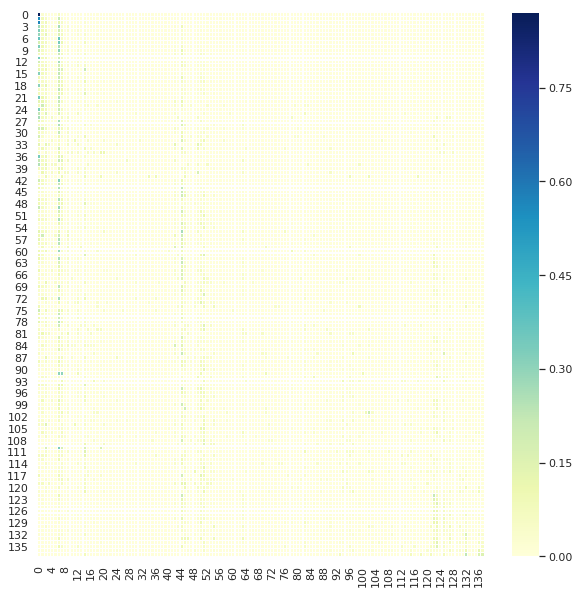

Nonzero percentage:  29.11 %


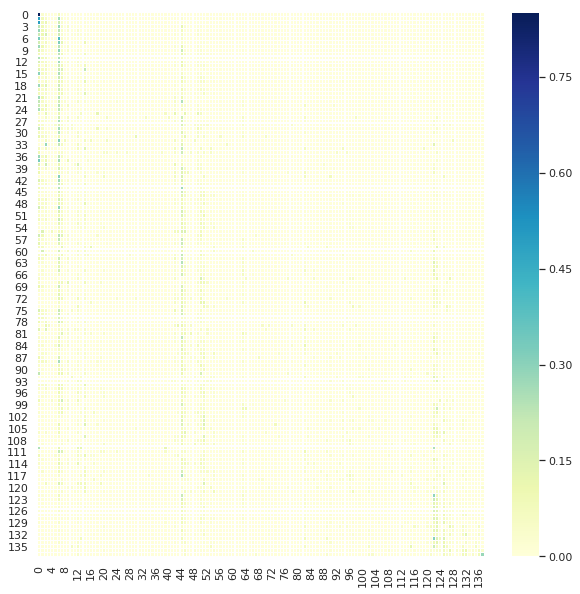

Nonzero percentage:  28.34 %


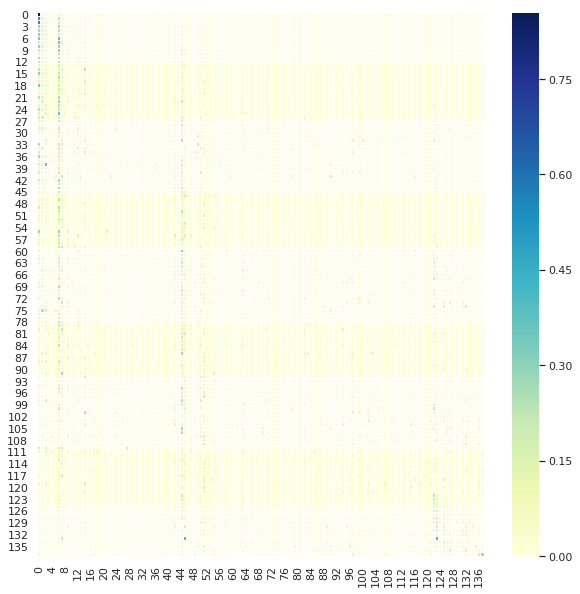

Nonzero percentage:  29.57 %


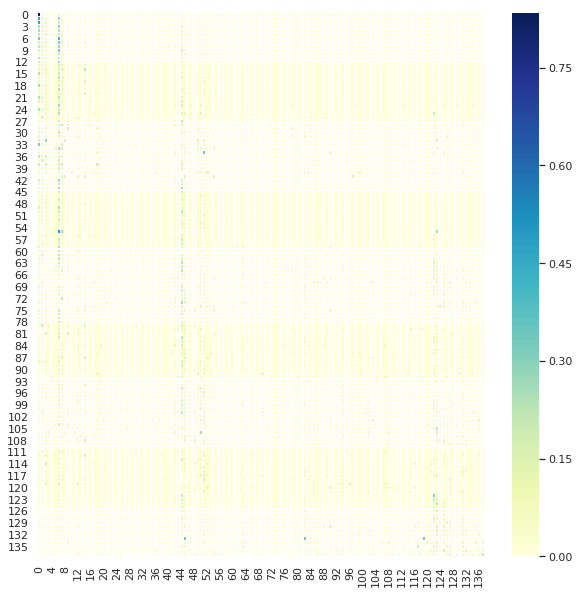

Nonzero percentage:  29.43 %


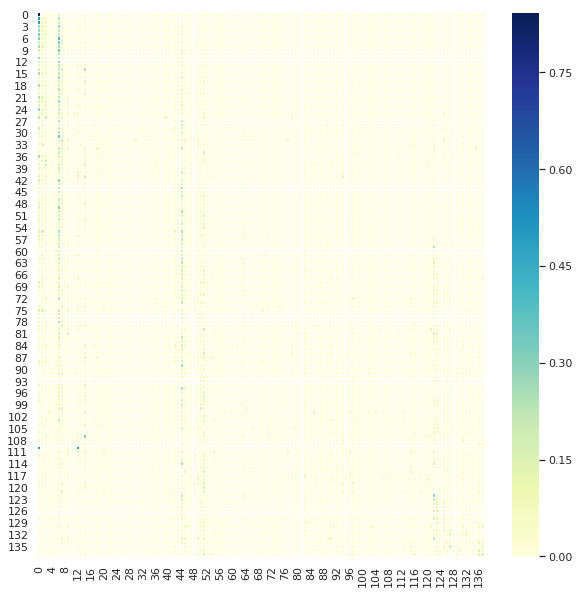

Nonzero percentage:  29.97 %


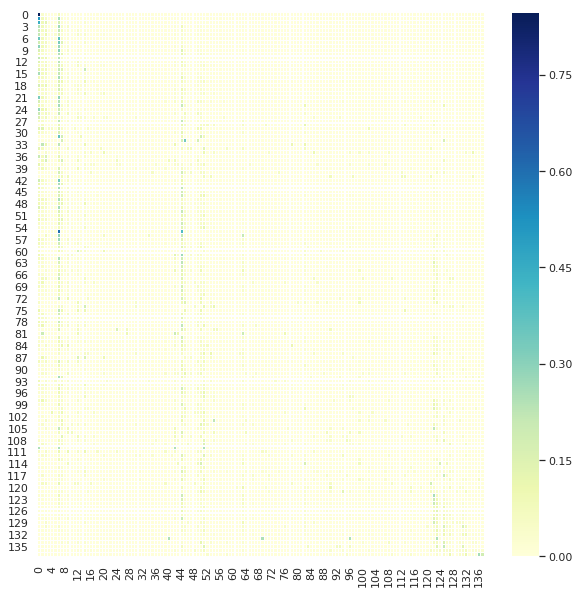

Nonzero percentage:  30.17 %


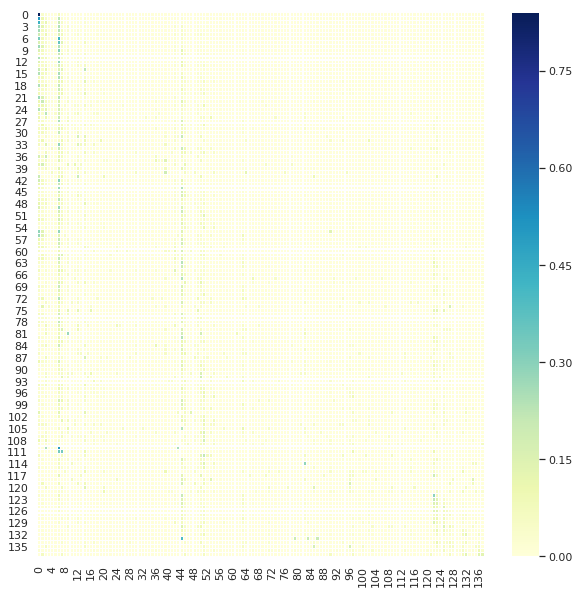

Nonzero percentage:  28.72 %


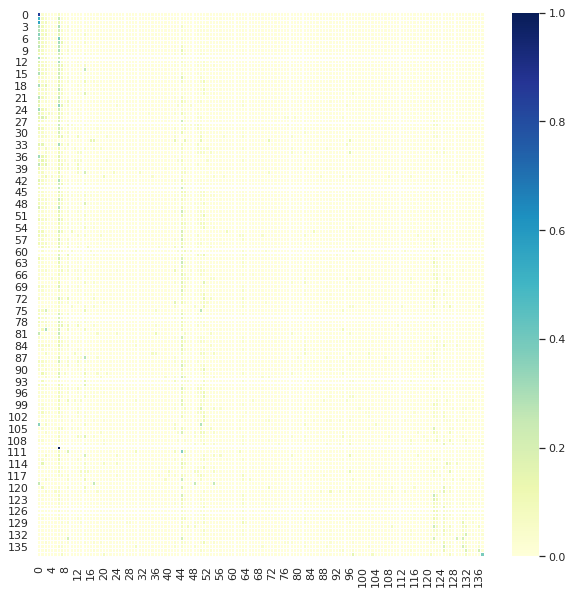

Nonzero percentage:  31.18 %


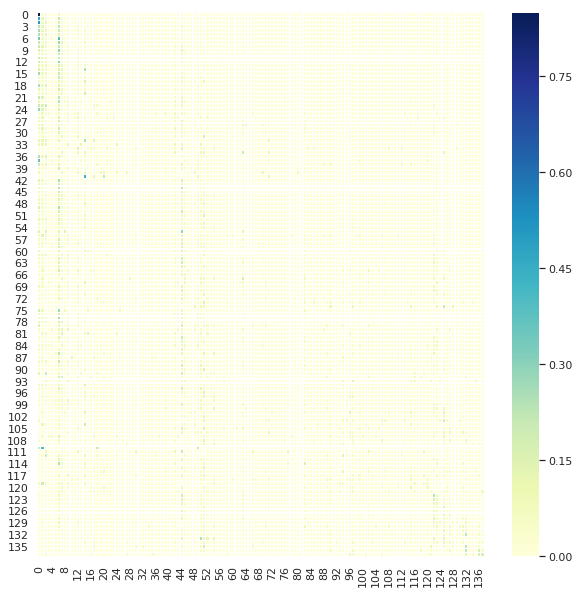

Nonzero percentage:  29.57 %


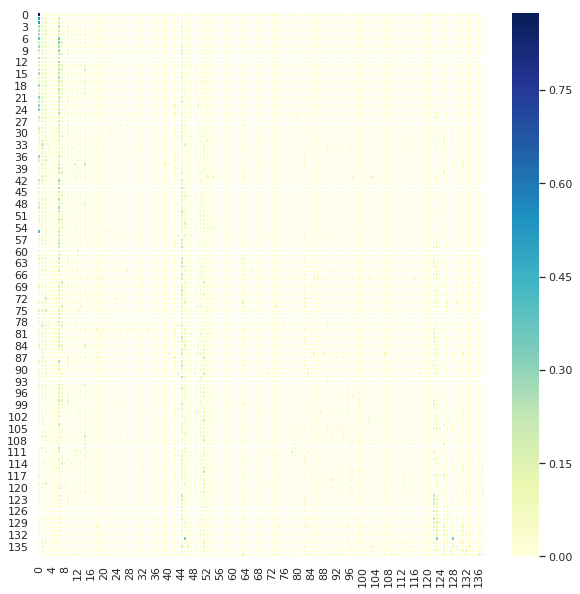

In [17]:
for transition_matrix in result['transition_matrices']:
    sns.set(rc={'figure.figsize': (10, 10)})
    print('Nonzero percentage: ', round(100 * len(np.where(transition_matrix > 0)[0]) / (unique_triad_num * unique_triad_num), 2), '%')
    sns.heatmap(transition_matrix, cmap="YlGnBu", linewidths=.1)
    plt.show()

In [18]:
# for transition_matrix in result['transition_matrices']:
#     sns.set(rc={'figure.figsize': (8, 8)})
#     plt.plot(np.sum(transition_matrix, axis=0))

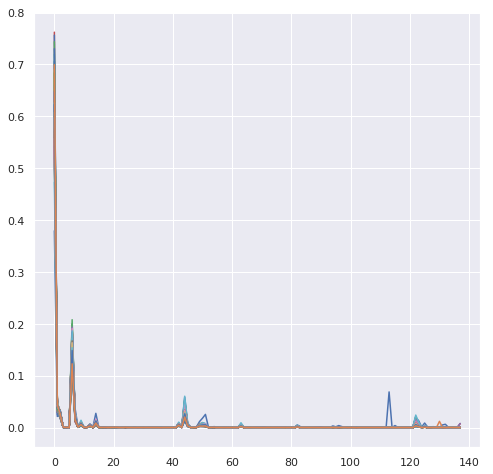

In [19]:
sns.set(rc={'figure.figsize': (8, 8)})
for transition_matrix in result['transition_matrices']:
    st_dist = network_utils.get_stationary_distribution(transition_matrix)
    plt.plot(st_dist)

In [20]:
mean_transition_matrix = np.zeros(
    (unique_triad_num, unique_triad_num))
std_transition_matrix = np.zeros(
    (unique_triad_num, unique_triad_num))
for i in range(unique_triad_num):
    for j in range(unique_triad_num):
        item_ij = []
        for matrix in result['transition_matrices']:
            item_ij.append(matrix[i, j])
        mean_transition_matrix[i, j] = np.mean(item_ij)
        std_transition_matrix[i, j] = np.std(item_ij)

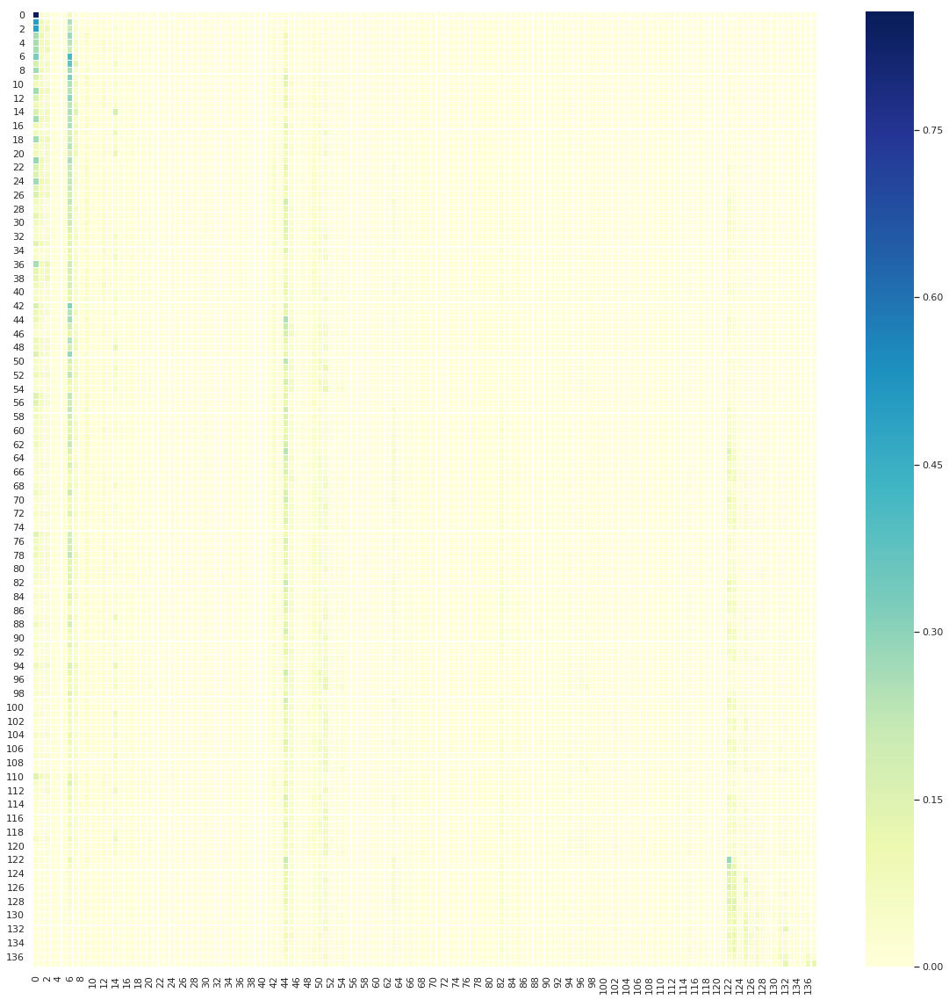

In [21]:
sns.set(rc={'figure.figsize': (20, 20)})
sns.heatmap(mean_transition_matrix, cmap="YlGnBu", linewidths=.1);

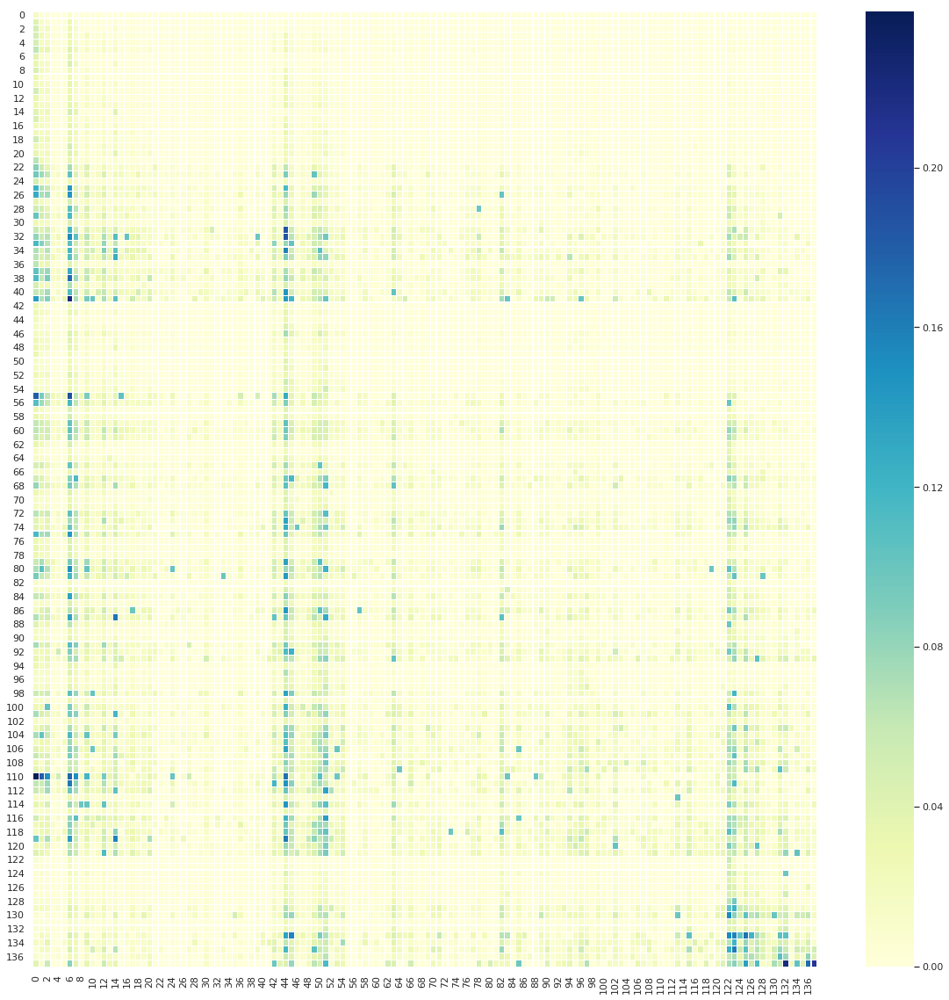

In [22]:
sns.set(rc={'figure.figsize': (20, 20)})
sns.heatmap(std_transition_matrix, cmap="YlGnBu", linewidths=.1);

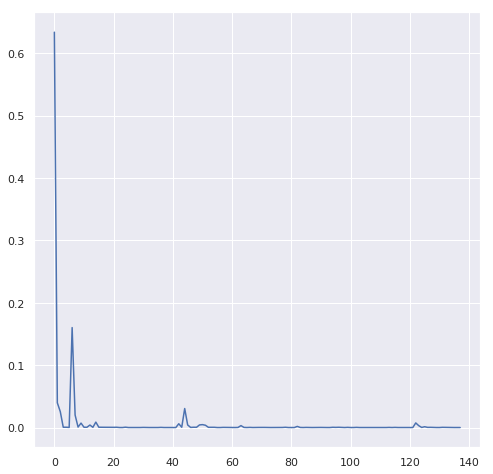

In [23]:
sns.set(rc={'figure.figsize': (8, 8)})
st_dist = network_utils.get_stationary_distribution(mean_transition_matrix)
plt.plot(st_dist)

In [24]:
for index in np.where(st_dist >= np.mean(st_dist))[0]:
    print(triad_list[index])
    print('\n')

[[0 0 0]
 [0 0 0]
 [0 0 0]]


[[0 0 0]
 [0 0 0]
 [0 1 0]]


[[ 0  0  0]
 [ 0  0  0]
 [ 0 -1  0]]


[[0 0 0]
 [0 0 1]
 [0 1 0]]


[[ 0  0  0]
 [ 0  0  1]
 [ 0 -1  0]]


[[ 0  0  0]
 [ 0  0 -1]
 [ 0 -1  0]]


[[0 0 1]
 [0 0 1]
 [1 1 0]]


[[0 1 1]
 [1 0 1]
 [1 1 0]]




## Accumulated graphs 

In [ ]:
start_time = time.time()

acc_result = network_utils.compute_transition_matrix(
    dgraphs=accumulative_dgraphs,
    unique_triad_num=unique_triad_num,
    triad_map=triad_map,
    verbose=True)

duration = time.time() - start_time
print('It took :', duration/60, 'mins.')

In [ ]:
# Saves the accumulative transitions.
with open('/local/home/student/omid55/sbt_data_saved/acc_transitions_avg.pkl', 'wb') as f:
    pk.dump(acc_result, f)

Nonzero percentage:  6.66 %


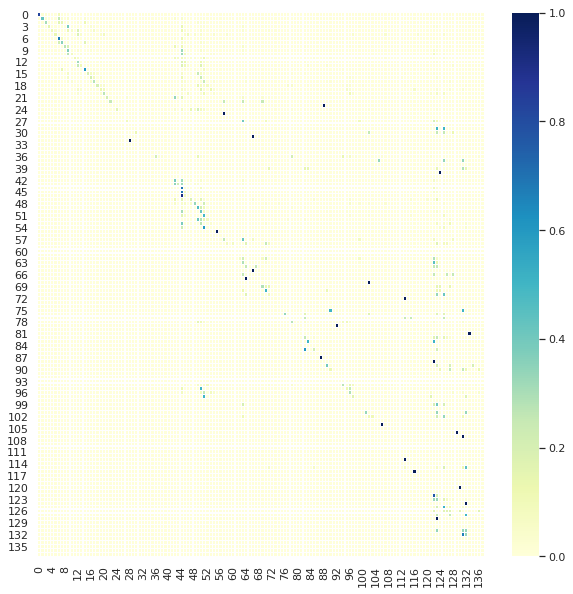

Nonzero percentage:  11.0 %


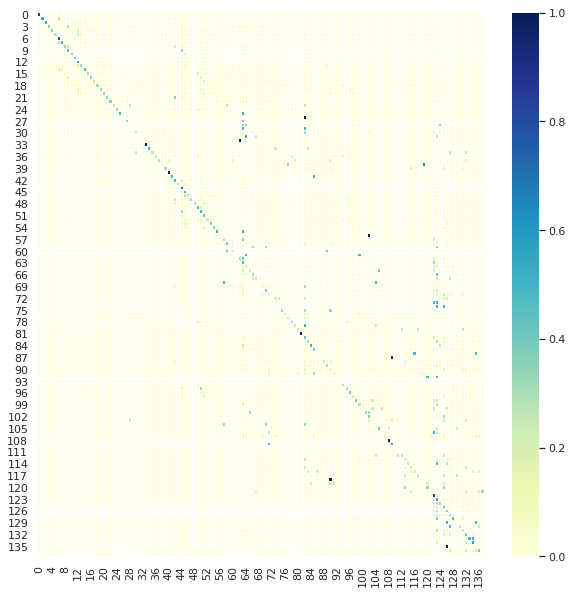

Nonzero percentage:  12.07 %


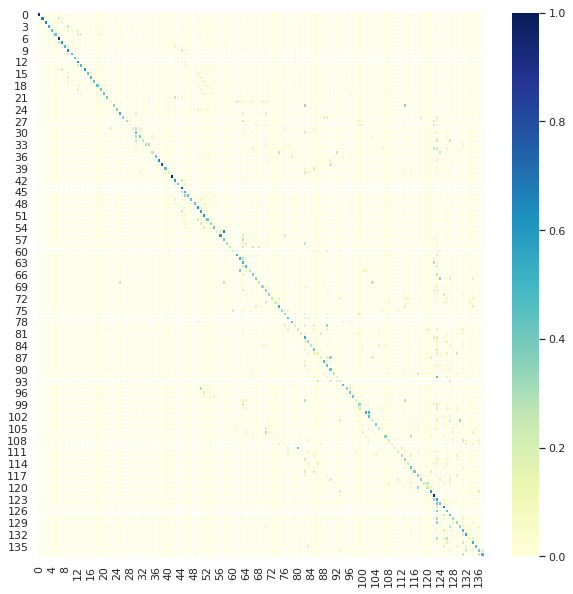

Nonzero percentage:  8.98 %


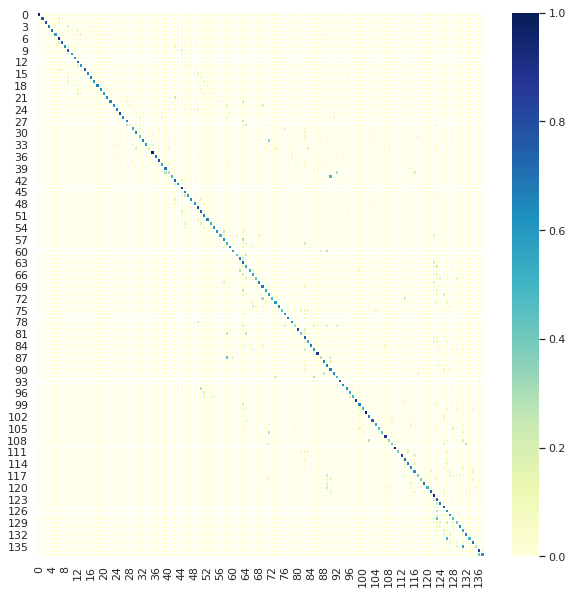

Nonzero percentage:  9.24 %


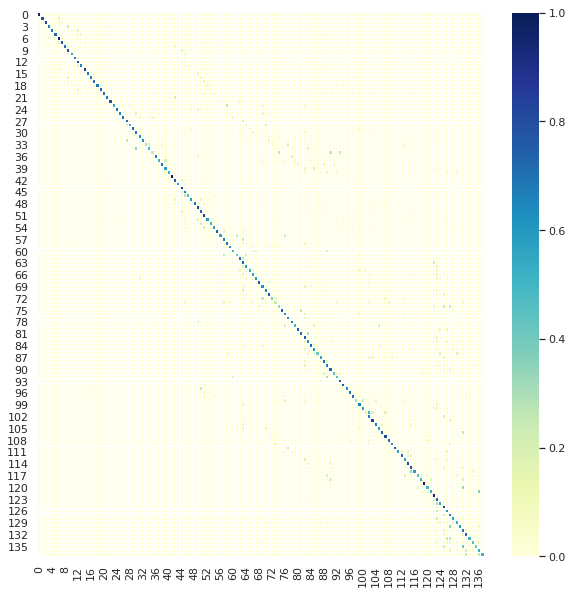

Nonzero percentage:  8.01 %


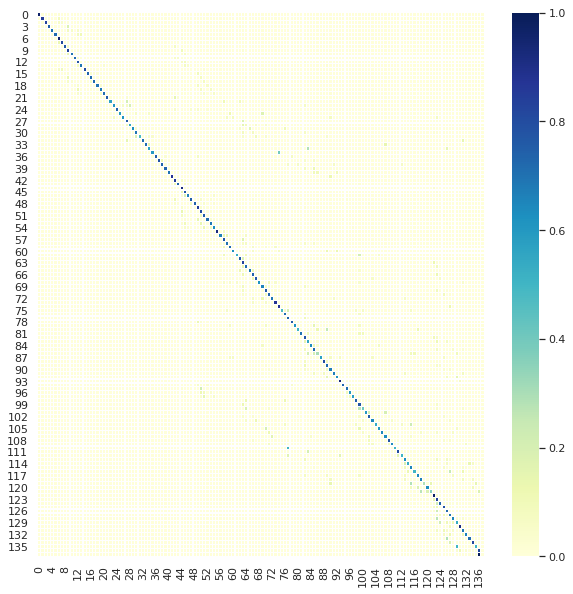

Nonzero percentage:  9.41 %


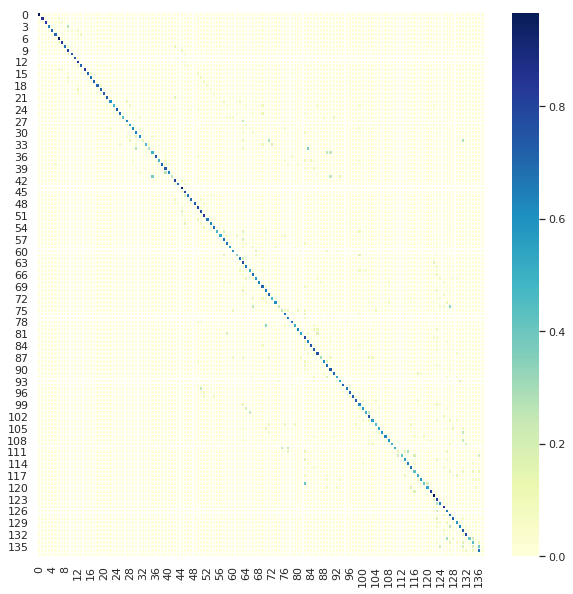

Nonzero percentage:  7.3 %


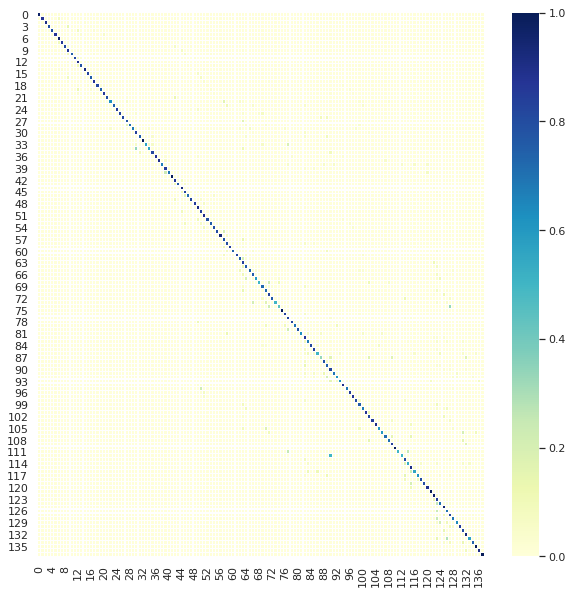

Nonzero percentage:  8.99 %


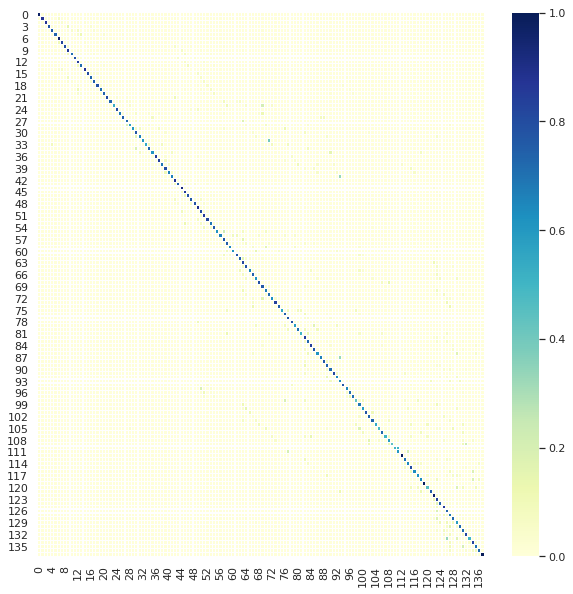

Nonzero percentage:  7.6 %


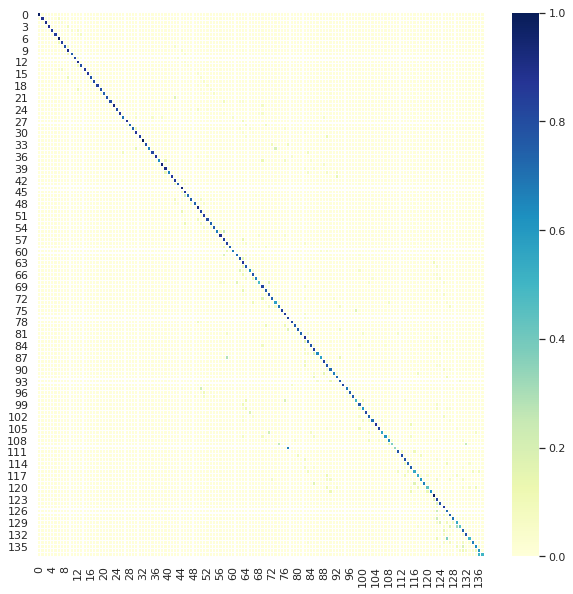

Nonzero percentage:  7.82 %


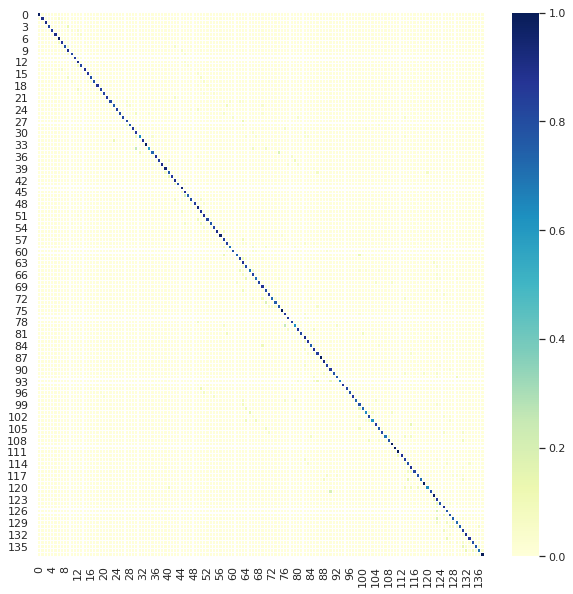

Nonzero percentage:  7.49 %


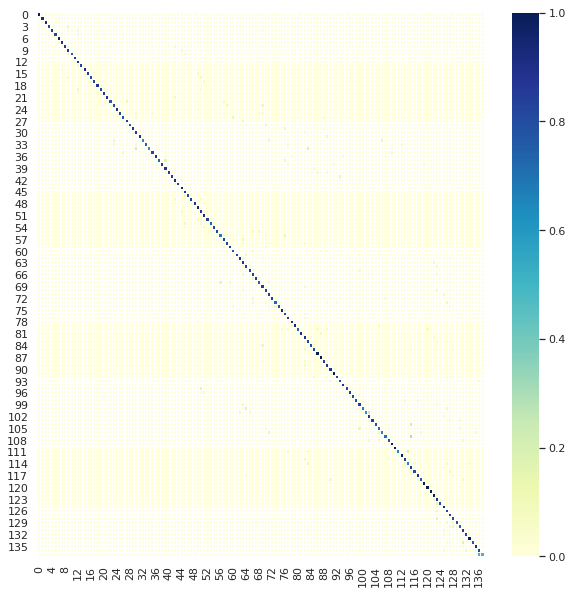

Nonzero percentage:  7.37 %


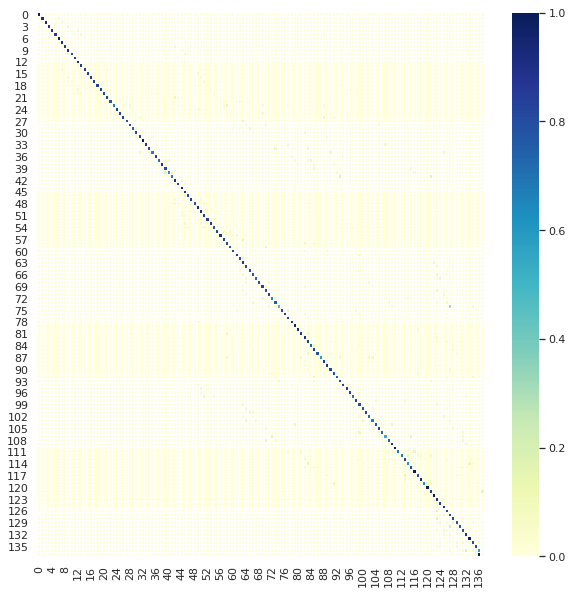

Nonzero percentage:  7.75 %


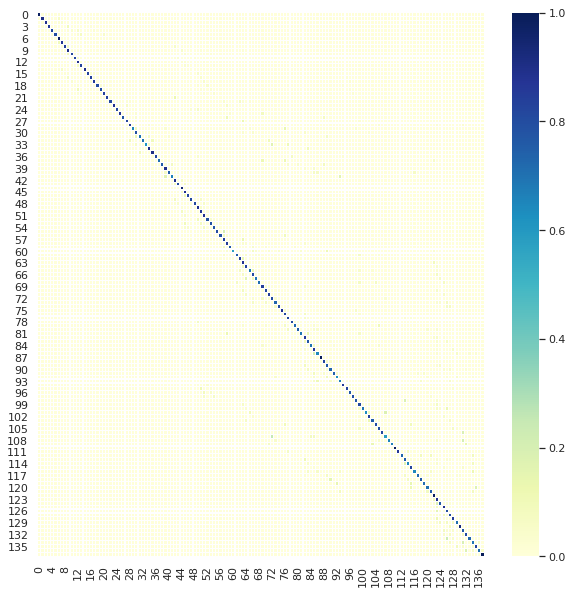

Nonzero percentage:  7.89 %


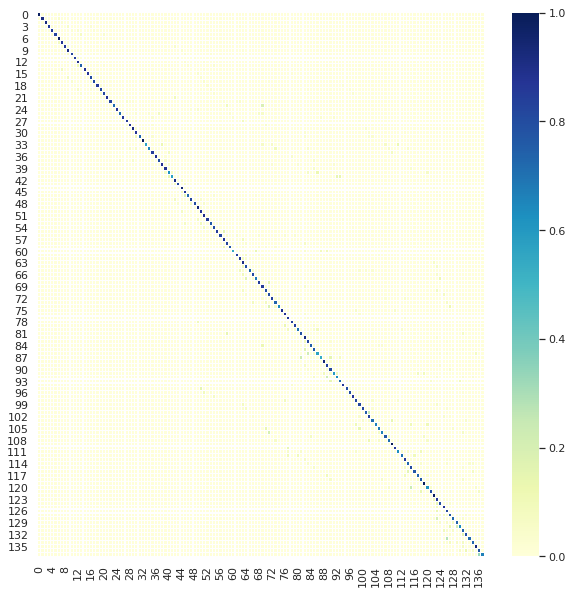

Nonzero percentage:  9.51 %


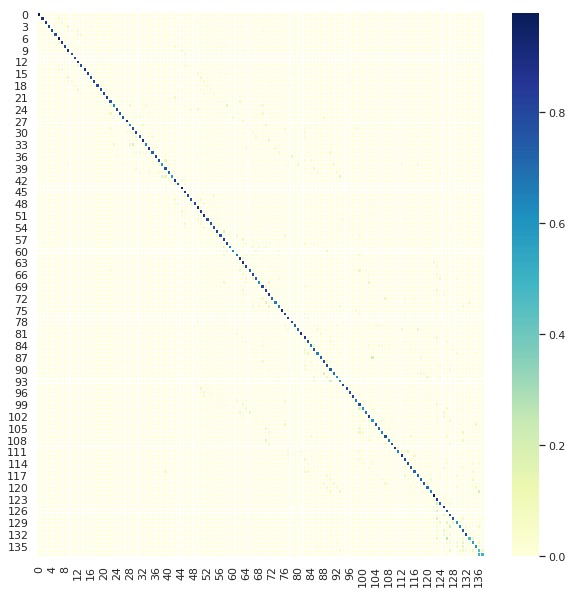

Nonzero percentage:  8.01 %


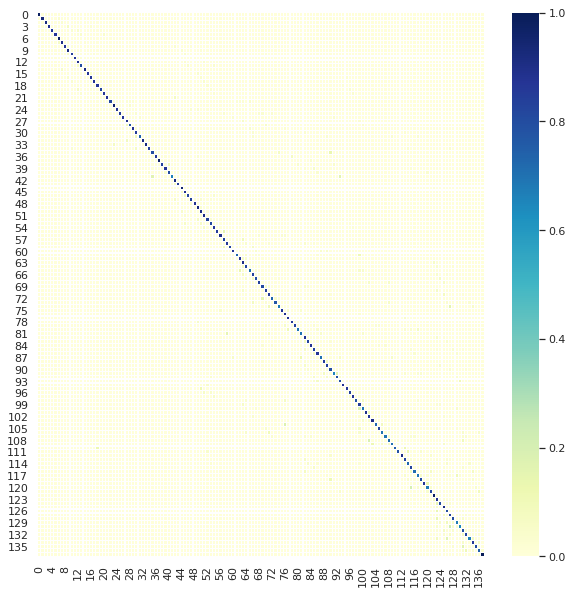

Nonzero percentage:  9.93 %


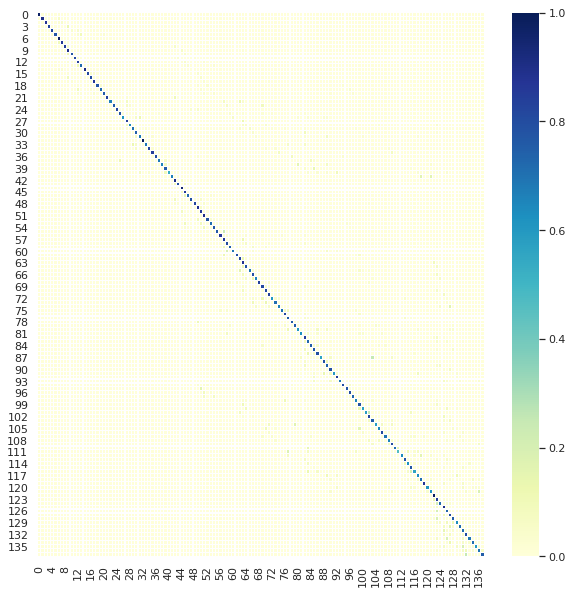

Nonzero percentage:  7.89 %


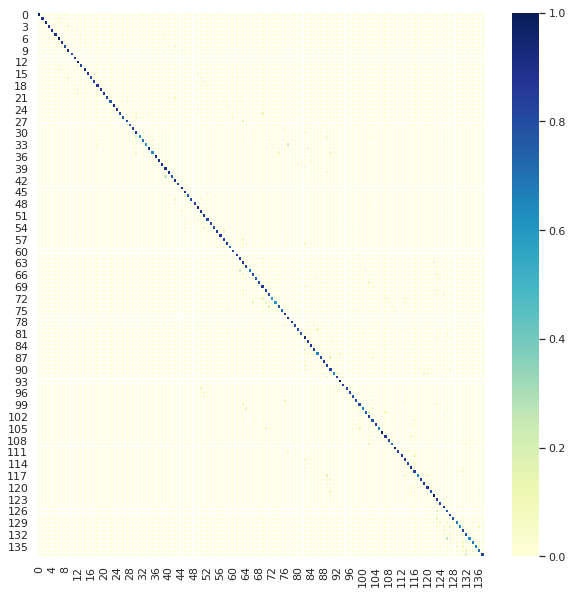

Nonzero percentage:  7.9 %


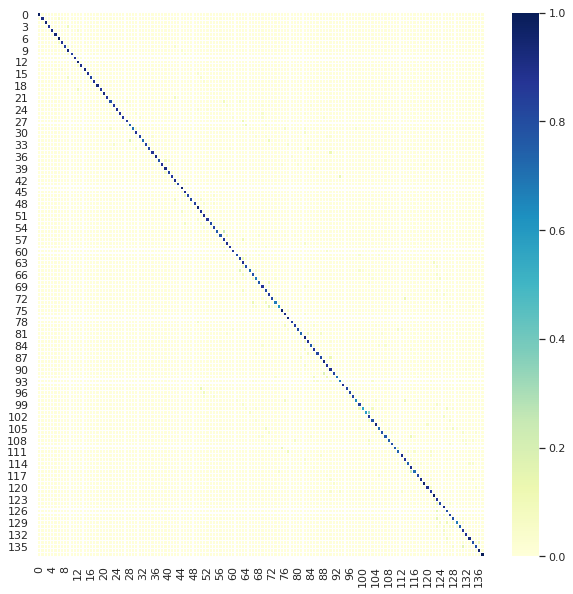

Nonzero percentage:  7.49 %


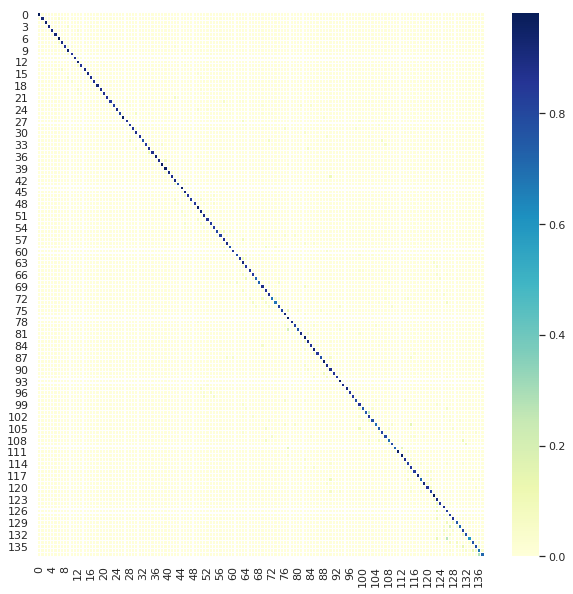

Nonzero percentage:  7.54 %


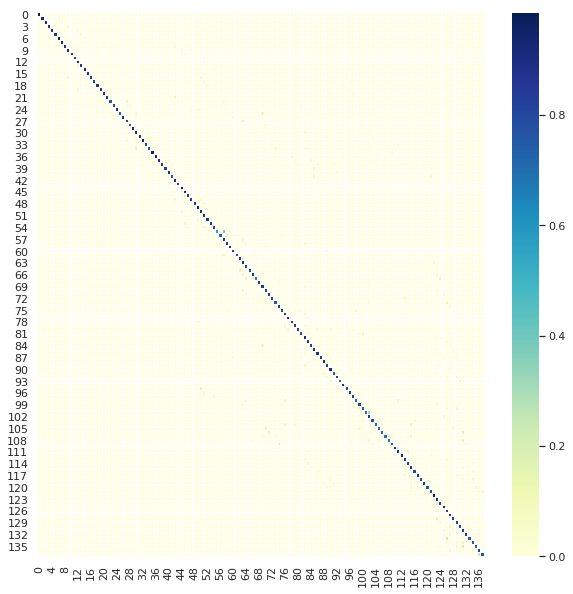

Nonzero percentage:  7.73 %


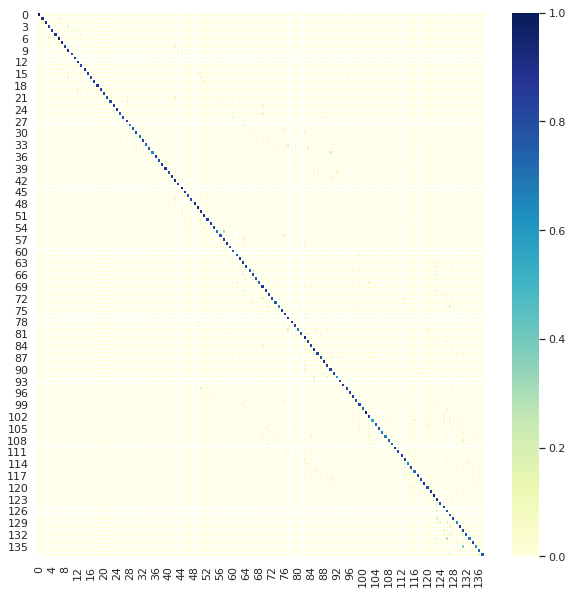

Nonzero percentage:  8.21 %


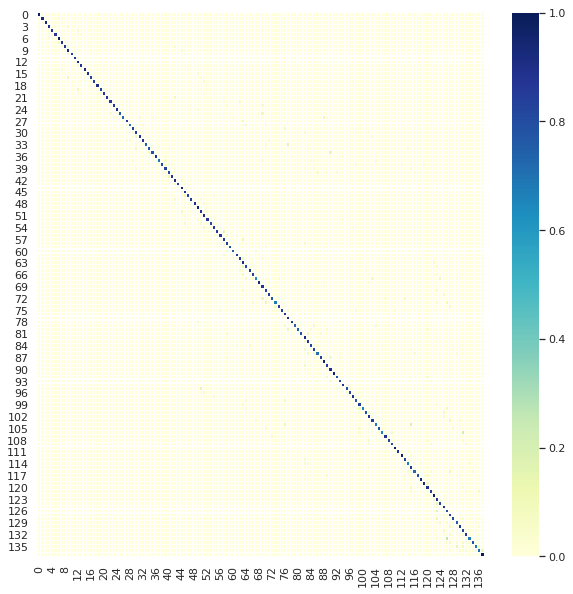

Nonzero percentage:  8.27 %


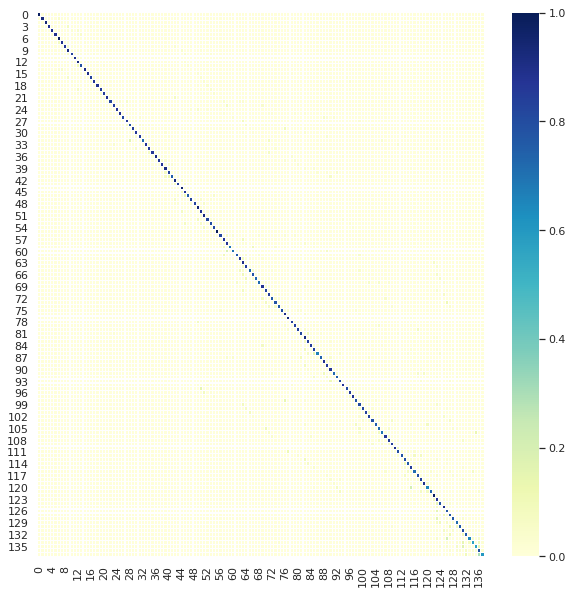

Nonzero percentage:  7.91 %


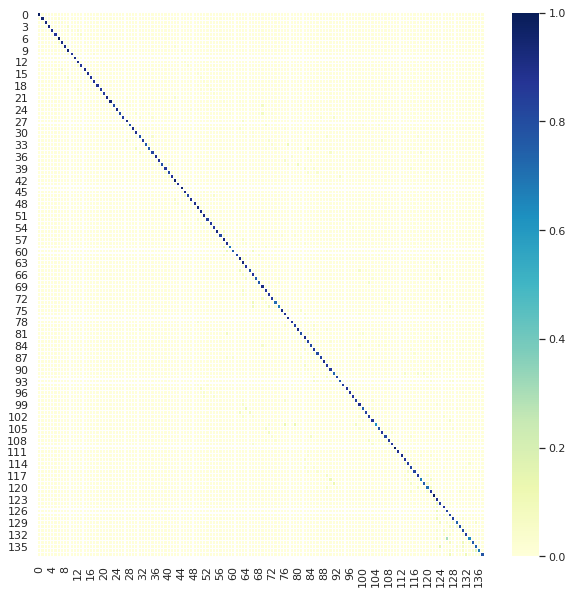

Nonzero percentage:  7.51 %


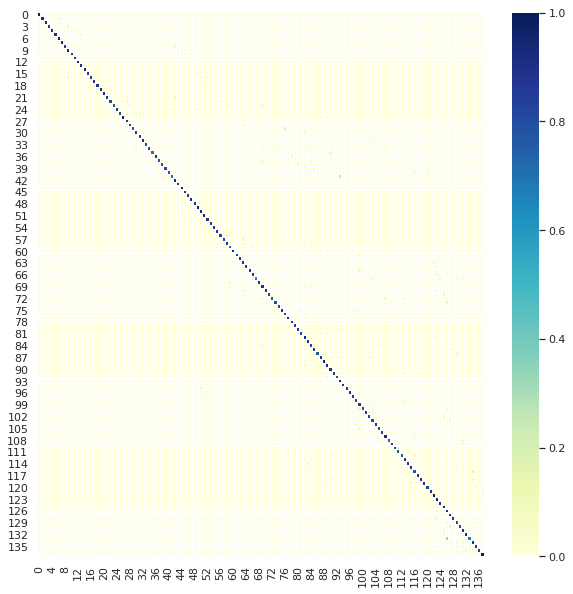

Nonzero percentage:  7.37 %


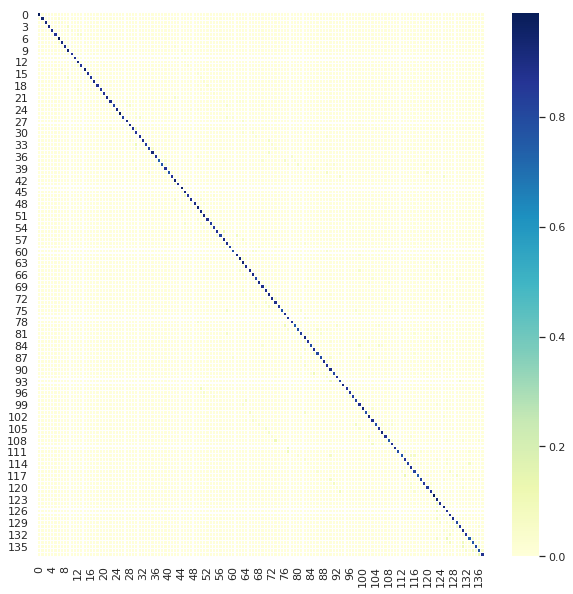

Nonzero percentage:  8.57 %


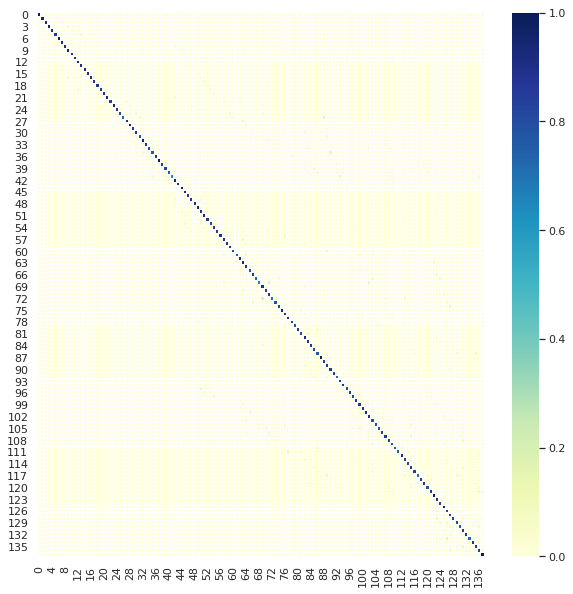

Nonzero percentage:  7.18 %


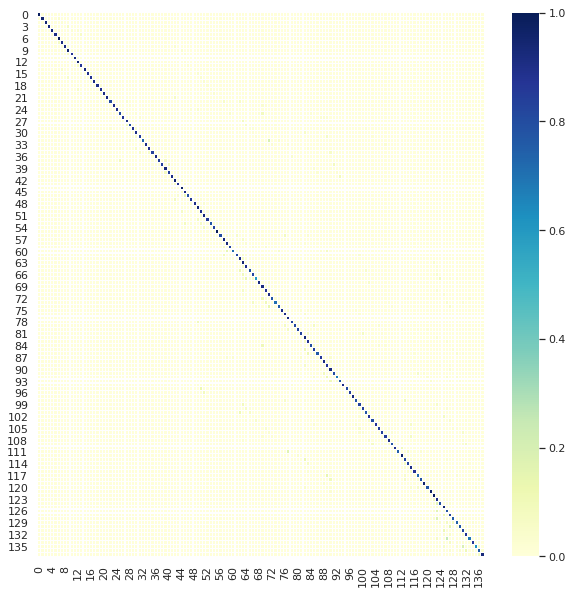

Nonzero percentage:  7.44 %


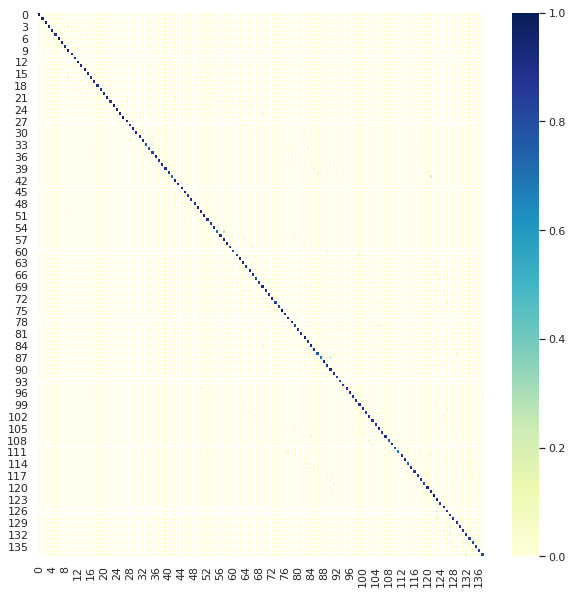

Nonzero percentage:  7.15 %


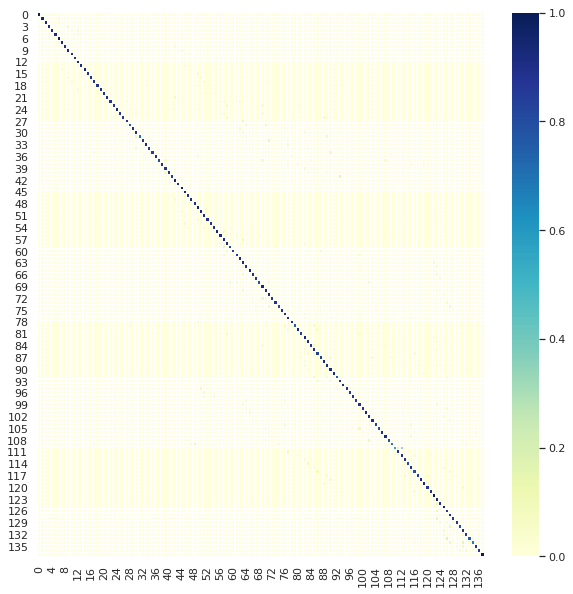

Nonzero percentage:  8.06 %


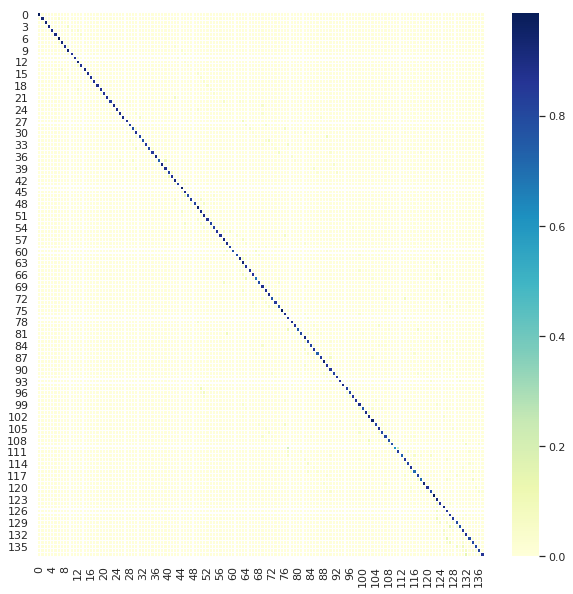

Nonzero percentage:  6.94 %


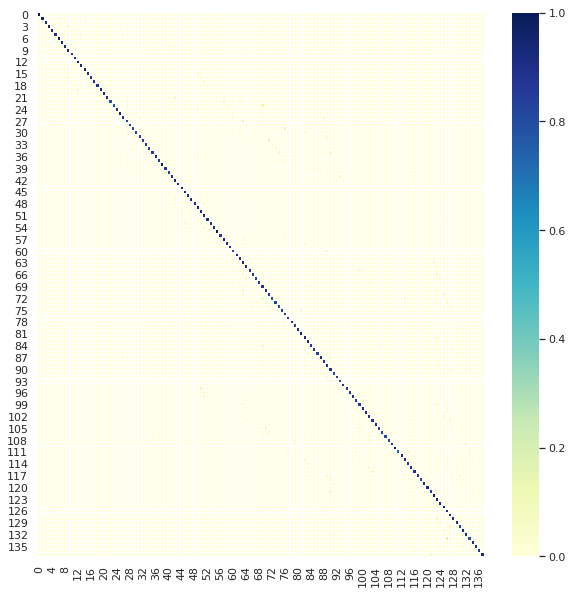

Nonzero percentage:  8.27 %


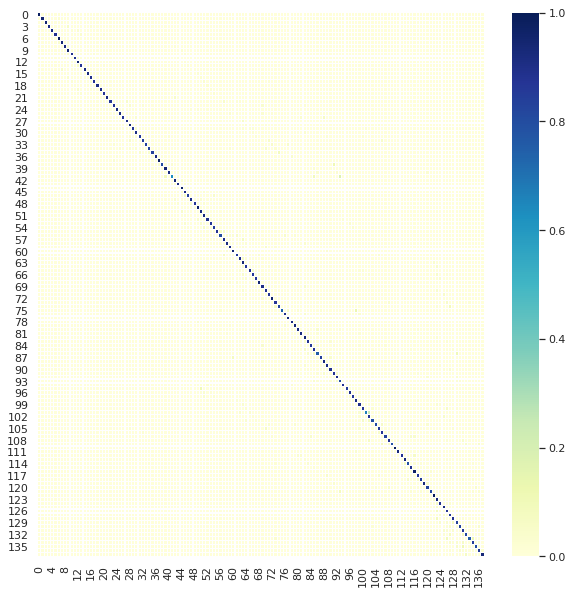

Nonzero percentage:  6.99 %


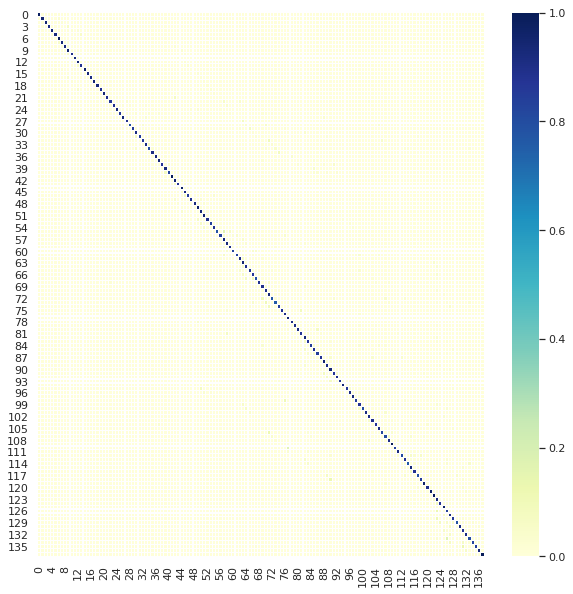

Nonzero percentage:  7.78 %


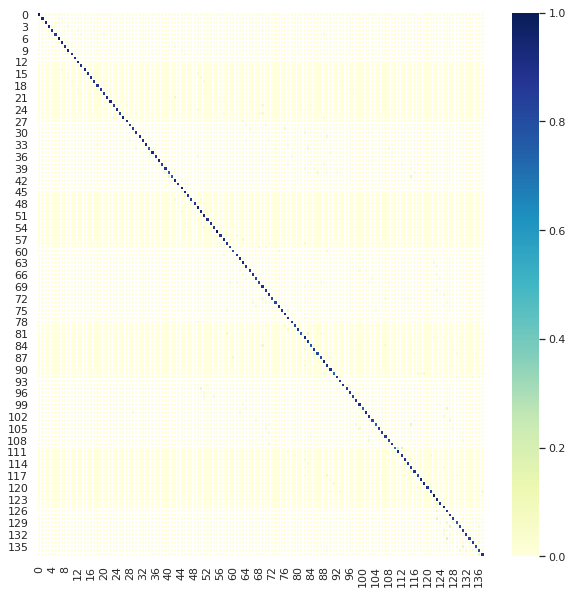

Nonzero percentage:  7.28 %


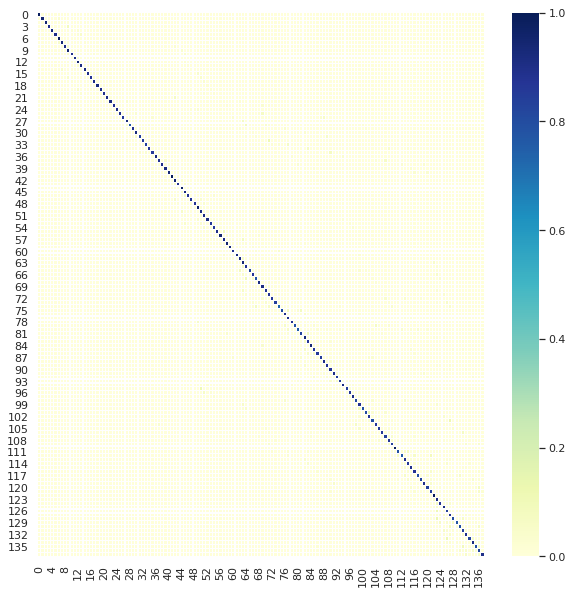

Nonzero percentage:  7.29 %


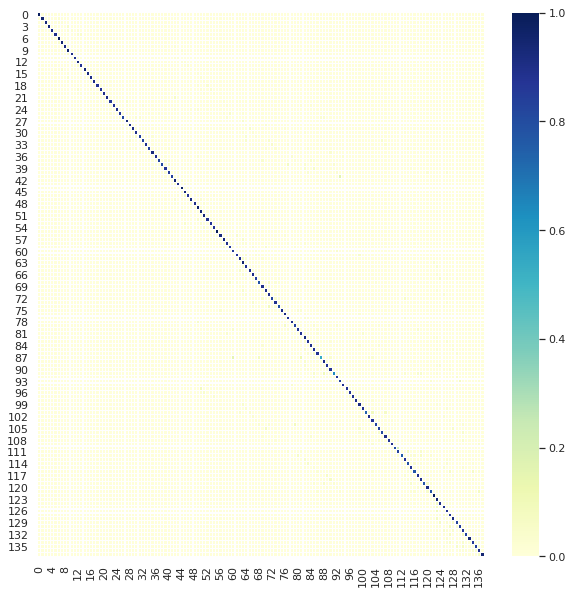

Nonzero percentage:  8.23 %


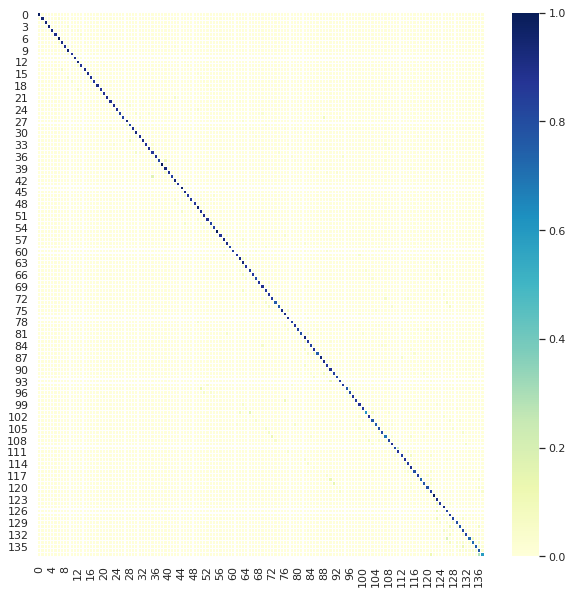

Nonzero percentage:  7.83 %


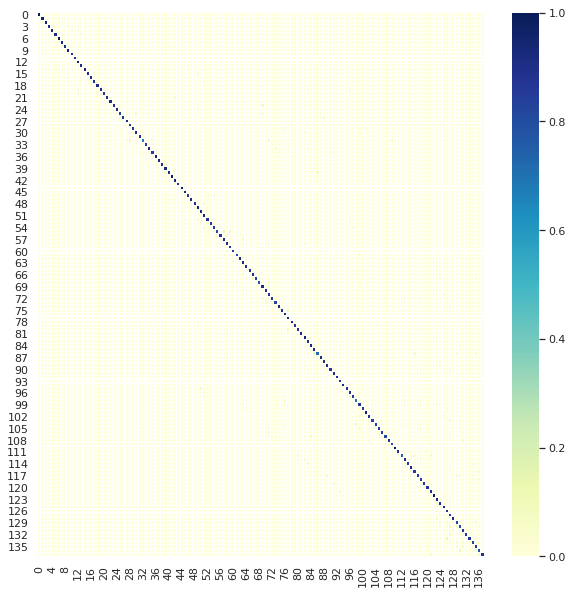

Nonzero percentage:  6.86 %


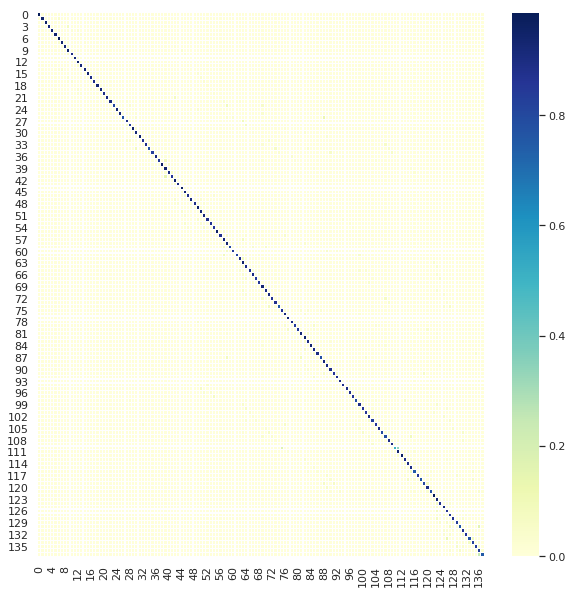

Nonzero percentage:  7.02 %


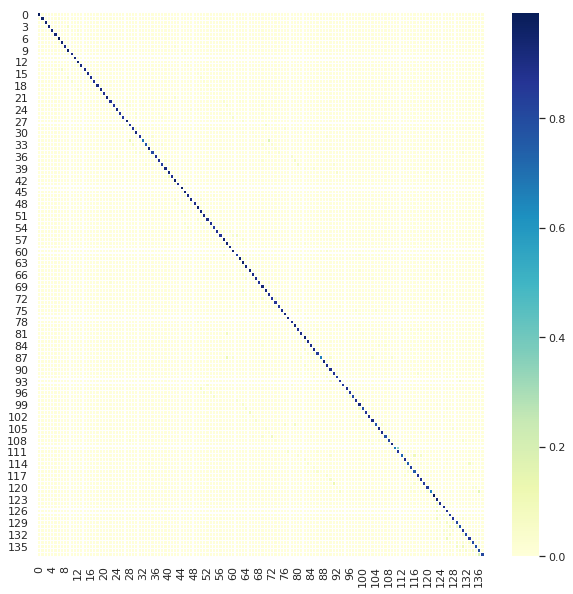

Nonzero percentage:  6.73 %


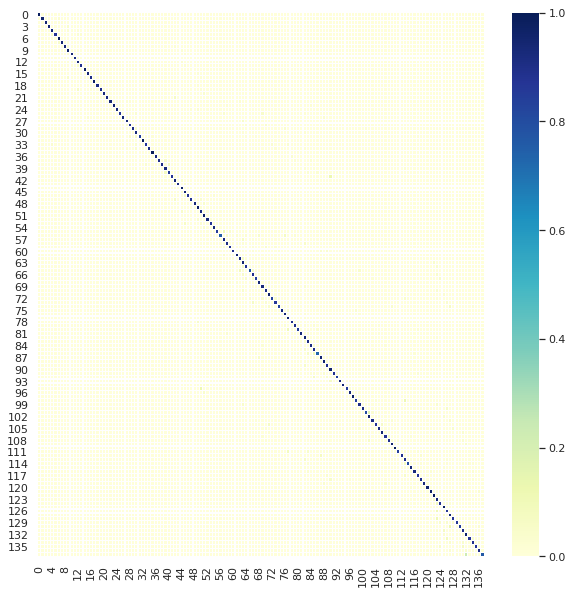

Nonzero percentage:  6.53 %


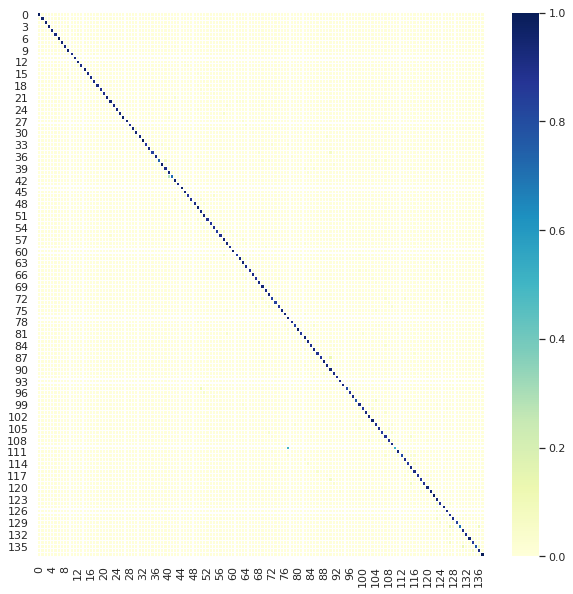

Nonzero percentage:  7.63 %


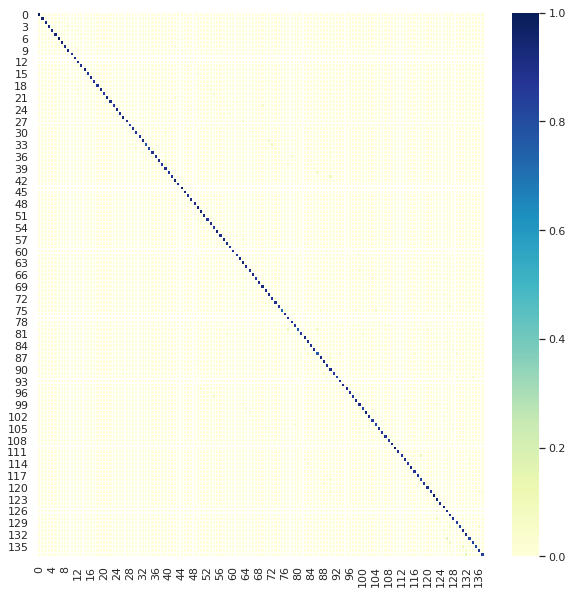

Nonzero percentage:  6.71 %


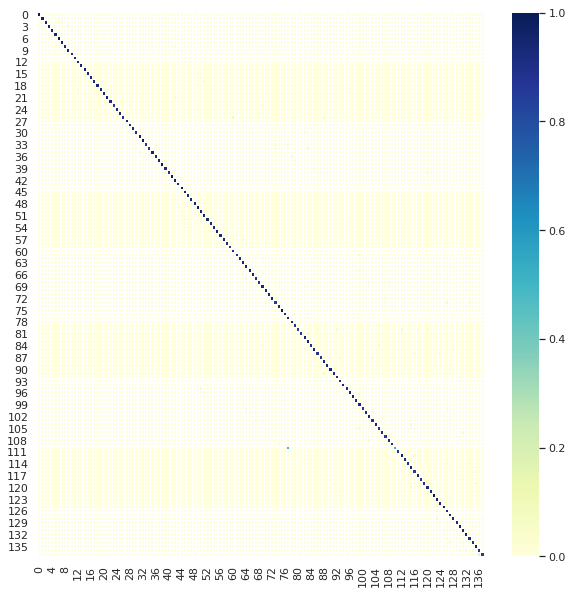

Nonzero percentage:  7.21 %


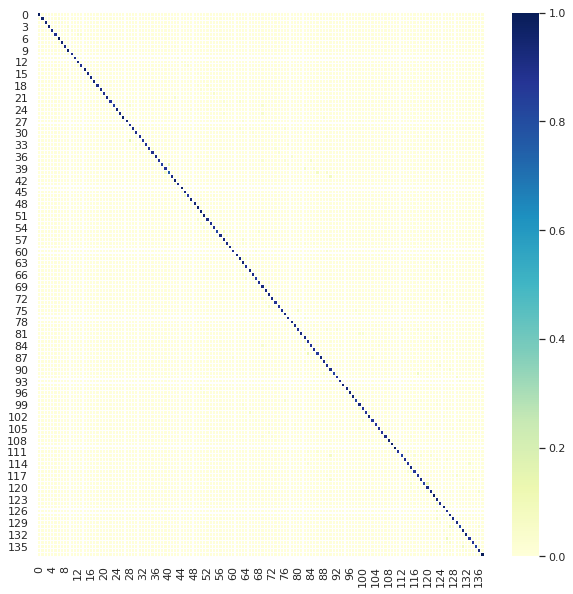

Nonzero percentage:  7.12 %


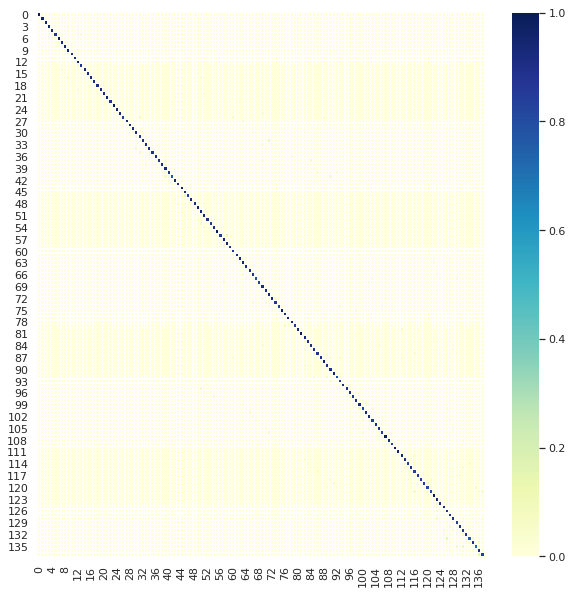

Nonzero percentage:  7.44 %


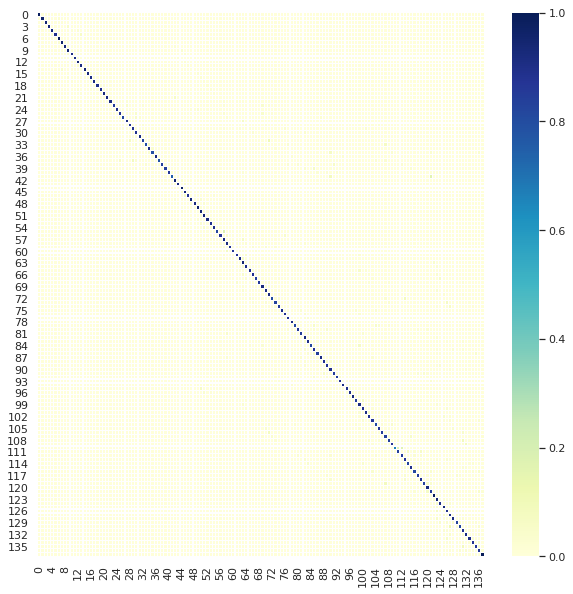

Nonzero percentage:  5.68 %


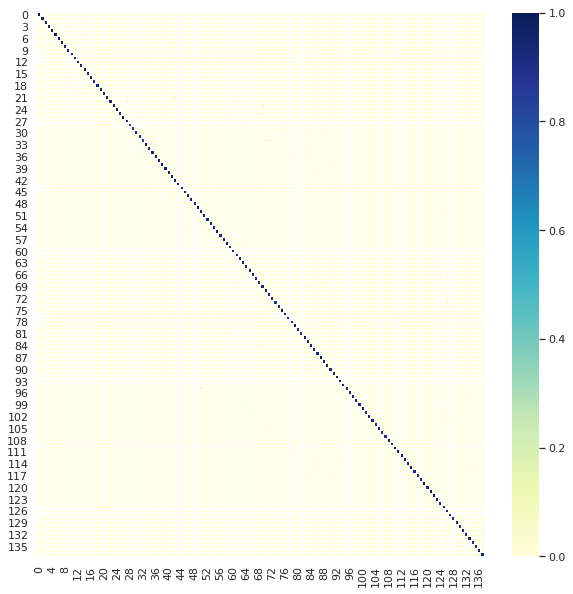

Nonzero percentage:  5.85 %


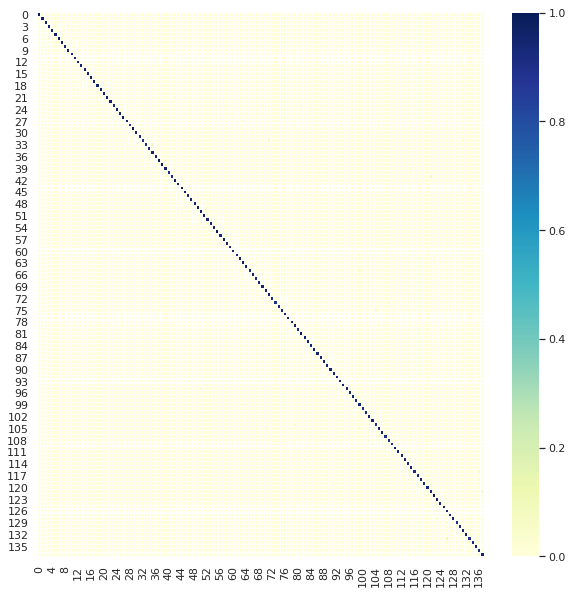

Nonzero percentage:  6.34 %


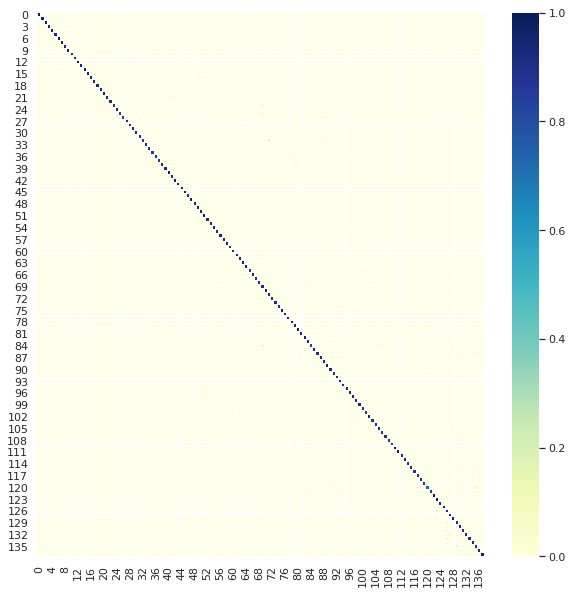

Nonzero percentage:  6.15 %


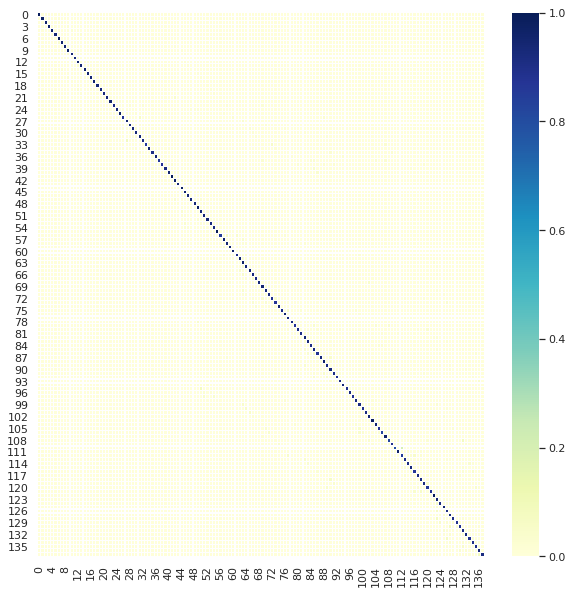

Nonzero percentage:  6.79 %


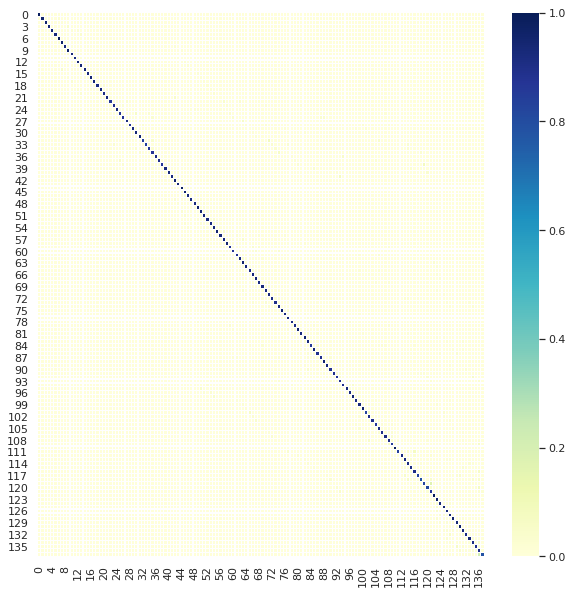

Nonzero percentage:  5.02 %


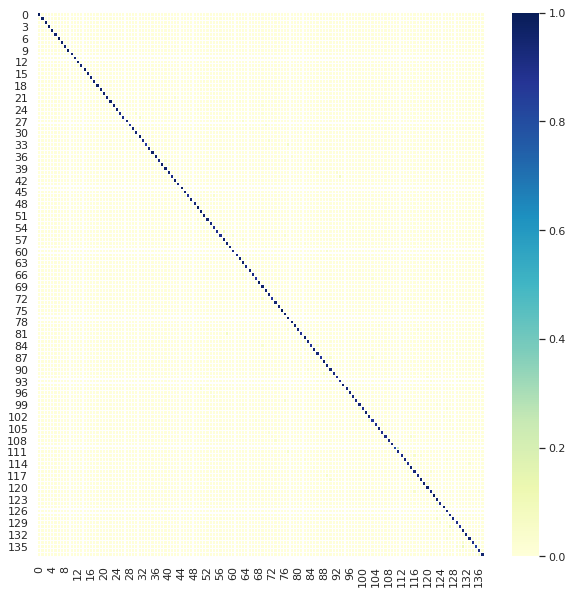

Nonzero percentage:  6.51 %


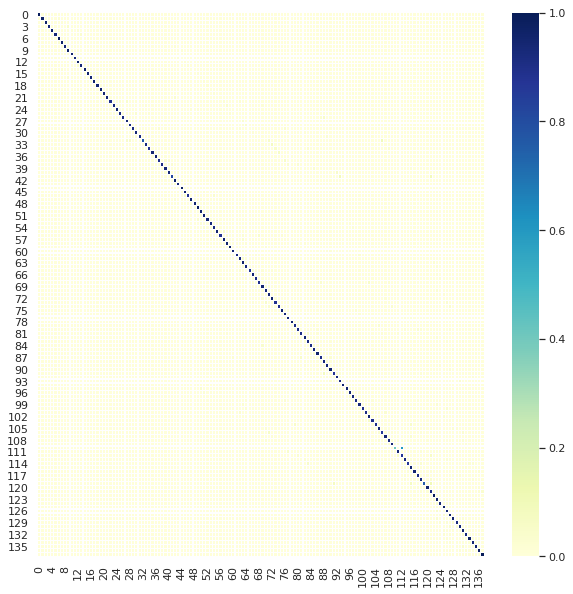

Nonzero percentage:  5.84 %


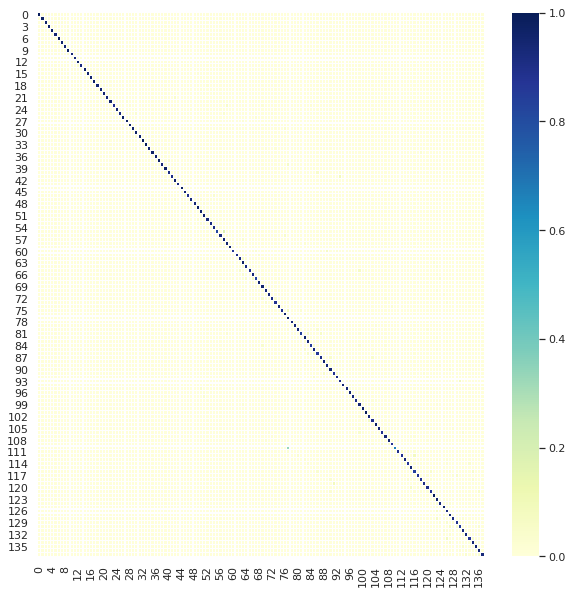

Nonzero percentage:  5.77 %


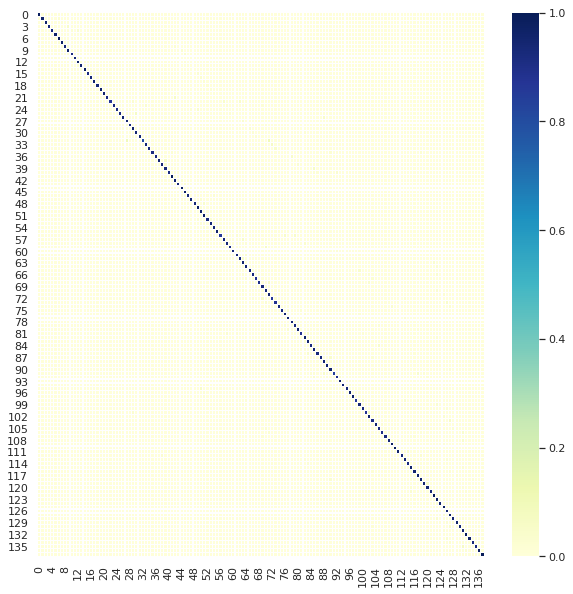

Nonzero percentage:  5.84 %


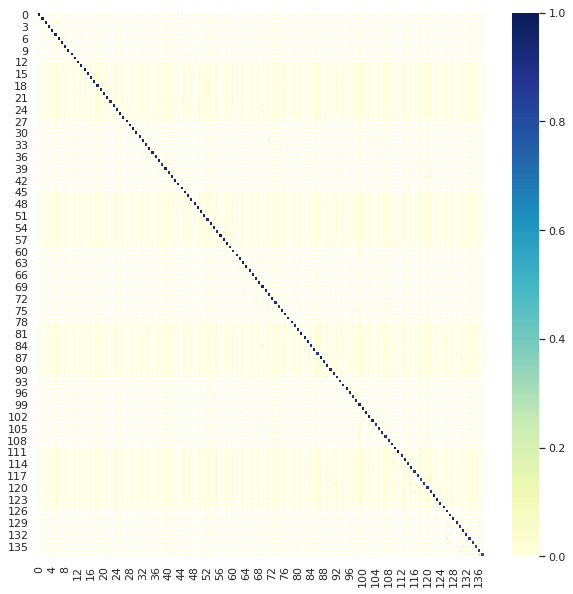

Nonzero percentage:  6.22 %


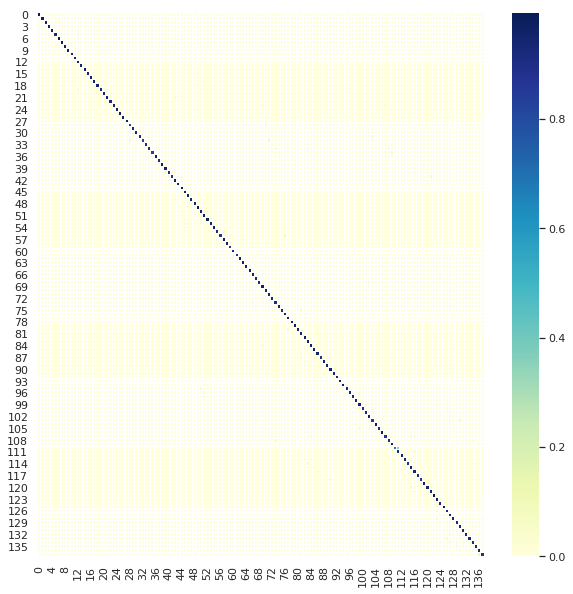

Nonzero percentage:  7.13 %


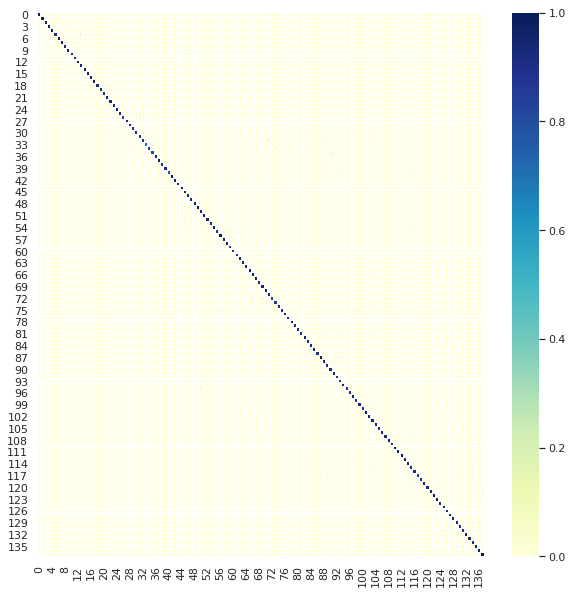

Nonzero percentage:  5.79 %


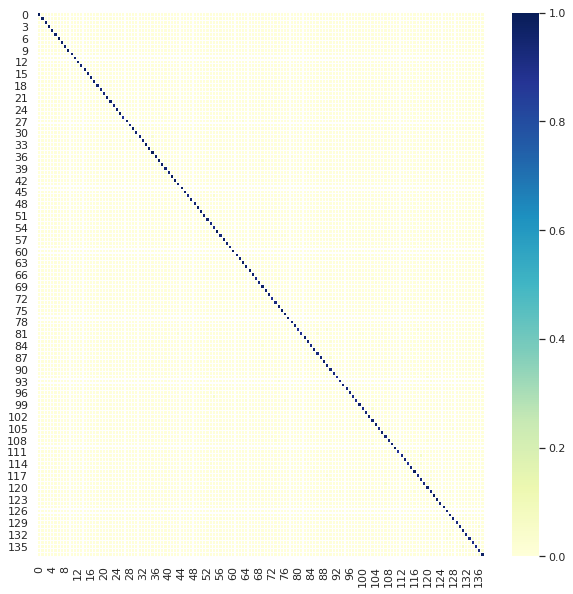

Nonzero percentage:  5.42 %


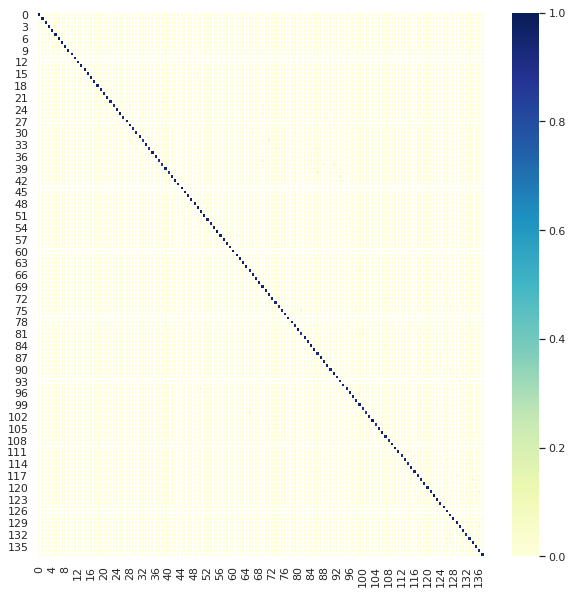

Nonzero percentage:  6.22 %


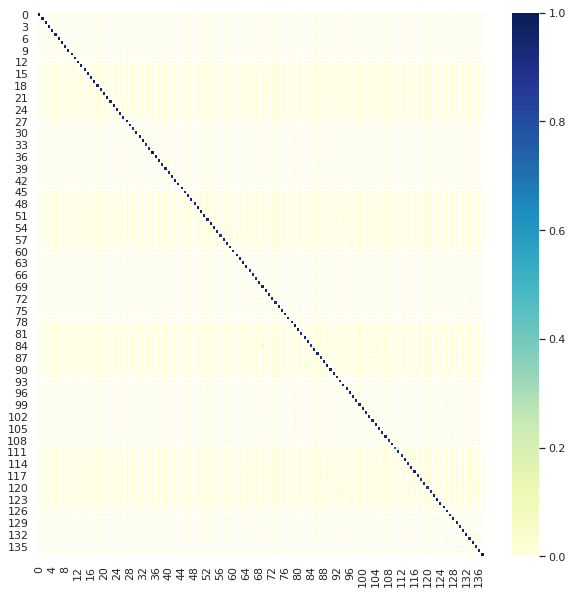

Nonzero percentage:  5.76 %


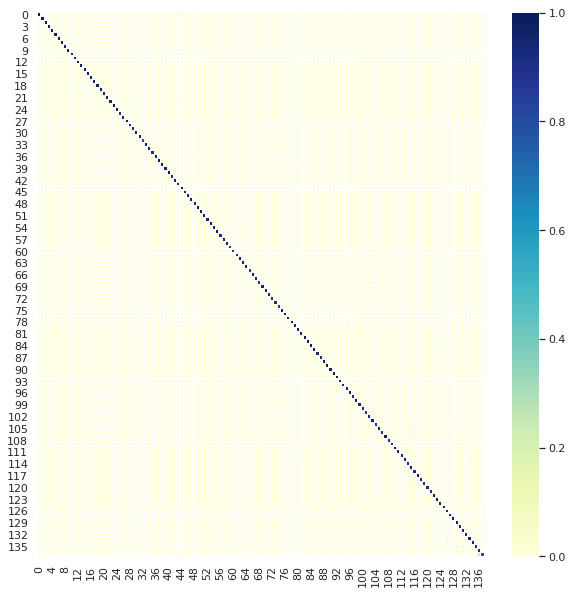

Nonzero percentage:  5.49 %


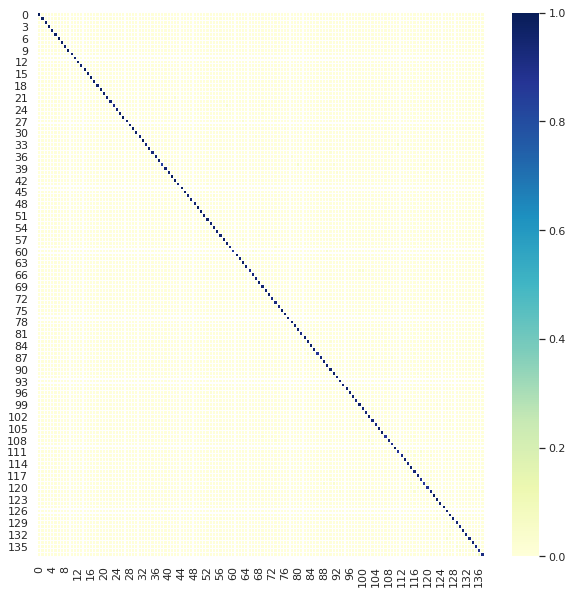

Nonzero percentage:  4.98 %


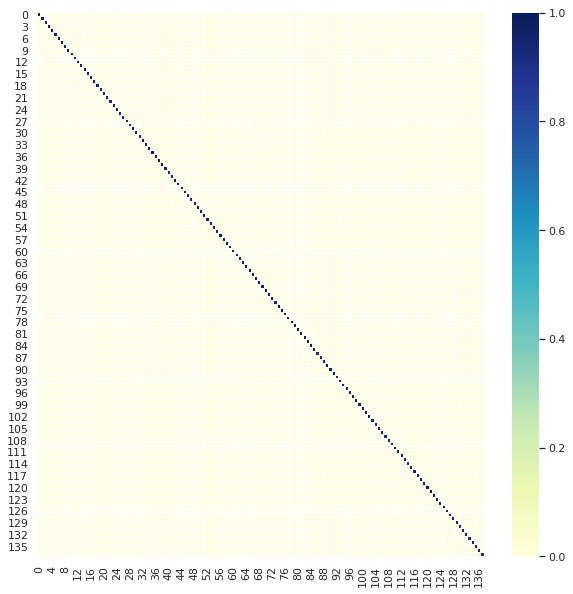

Nonzero percentage:  5.3 %


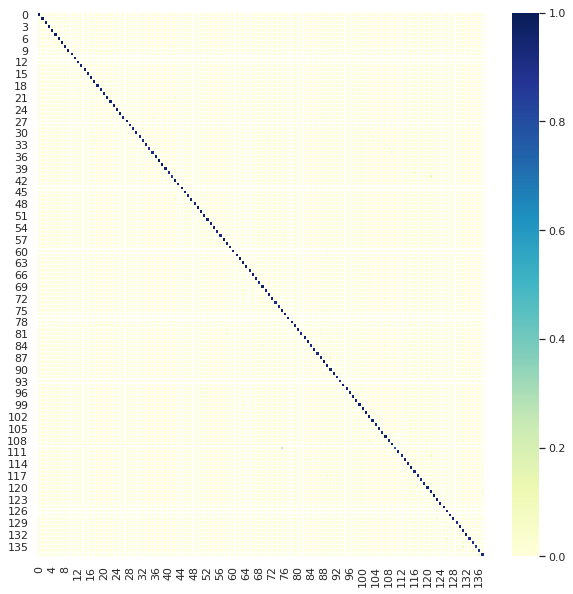

Nonzero percentage:  5.11 %


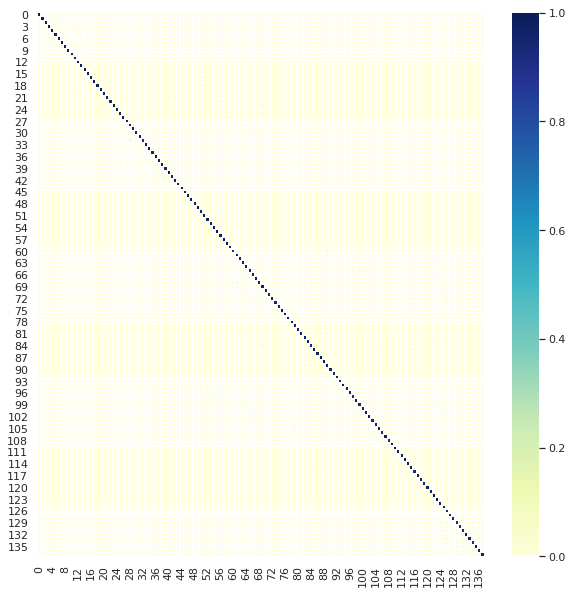

Nonzero percentage:  4.75 %


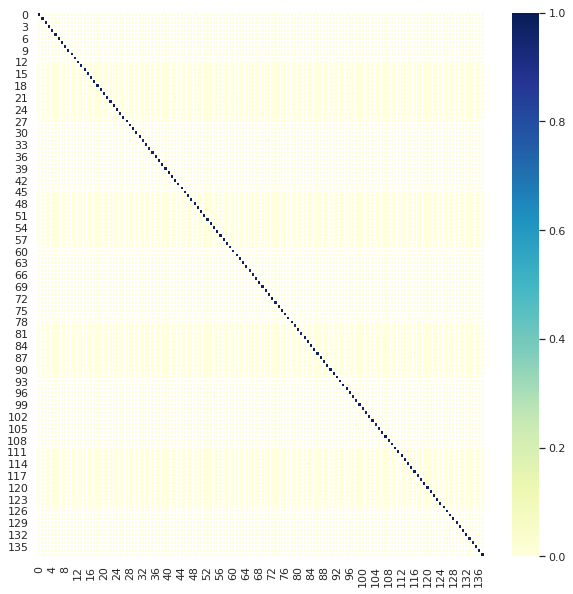

Nonzero percentage:  5.63 %


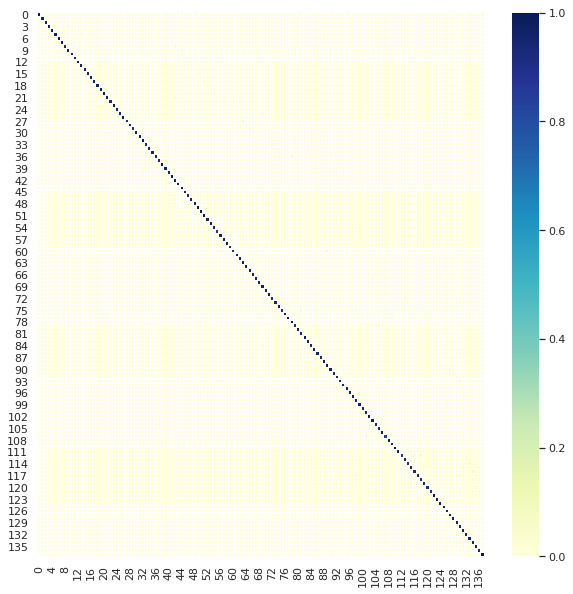

Nonzero percentage:  5.05 %


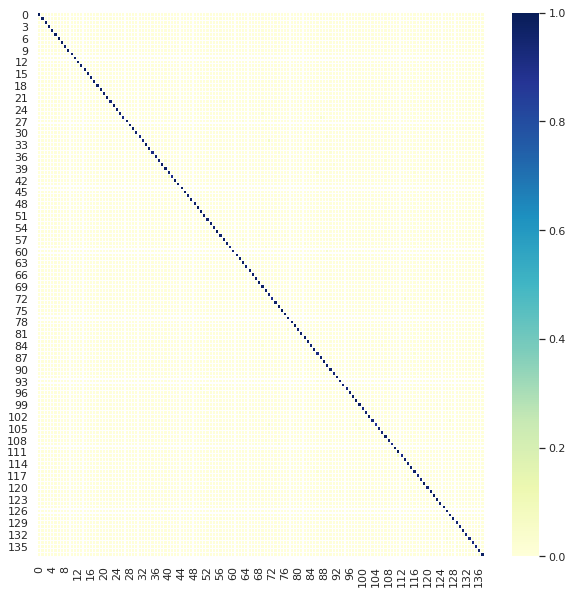

Nonzero percentage:  5.46 %


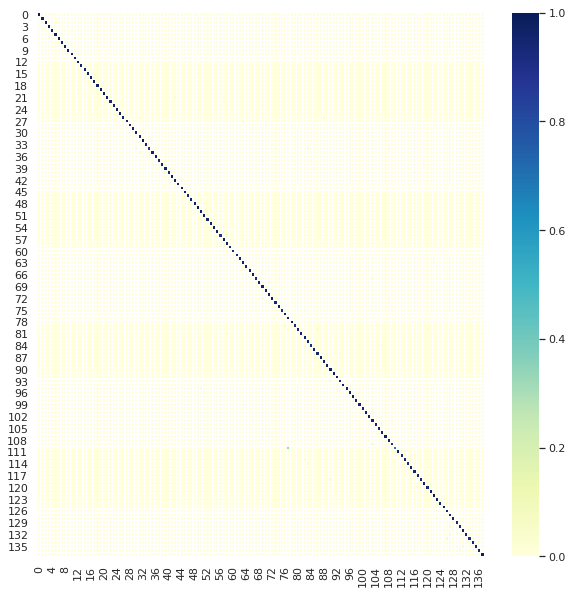

Nonzero percentage:  5.51 %


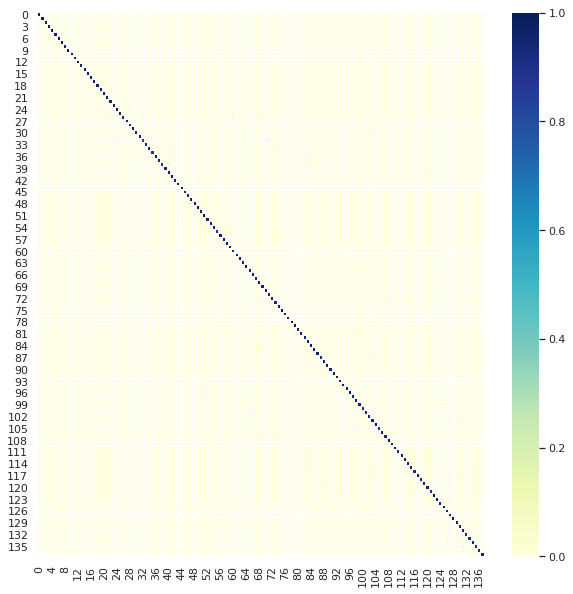

Nonzero percentage:  5.18 %


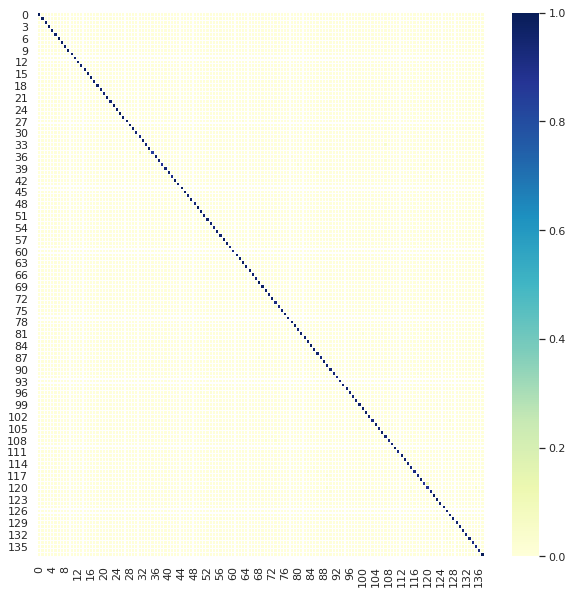

Nonzero percentage:  4.67 %


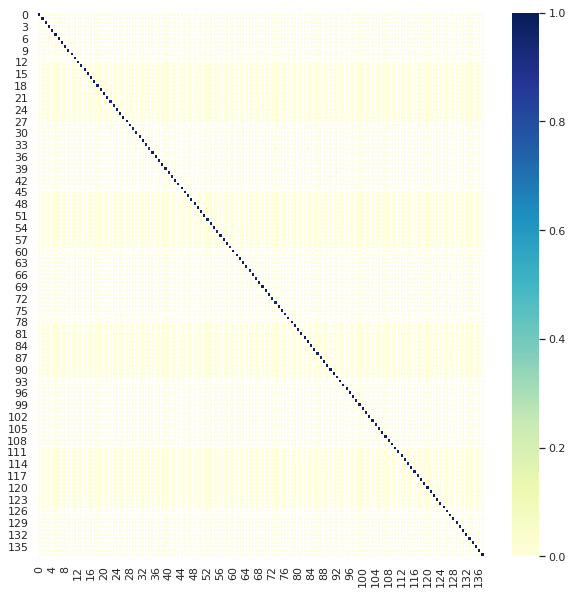

Nonzero percentage:  5.36 %


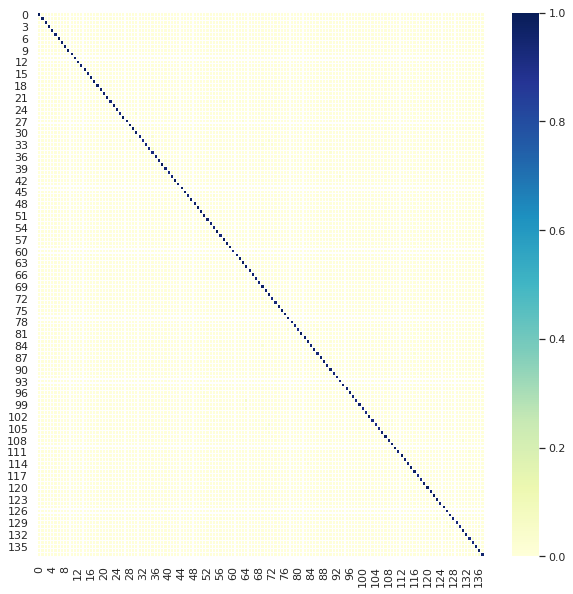

Nonzero percentage:  5.03 %


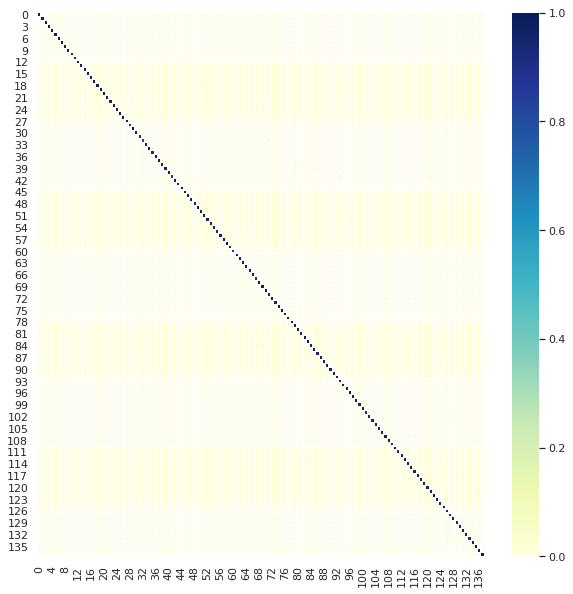

Nonzero percentage:  5.16 %


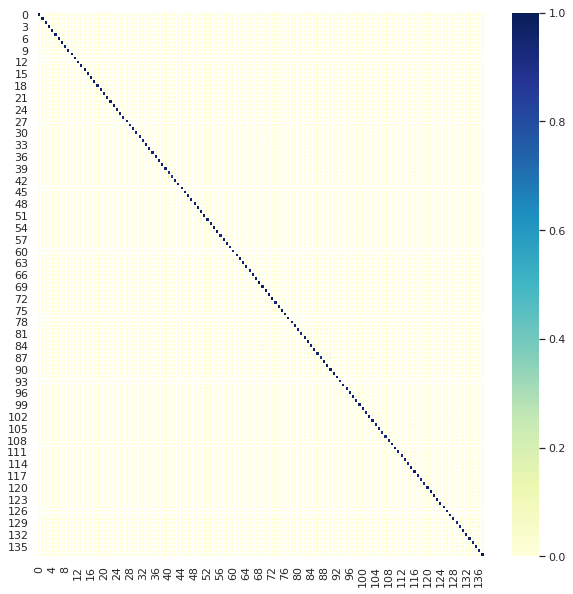

Nonzero percentage:  5.68 %


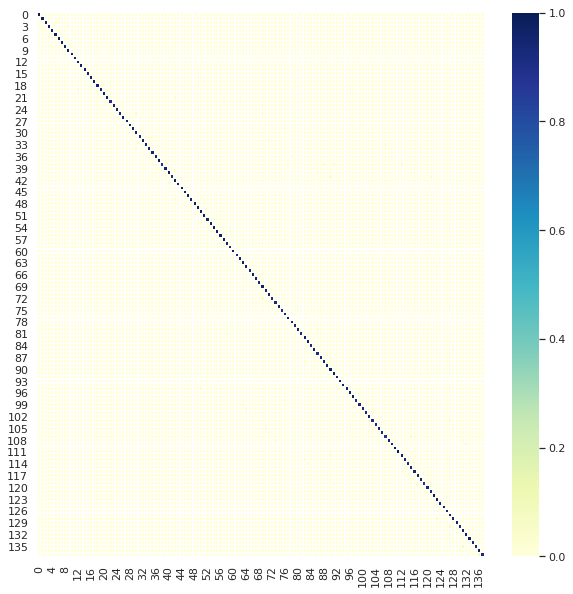

Nonzero percentage:  5.14 %


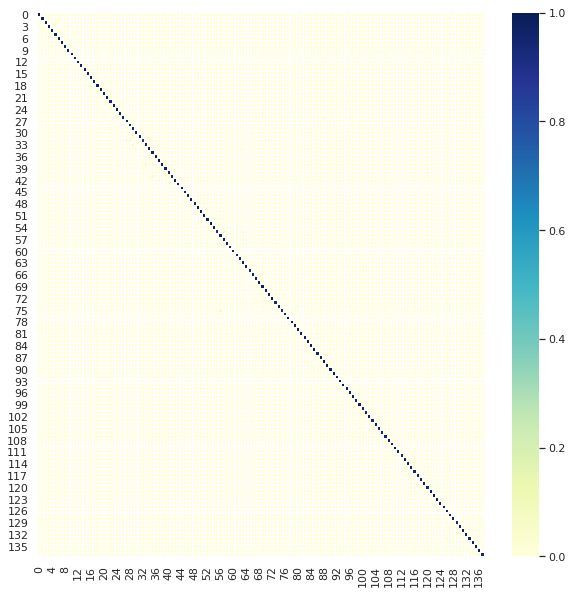

Nonzero percentage:  5.02 %


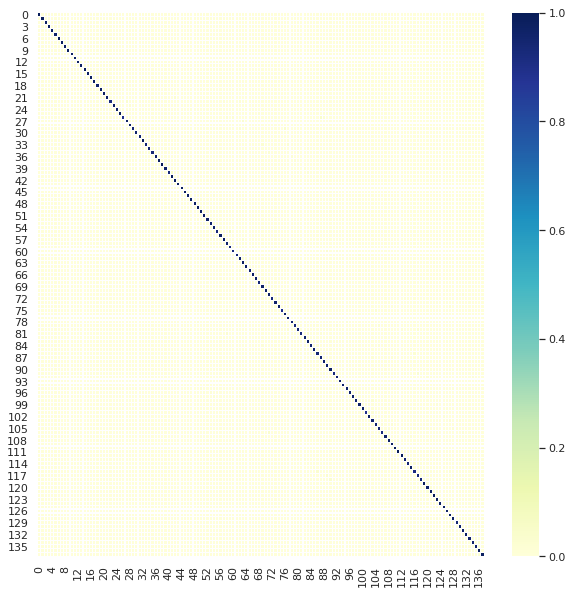

Nonzero percentage:  5.37 %


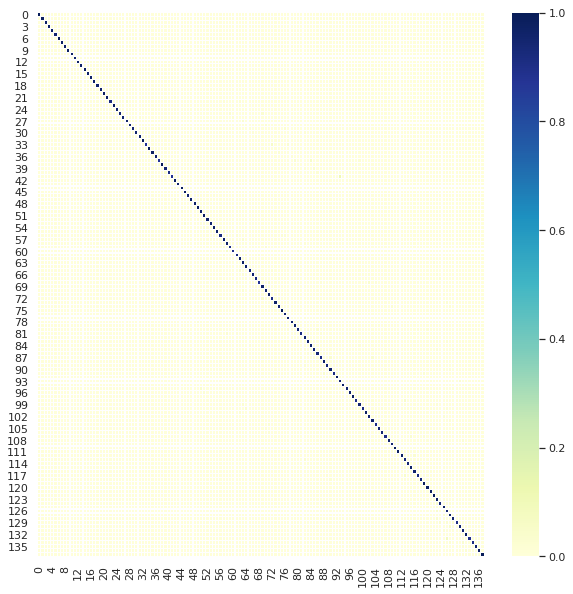

Nonzero percentage:  5.51 %


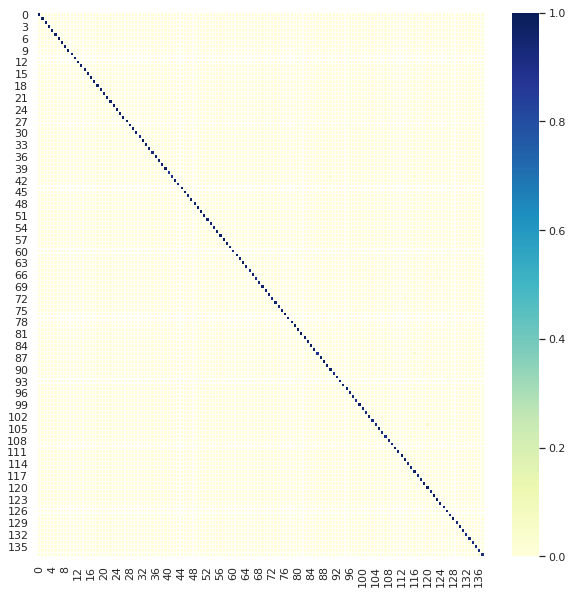

Nonzero percentage:  5.09 %


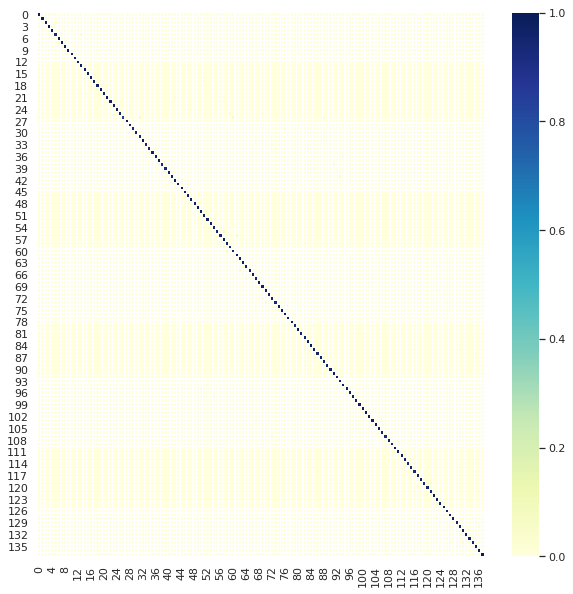

Nonzero percentage:  6.25 %


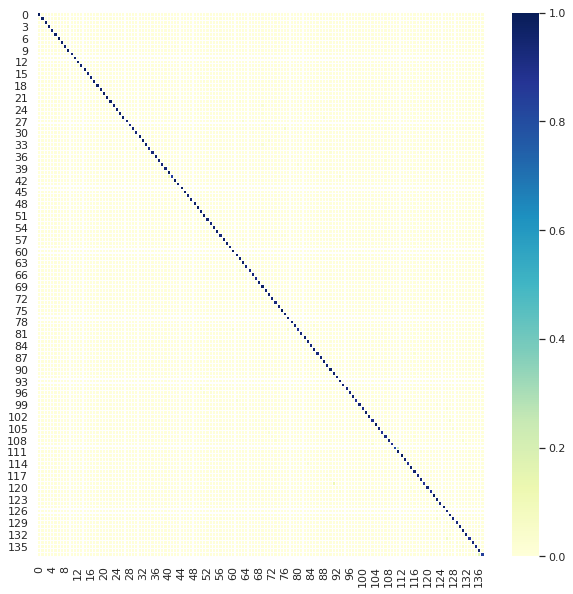

Nonzero percentage:  6.09 %


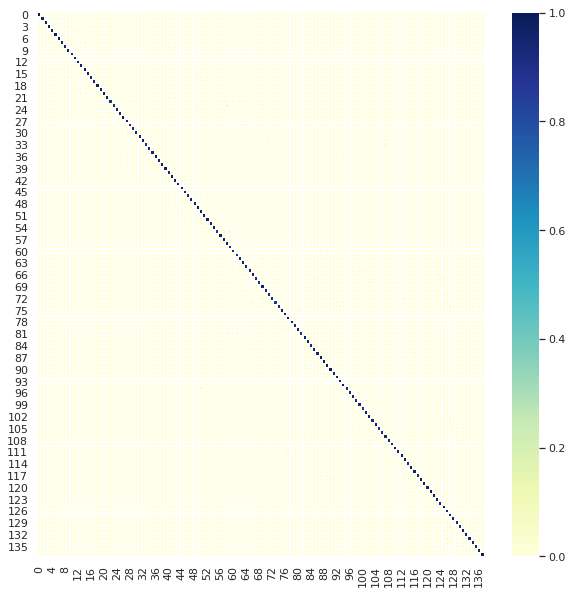

Nonzero percentage:  4.82 %


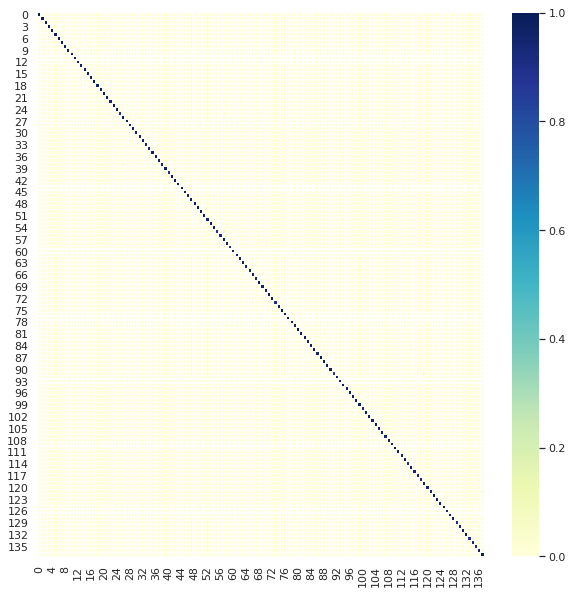

Nonzero percentage:  6.33 %


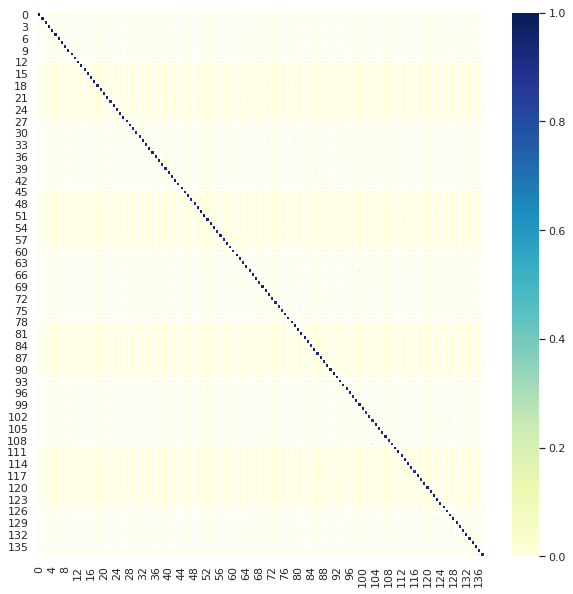

Nonzero percentage:  4.17 %


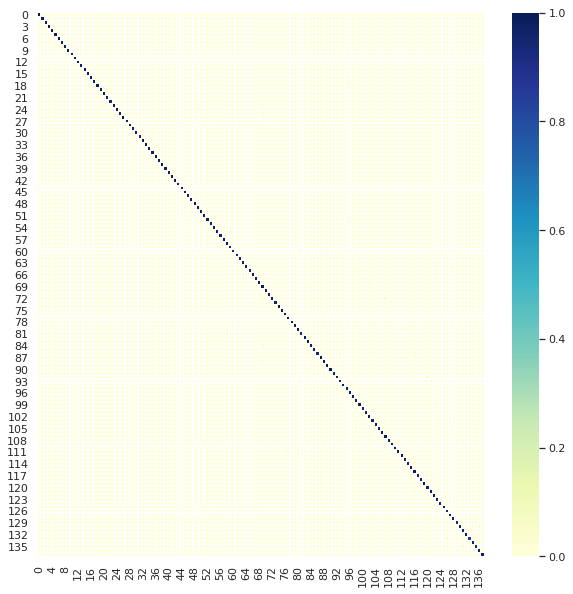

Nonzero percentage:  5.21 %


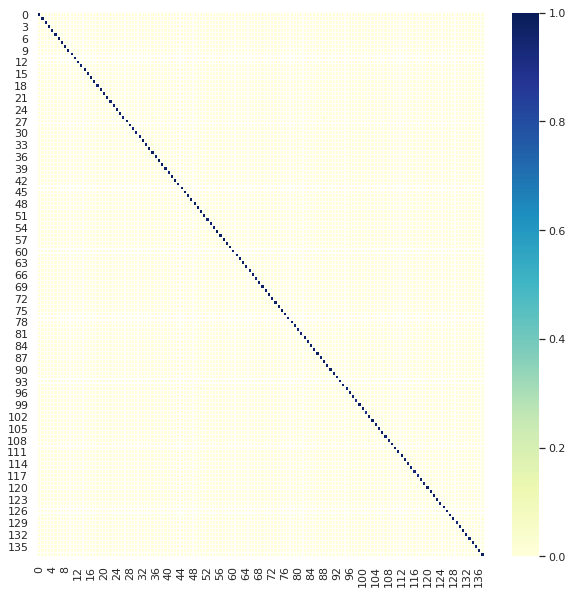

Nonzero percentage:  4.31 %


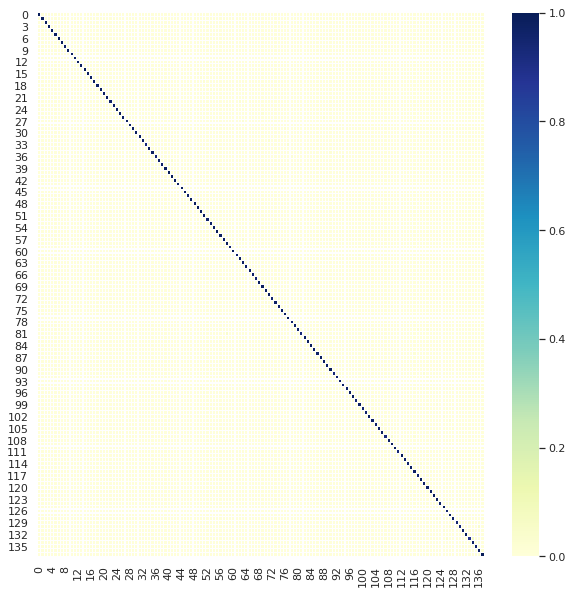

Nonzero percentage:  4.54 %


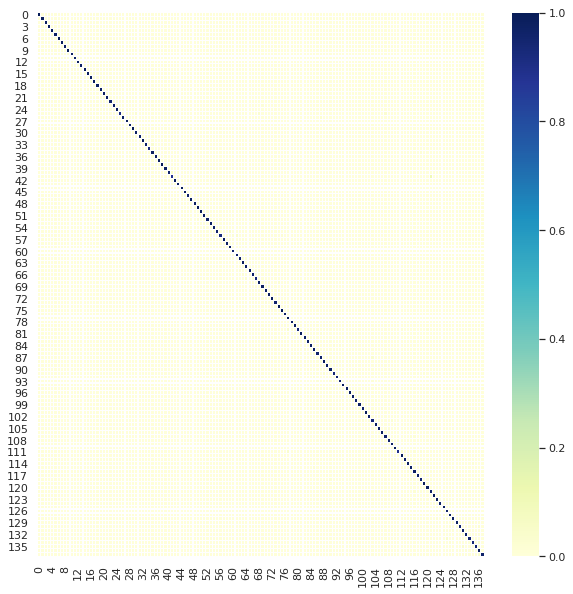

Nonzero percentage:  3.83 %


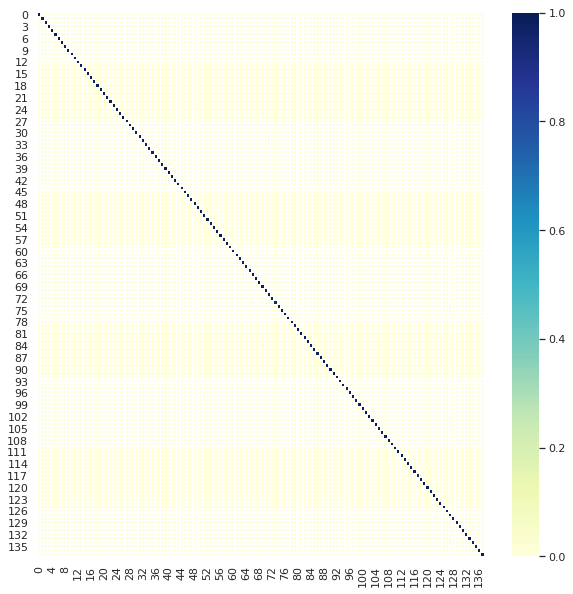

Nonzero percentage:  4.09 %


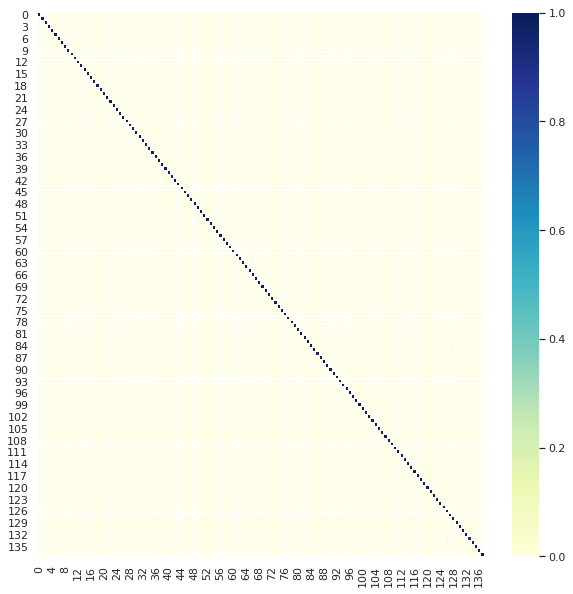

Nonzero percentage:  3.99 %


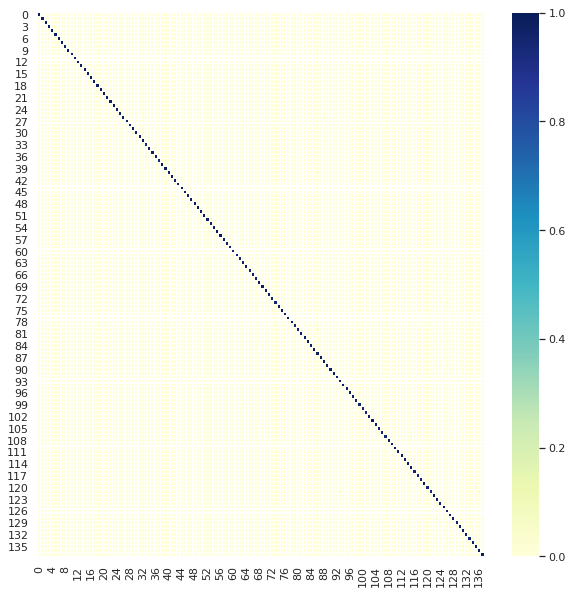

Nonzero percentage:  4.25 %


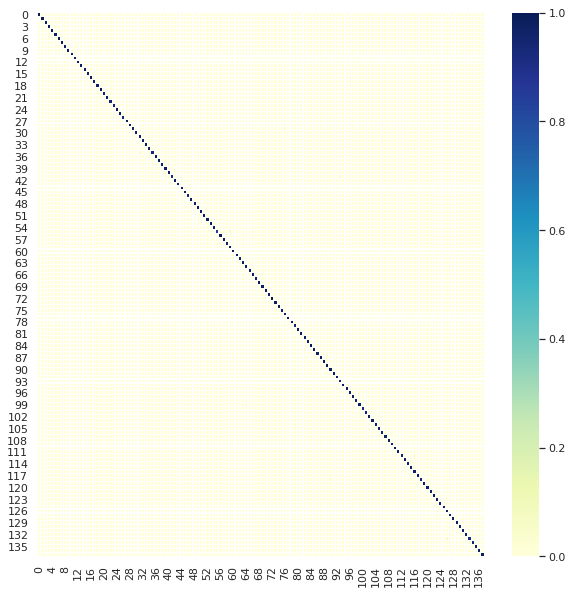

Nonzero percentage:  4.98 %


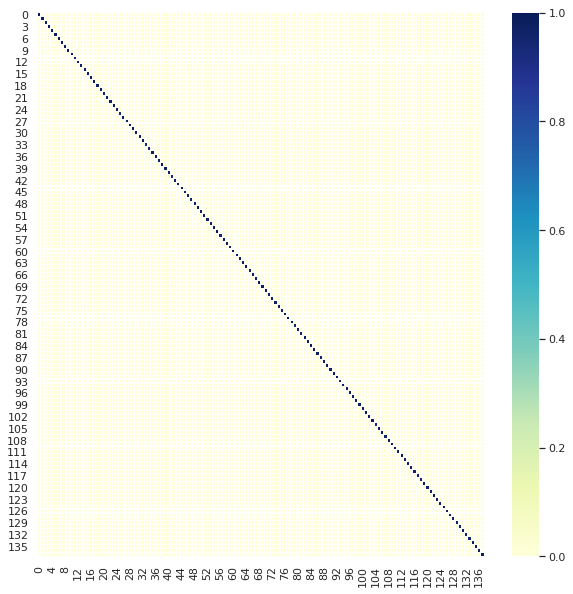

Nonzero percentage:  4.35 %


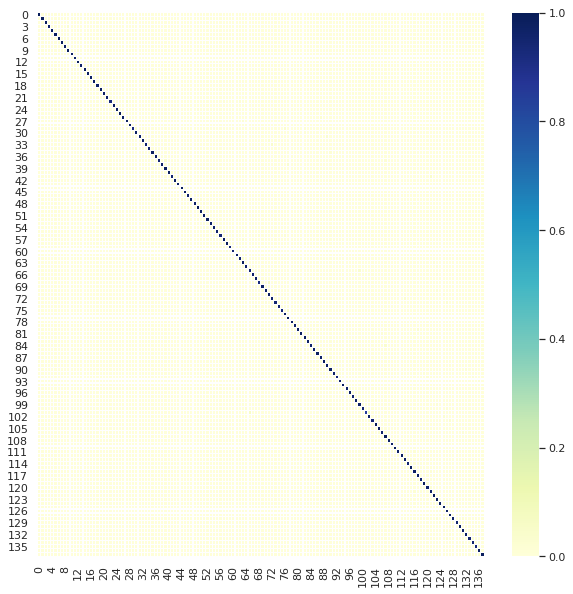

Nonzero percentage:  4.03 %


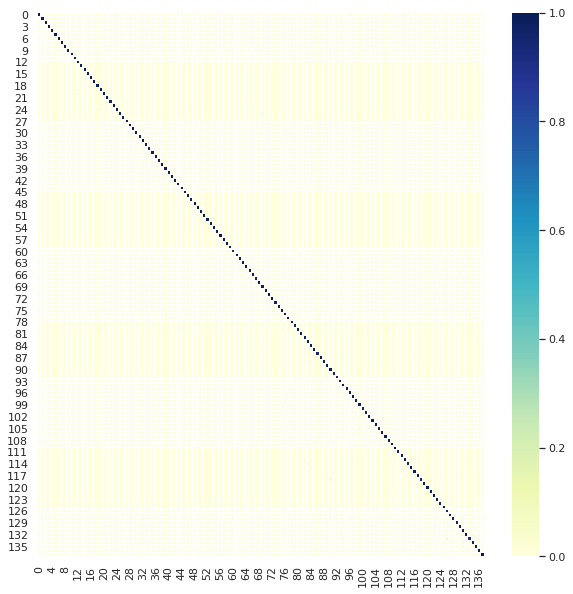

Nonzero percentage:  4.17 %


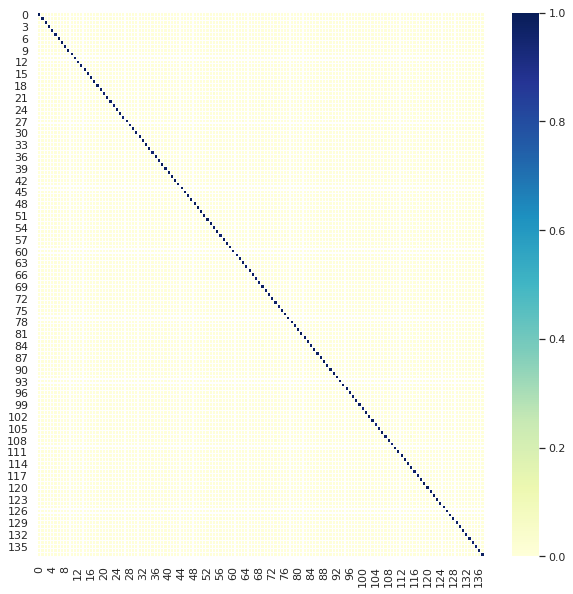

In [43]:
for transition_matrix in acc_result['transition_matrices']:
    sns.set(rc={'figure.figsize': (10, 10)})
    print('Nonzero percentage: ', round(100 * len(np.where(transition_matrix > 0)[0]) / (unique_triad_num * unique_triad_num), 2), '%')
    sns.heatmap(transition_matrix, cmap="YlGnBu", linewidths=.1)
    plt.show()

In [ ]:
# for transition_matrix in acc_result['transition_matrices']:
#     sns.set(rc={'figure.figsize': (8, 8)})
#     plt.plot(np.sum(transition_matrix, axis=0))

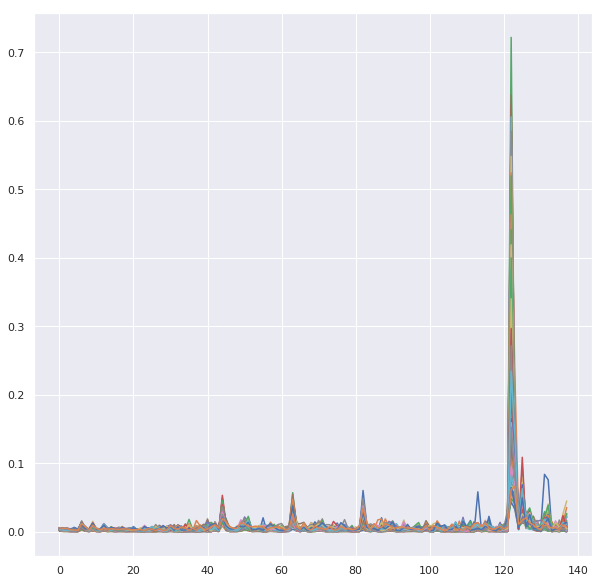

In [44]:
sns.set(rc={'figure.figsize': (10, 10)})
st_dists = []
for transition_matrix in acc_result['transition_matrices']:
    st_dist = network_utils.get_stationary_distribution(transition_matrix)
    st_dists.append(st_dist)
    plt.plot(st_dist)
# plt.legend(['P'+str(i) for i in range(1, 1+len(acc_result['transition_matrices']))])

In [45]:
acc_mean_transition_matrix = np.zeros(
    (unique_triad_num, unique_triad_num))
acc_std_transition_matrix = np.zeros(
    (unique_triad_num, unique_triad_num))
for i in range(unique_triad_num):
    for j in range(unique_triad_num):
        item_ij = []
        for matrix in acc_result['transition_matrices']:
            item_ij.append(matrix[i, j])
        acc_mean_transition_matrix[i, j] = np.mean(item_ij)
        acc_std_transition_matrix[i, j] = np.std(item_ij)

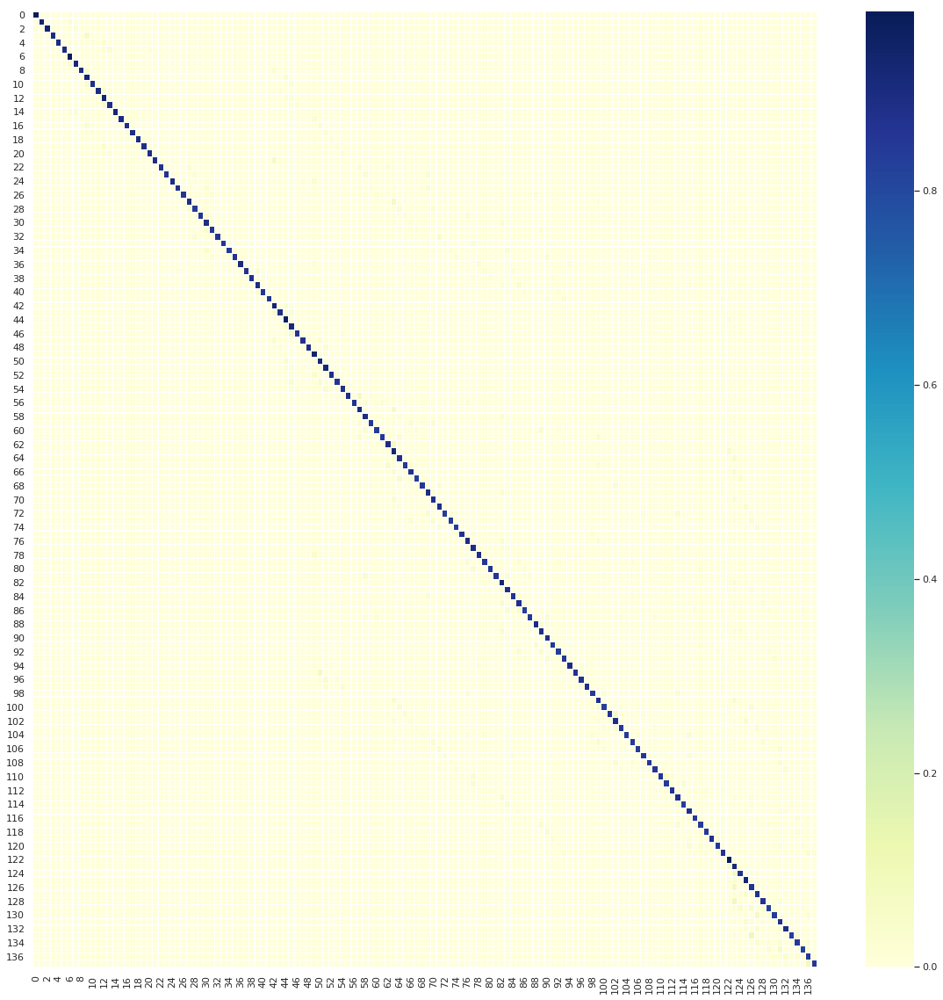

In [46]:
sns.set(rc={'figure.figsize': (20, 20)})
sns.heatmap(acc_mean_transition_matrix, cmap="YlGnBu", linewidths=.1);

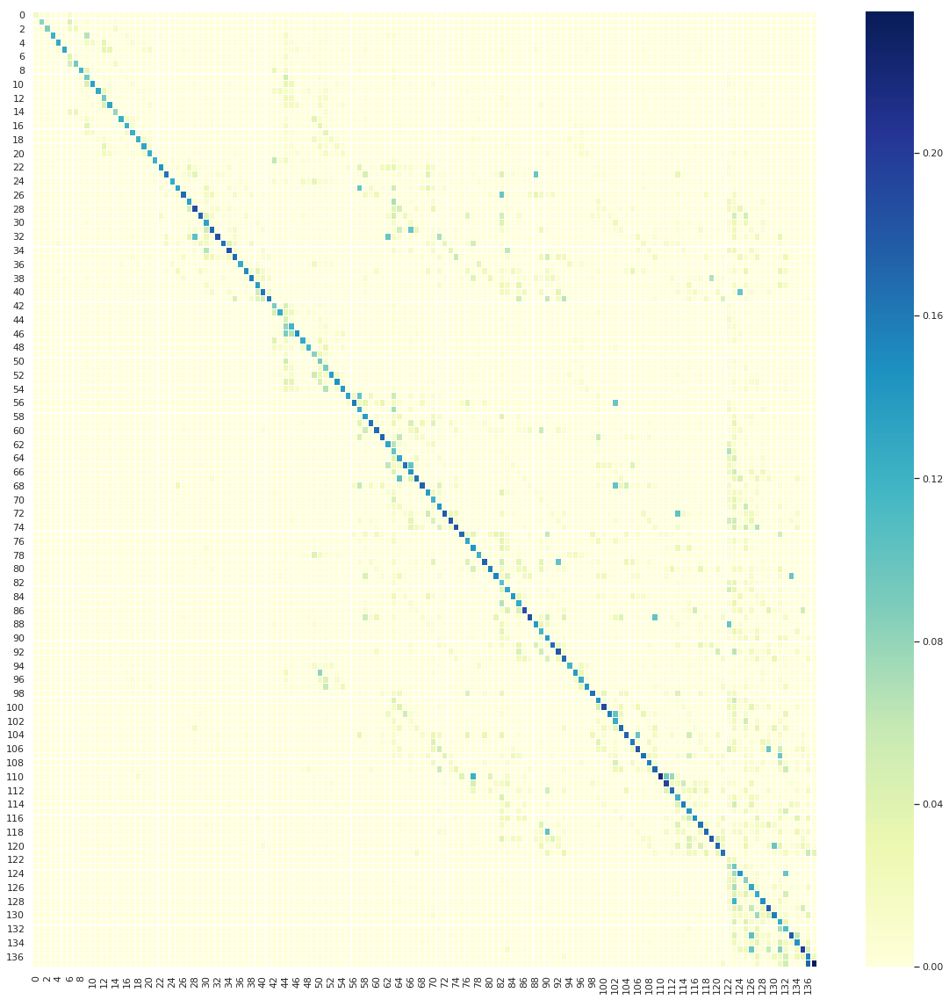

In [47]:
sns.set(rc={'figure.figsize': (20, 20)})
sns.heatmap(acc_std_transition_matrix, cmap="YlGnBu", linewidths=.1);

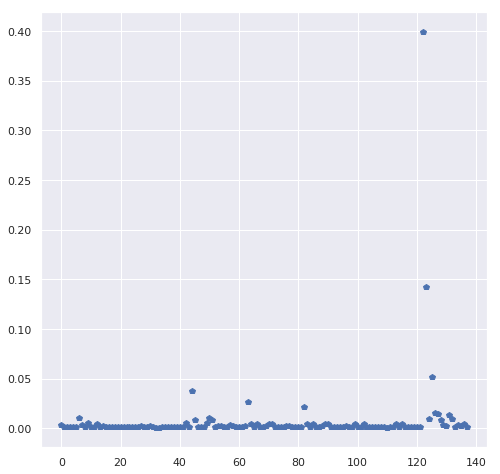

In [48]:
sns.set(rc={'figure.figsize': (8, 8)})
acc_st_dist = network_utils.get_stationary_distribution(acc_mean_transition_matrix)
plt.plot(acc_st_dist, 'p');

In [49]:
for index in np.where(acc_st_dist >= 0.06)[0]:
    print(triad_list[index])
    print('\n')

[[0 1 1]
 [1 0 1]
 [1 1 0]]


[[ 0  1  1]
 [ 1  0  1]
 [ 1 -1  0]]




In [50]:
for index in np.where(acc_st_dist >= np.mean(acc_st_dist))[0]:
    print(triad_list[index])
    print('\n')

[[0 0 0]
 [0 0 1]
 [0 1 0]]


[[0 0 1]
 [0 0 1]
 [1 1 0]]


[[ 0  0  1]
 [ 0  0  1]
 [ 1 -1  0]]


[[ 0  0  1]
 [ 0  0 -1]
 [ 1  1  0]]


[[ 0  0  1]
 [ 0  0 -1]
 [ 1 -1  0]]


[[0 0 1]
 [1 0 1]
 [1 1 0]]


[[ 0  0  1]
 [-1  0  1]
 [ 1  1  0]]


[[0 1 1]
 [1 0 1]
 [1 1 0]]


[[ 0  1  1]
 [ 1  0  1]
 [ 1 -1  0]]


[[ 0  1  1]
 [ 1  0  1]
 [-1 -1  0]]


[[ 0  1  1]
 [ 1  0 -1]
 [ 1 -1  0]]


[[ 0  1  1]
 [ 1  0 -1]
 [-1  1  0]]


[[ 0  1  1]
 [ 1  0 -1]
 [-1 -1  0]]


[[ 0  1  1]
 [-1  0  1]
 [-1  1  0]]


[[ 0  1 -1]
 [ 1  0 -1]
 [ 1 -1  0]]


[[ 0  1 -1]
 [ 1  0 -1]
 [-1 -1  0]]




# Convex estimating the transition matrices

In [6]:
def get_array_of_138(a):
    r = a
    if len(a) < 138:
        r = np.array(list(a) + [0 for i in range(138 - len(a))])
    return r

def get_matrix_stochastic(a):
    a = a / np.sum(a)
    return np.matrix(a)

In [8]:
l = 40
loaded_d = utils.load_it('/home/omid/Downloads/DT/cvx_data.pk')
obs = loaded_d['obs']
T = loaded_d['T']

obs_mat = []
for o in obs:
    obs_mat.append(np.matrix(o))
    
obs_normalized = []
for o in obs:
    obs_normalized.append(get_matrix_stochastic(o))

### Convex optimization problem

In [9]:
import cvxpy as cp

In [ ]:
# start_time = time.time()

# # l = 103
# n = 138
# lam1 = 0.4
# lam2 = 0.2
# lam3 = 0.1
# lam4 = 0.1

# # Variables.
# M = [cp.Variable(n, n) for _ in range(l-1)]

# # Objective function.
# term1 = 0
# for i in range(l-1):
# #     term1 += cp.norm2(obs_mat[i] * M[i] - obs_mat[i + 1])
#     term1 += cp.norm2(obs_normalized[i] * M[i] - obs_normalized[i + 1])

# term2 = 0
# for i in range(1, l-1):
#     term2 += cp.norm2(M[i] - M[i - 1])
# term2 *= lam1

# term3 = 0
# for i in range(1, l-1):
#     term3 += cp.norm1(M[i] - M[i - 1])
# term3 *= lam2

# # term3 = 0
# # for i in range(l-1):
# #     term3 += cp.norm2(M[i] - T[i])
# # term3 *= lam2

# # term4 = 0
# # for i in range(l-1):
# #     term4 += cp.norm1(M[i])
# # term4 *= lam3

# # term5 = 0
# # for i in range(l-1):
# #     term5 += cp.norm_nuc.normNuc(M[i])
# # term5 *= lam4

# objective = cp.Minimize(term1 + term2 + term3) #+ term4) # + term5)

# # Constraints.
# constraints = []
# for i in range(l-1):
#     constraints += (
#         [0 <= M[i],
#          M[i] <= 1,
#          M[i] * np.ones(n) == np.ones(n)])
# #          obs_normalized[i + 1] * M[i] == obs_normalized[i + 1]])
    
# # Problem.
# prob = cp.Problem(objective, constraints)

# # Solving the problem.
# # res = prob.solve(cp.SCS)
# # res = prob.solve(cp.CVXOPT)
# res = prob.solve(cp.MOSEK)
# # res = prob.solve()
# print(res)

# duration = time.time() - start_time
# print('It took :{} mins.'.format(round(duration/60, 2)))

In [ ]:
# start_time = time.time()

# # l = 103
# n = 138
# lam1 = 0.4
# lam2 = 0.2
# lam3 = 0.1
# lam4 = 0.1

# # Variables.
# M = [cp.Variable(n, n) for _ in range(l-1)]

# # Objective function.
# term1 = 0
# for i in range(l-1):
# #     term1 += cp.norm2(obs_mat[i] * M[i] - obs_mat[i + 1])
#     term1 += cp.norm2(obs_normalized[i] * M[i] - obs_normalized[i + 1])

# term2 = 0
# for i in range(1, l-1):
#     term2 += cp.norm1(M[i] - M[i - 1])
# term2 *= lam1

# # term3 = 0
# # for i in range(l-1):
# #     term3 += cp.norm2(M[i] - T[i])
# # term3 *= lam2

# # term4 = 0
# # for i in range(l-1):
# #     term4 += cp.norm1(M[i])
# # term4 *= lam3

# # term5 = 0
# # for i in range(l-1):
# #     term5 += cp.norm_nuc.normNuc(M[i])
# # term5 *= lam4

# objective = cp.Minimize(term1 + term2) #+ term3) #+ term4) # + term5)

# # Constraints.
# constraints = []
# for i in range(l-1):
#     constraints += (
#         [0 <= M[i],
#          M[i] <= 1,
#          M[i] * np.ones(n) == np.ones(n)])
# #          obs_normalized[i + 1] * M[i] == obs_normalized[i + 1]])
    
# # Problem.
# prob = cp.Problem(objective, constraints)

# # Solving the problem.
# # res = prob.solve(cp.SCS)
# # res = prob.solve(cp.CVXOPT)
# res = prob.solve(cp.MOSEK)
# # res = prob.solve()
# print(res)

# duration = time.time() - start_time
# print('It took :{} mins.'.format(round(duration/60, 2)))

In [33]:
# start_time = time.time()

# # l = 103
# n = 138
# lam1 = 0.4
# lam2 = 0.2
# lam3 = 0.1
# lam4 = 0.1

# # Variables.
# M = [cp.Variable(n, n) for _ in range(l-1)]

# # Objective function.
# term1 = 0
# for i in range(l-1):
# #     term1 += cp.norm2(obs_mat[i] * M[i] - obs_mat[i + 1])
#     term1 += cp.norm2(obs_normalized[i] * M[i] - obs_normalized[i + 1])

# term2 = 0
# for i in range(1, l-1):
#     term2 += cp.norm2(M[i] - M[i - 1])
# term2 *= lam1

# # term3 = 0
# # for i in range(l-1):
# #     term3 += cp.norm2(M[i] - T[i])
# # term3 *= lam2

# # term4 = 0
# # for i in range(l-1):
# #     term4 += cp.norm1(M[i])
# # term4 *= lam3

# # term5 = 0
# # for i in range(l-1):
# #     term5 += cp.norm_nuc.normNuc(M[i])
# # term5 *= lam4

# objective = cp.Minimize(term1 + term2) #+ term3) #+ term4) # + term5)

# # Constraints.
# constraints = []
# for i in range(l-1):
#     constraints += (
#         [0 <= M[i],
#          M[i] <= 1,
#          M[i] * np.ones(n) == np.ones(n),
#          obs_normalized[i + 1] * M[i] == obs_normalized[i + 1]])
    
# # Problem.
# prob = cp.Problem(objective, constraints)

# # Solving the problem.
# # res = prob.solve(cp.SCS)
# # res = prob.solve(cp.CVXOPT)
# res = prob.solve(cp.MOSEK)
# # res = prob.solve()
# print(res)

# duration = time.time() - start_time
# print('It took :{} mins.'.format(round(duration/60, 2)))

0.10607050009110991
It took :3.3 mins.


In [10]:
start_time = time.time()

# l = 103
n = 138
lam1 = 0.4
lam2 = 0.2
lam3 = 0.1
lam4 = 0.1

# Variables.
M = [cp.Variable(n, n) for _ in range(l-1)]

# Objective function.
term1 = 0
for i in range(l-1):
#     term1 += cp.norm2(obs_mat[i] * M[i] - obs_mat[i + 1])
    term1 += cp.norm2(obs_normalized[i] * M[i] - obs_normalized[i + 1])

term2 = 0
for i in range(1, l-1):
    term2 += cp.norm1(M[i] - M[i - 1])
term2 *= lam1

# term3 = 0
# for i in range(l-1):
#     term3 += cp.norm2(M[i] - T[i])
# term3 *= lam2

# term4 = 0
# for i in range(l-1):
#     term4 += cp.norm1(M[i])
# term4 *= lam3

# term5 = 0
# for i in range(l-1):
#     term5 += cp.norm_nuc.normNuc(M[i])
# term5 *= lam4

objective = cp.Minimize(term1 + term2) #+ term3) # + term5)

# Constraints.
constraints = []
for i in range(l-1):
    constraints += (
        [0 <= M[i],
         M[i] <= 1,
         M[i] * np.ones(n) == np.ones(n)])
    
# Problem.
prob = cp.Problem(objective, constraints)

# Solving the problem.
# res = prob.solve(cp.SCS)
# res = prob.solve(cp.CVXOPT)
res = prob.solve(cp.MOSEK)
# res = prob.solve()
print(res)

duration = time.time() - start_time
print('It took :{} mins.'.format(round(duration/60, 2)))

0.5430184828351463
It took :17.67 mins.


In [11]:
l

40

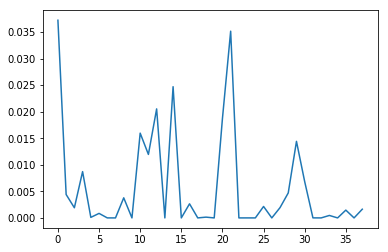

In [12]:
diff = []
for i in range(1, l-1):
    diff.append(np.linalg.norm(M[i].value - M[i-1].value))
plt.plot(diff);

In [13]:
transitives = []
for triad in triad_list:
    transitives.append(network_utils.is_sparsely_transitive_balanced(triad))
transitives = np.array(transitives)

In [14]:
ch = []
for triad in triad_list:
    ch.append(network_utils.is_sparsely_cartwright_harary_balanced(triad))
ch = np.array(ch)

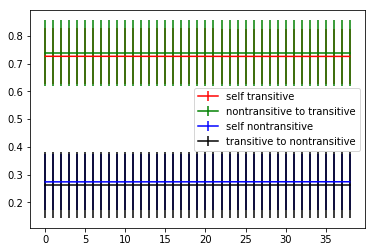

In [15]:
self_transitive_means = []
self_nontransitive_means = []
nontransitive_to_transitive_means = []
transitive_to_nontransitive_means = []
self_transitive_stds = []
self_nontransitive_stds = []
nontransitive_to_transitive_stds = []
transitive_to_nontransitive_stds = []

for matrix in M:
    trans_matrix = matrix.value
    
    probs = np.sum(trans_matrix[transitives, :][:, transitives], axis=1)
    self_transitive_means.append(np.mean(probs))
    self_transitive_stds.append(np.std(probs))

    probs = np.sum(trans_matrix[~transitives, :][:, transitives], axis=1)
    nontransitive_to_transitive_means.append(np.mean(probs))
    nontransitive_to_transitive_stds.append(np.std(probs))

    probs = np.sum(trans_matrix[~transitives, :][:, ~transitives], axis=1)
    transitive_to_nontransitive_means.append(np.mean(probs))
    transitive_to_nontransitive_stds.append(np.std(probs))

    probs = np.sum(trans_matrix[transitives, :][:, ~transitives], axis=1)
    self_nontransitive_means.append(np.mean(probs))
    self_nontransitive_stds.append(np.std(probs))
    

plt.errorbar(x=np.arange(l-1), y=self_transitive_means, yerr=self_transitive_stds, fmt='r')
plt.errorbar(x=np.arange(l-1), y=nontransitive_to_transitive_means, yerr=nontransitive_to_transitive_stds, fmt='g')
plt.errorbar(x=np.arange(l-1), y=self_nontransitive_means, yerr=self_nontransitive_stds, fmt='b')
plt.errorbar(x=np.arange(l-1), y=transitive_to_nontransitive_means, yerr=transitive_to_nontransitive_stds, fmt='k')
plt.legend(['self transitive', 'nontransitive to transitive', 'self nontransitive', 'transitive to nontransitive']);


# plt.errorbar(x=np.arange(39), y=self_transitive_means) #, yerr=self_transitive_stds)
# plt.errorbar(x=np.arange(39), y=nontransitive_to_transitive_means) #, yerr=nontransitive_to_transitive_stds)
# plt.errorbar(x=np.arange(39), y=self_nontransitive_means) #, yerr=self_nontransitive_stds)
# plt.errorbar(x=np.arange(39), y=transitive_to_nontransitive_means) #, yerr=transitive_to_nontransitive_stds)
# plt.legend(['self transitive', 'nontransitive to transitive', 'self nontransitive', 'transitive to nontransitive']);

# Predicting future of each edge with respect to all triads that is involved in

## Separated 

In [ ]:
period_index = 0

dgraph = separate_dgraphs[period_index]
nodes = dgraph.nodes()
for edge in dgraph.edges():
    rest_of_nodes = list(set(nodes) - set(edge))
    for node in rest_of_nodes:
        triad_type = result['triads_types'][period_index][str(tuple(sorted([edge[0], edge[1], node])))]
        prob = result['transition_matrices'][period_index][triad_type, :]
        print(prob)
        break
    break

## Accumulative

# Predicting future transition and ratio of triads

In [ ]:
period_index = 0

matrix = acc_result['transition_matrices'][period_index]
triad_count = np.bincount(list(result['triads_types'][period_index].values()), minlength=138)
triad_count = triad_count / np.sum(triad_count)

In [ ]:
predicted_period_count = np.squeeze(np.asarray(np.matrix(triad_count) * np.matrix(matrix)))

In [ ]:
next_triad_count = np.bincount(list(result['triads_types'][period_index+1].values()), minlength=138)
next_triad_count = next_triad_count / np.sum(next_triad_count)

In [ ]:
sns.set(rc={'figure.figsize': (8, 8)})
plt.plot(np.array(abs(predicted_period_count - next_triad_count)));

## Timeseries prediction for transition matrices

In [ ]:
sns.set(rc={'figure.figsize': (100, 100)})
sns.set(font_scale=0.25)
c = 0
for i in range(unique_triad_num):
    for j in range(unique_triad_num):
        c += 1
        item_ij = []
        for matrix in result['transition_matrices']:
            item_ij.append(matrix[i, j])
        plt.subplot(unique_triad_num, unique_triad_num, c)
        plt.plot(item_ij)
        if c > 139:
            break
    if c > 139:
        break

In [ ]:
from statsmodels.tsa.arima_model import ARIMA
from sklearn.metrics import mean_squared_error
from math import sqrt

In [ ]:
leng = 4

rmses = 0
errors = {}
for i in range(unique_triad_num):
    for j in range(unique_triad_num):
        item_ij = []
        for matrix in result['transition_matrices']:
            item_ij.append(matrix[i, j])
        # Timeseries forecasting.
        model = ARIMA(item_ij[:-leng], order=(2, 1, 0))
        model = model.fit()
        rmse = sqrt(mean_squared_error(item_ij[-leng:], model.forecast(steps=leng)[0]))
        errors[str((i, j))] = rmse
        rmses += rmse

In [ ]:
rmses / (unique_triad_num * unique_triad_num)

### Only for one item in the matrix

In [ ]:
i = 0
j = 0
item_ij = []
for matrix in result['transition_matrices']:
    item_ij.append(matrix[i, j])
# Timeseries forecasting.
model = ARIMA(item_ij[:-leng], order=(2, 1, 0))
model_fit = model.fit()

In [ ]:
plt.plot(item_ij)

In [ ]:
print(model_fit.summary())
# plot residual errors
residuals = pd.DataFrame(model_fit.resid)
residuals.plot()
plt.show()
residuals.plot(kind='kde')
plt.show()
print(residuals.describe())

In [ ]:
# residual = item_ij[-leng:] - fitted_model.forecast(steps=leng)[0]
# rmse = sqrt(mean_squared_error(item_ij[-leng:], fitted_model.forecast(steps=leng)[0]))
# print('RMSE: ', rmse)
# plt.plot(residual);

In [ ]:
# plt.plot(pd.rolling_mean(pd.DataFrame(item_ij), window=12))

In [ ]:
# plt.plot(pd.rolling_std(pd.DataFrame(item_ij), window=12));

# Cartwright & Harary balance

In [ ]:
# for separate_dgraph in separate_dgraphs:
#     print('cartwright & harary unbalance ratio: ',
#           network_utils.cartwright_harary_balance(separate_dgraph))

# How transition matrices change over time

In [10]:
periods = network_utils.get_just_periods(edge_list=data, weeks=weeks, accumulative=False)

## L2-nrom distance of each matrix from the average transition matrix.

### Separated

/cs/student/omid55/.local/lib/python3.4/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


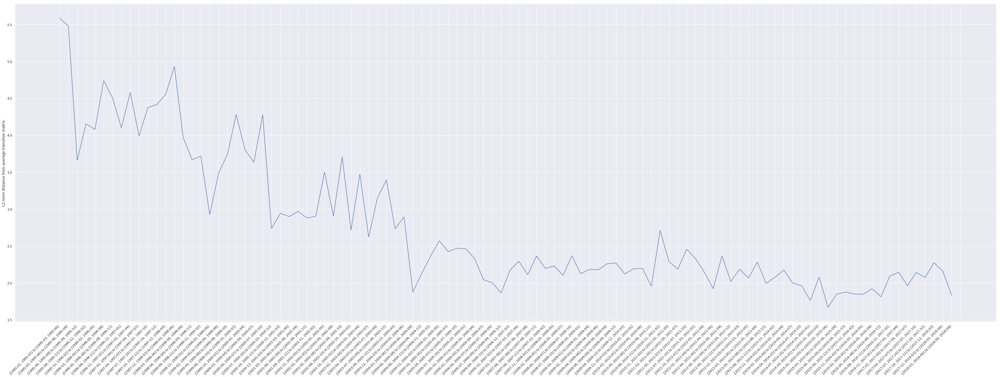

In [26]:
sns.set(rc={'figure.figsize': (60, 20)})
l2norm_dists = []
for matrix in result['transition_matrices']:
    l2norm_dists.append(np.linalg.norm(matrix - mean_transition_matrix))
plt.plot(l2norm_dists)
plt.ylabel('L2-norm distance from average transition matrix.')
# seting xticks
ax = plt.axes()
number_of_periods = len(periods)
ax.set_xticks(list(range(number_of_periods)))
labels = ['[{}, {}] to [{}, {}]'.format(periods[i][0][:7], periods[i][1][:7], periods[i+1][0][:7], periods[i+1][1][:7]) for i in range(number_of_periods-1)]
ax.set_xticklabels(labels, rotation=45);
for tick in ax.xaxis.get_majorticklabels():
    tick.set_horizontalalignment("right")

### Accumulative

/cs/student/omid55/.local/lib/python3.4/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


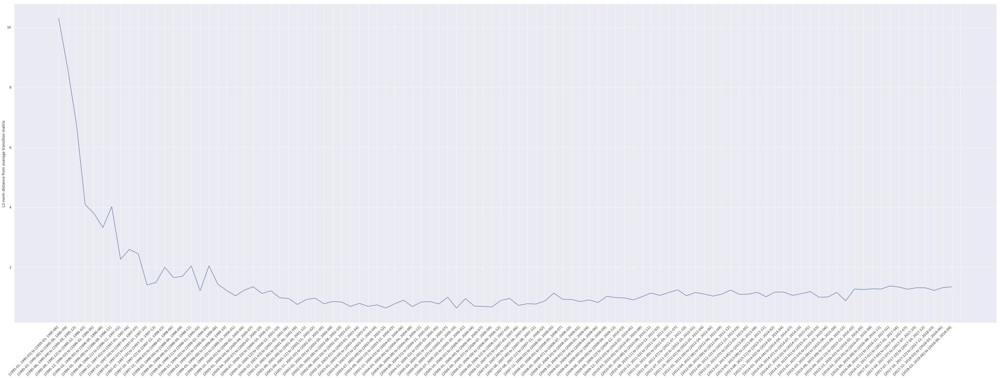

In [52]:
sns.set(rc={'figure.figsize': (60, 20)})
acc_l2norm_dists = []
for matrix in acc_result['transition_matrices']:
    acc_l2norm_dists.append(np.linalg.norm(matrix - acc_mean_transition_matrix))
plt.plot(acc_l2norm_dists)
plt.ylabel('L2-norm distance from average transition matrix.')
# seting xticks
ax = plt.axes()
number_of_periods = len(periods)
ax.set_xticks(list(range(number_of_periods)))
labels = ['[{}, {}] to [{}, {}]'.format(periods[i][0][:7], periods[i][1][:7], periods[i+1][0][:7], periods[i+1][1][:7]) for i in range(number_of_periods-1)]
ax.set_xticklabels(labels, rotation=45);
for tick in ax.xaxis.get_majorticklabels():
    tick.set_horizontalalignment("right")

## L2-nrom distance of each matrix from its previous one.

### Separated

/cs/student/omid55/.local/lib/python3.4/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


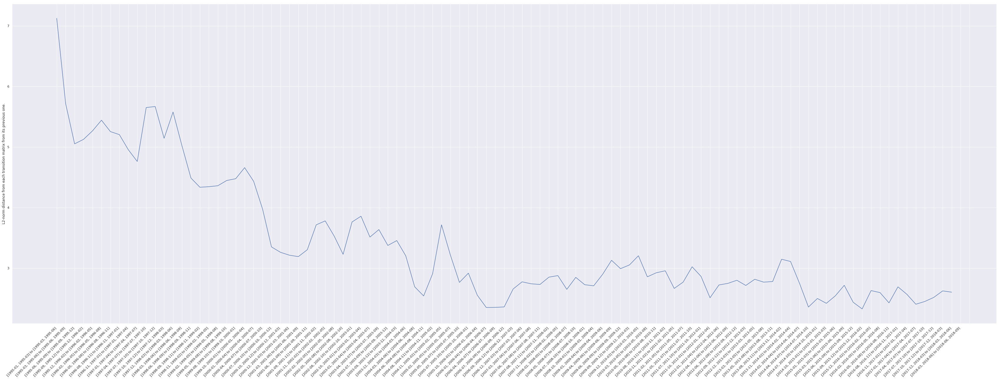

In [12]:
sns.set(rc={'figure.figsize': (60, 20)})
from_prev_l2norm_dists = []
n = len(result['transition_matrices'])
for i in range(1, n):
    current = result['transition_matrices'][i]
    prev = result['transition_matrices'][i-1]
    from_prev_l2norm_dists.append(np.linalg.norm(prev - current))
plt.plot(from_prev_l2norm_dists)
plt.ylabel('L2-norm distance from each transition matrix from its previous one.')
# seting xticks
ax = plt.axes()
number_of_periods = len(periods)
ax.set_xticks(list(range(number_of_periods)))
labels = ['[{}, {}] to [{}, {}]'.format(periods[i][0][:7], periods[i][1][:7], periods[i+1][0][:7], periods[i+1][1][:7]) for i in range(number_of_periods-1)]
ax.set_xticklabels(labels, rotation=45);
for tick in ax.xaxis.get_majorticklabels():
    tick.set_horizontalalignment("right")

### Accumulative

/cs/student/omid55/.local/lib/python3.4/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


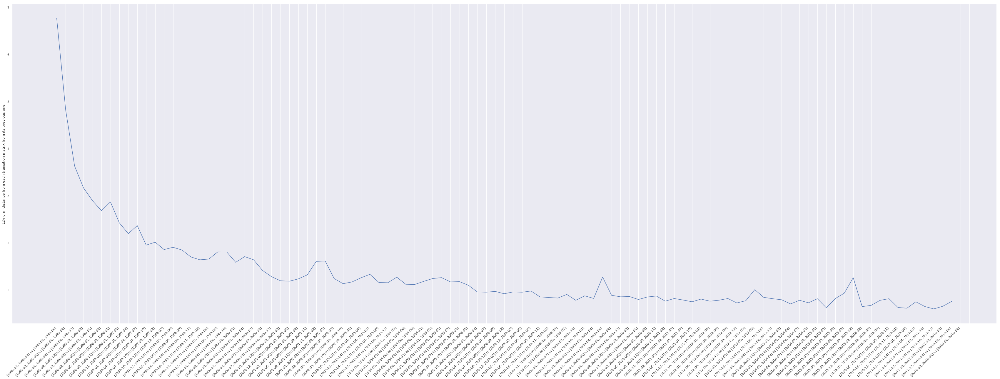

In [19]:
sns.set(rc={'figure.figsize': (60, 20)})
acc_from_prev_l2norm_dists = []
n = len(acc_result['transition_matrices'])
for i in range(1, n):
    current = acc_result['transition_matrices'][i]
    prev = acc_result['transition_matrices'][i-1]
    acc_from_prev_l2norm_dists.append(np.linalg.norm(prev - current))
plt.plot(acc_from_prev_l2norm_dists)
plt.ylabel('L2-norm distance from each transition matrix from its previous one.')
# seting xticks
ax = plt.axes()
number_of_periods = len(periods)
ax.set_xticks(list(range(number_of_periods)))
labels = ['[{}, {}] to [{}, {}]'.format(periods[i][0][:7], periods[i][1][:7], periods[i+1][0][:7], periods[i+1][1][:7]) for i in range(number_of_periods-1)]
ax.set_xticklabels(labels, rotation=45);
for tick in ax.xaxis.get_majorticklabels():
    tick.set_horizontalalignment("right")

# Transitivity balance over time

In [16]:
balanced = 0
transitive_balances = []
for triad in triad_list:
    bal = network_utils.is_sparsely_transitive_balanced(triad)
    transitive_balances.append(bal)
    if bal:
        balanced += 1

In [55]:
print('Transitive balanced triads: ', balanced)
print('Out of triads: ', len(triad_list))

Transitive balanced triads:  93
Out of triads:  138


# CVX Optimized Transitivity analysis

In [26]:
transitives = []
for triad in triad_list:
    transitives.append(network_utils.is_sparsely_transitive_balanced(triad))
transitives = np.array(transitives)

In [27]:
trans_matrix = M[l-1-1].value

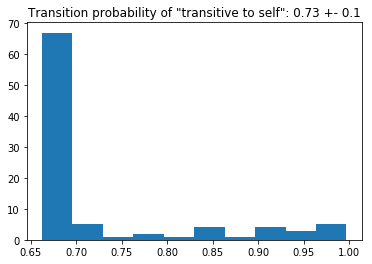

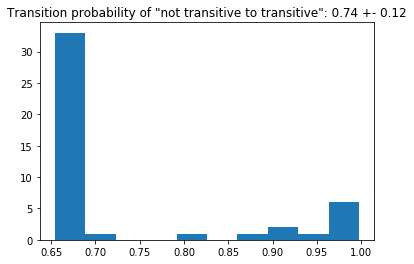

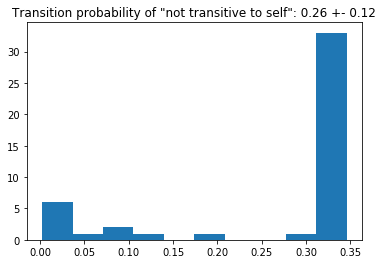

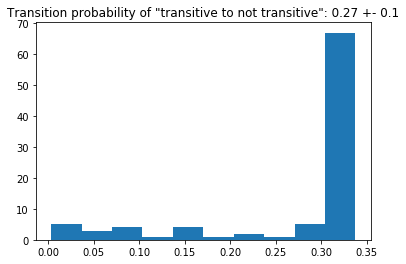

In [28]:
probs = np.sum(trans_matrix[transitives, :][:, transitives], axis=1)
plt.hist(probs)
plt.title(
    'Transition probability of "transitive to self": {} +- {}'.format(
        round(np.mean(probs), 2), round(np.std(probs), 2)))
plt.show()

probs = np.sum(trans_matrix[~transitives, :][:, transitives], axis=1)
plt.hist(probs)
plt.title('Transition probability of "not transitive to transitive": {} +- {}'.format(
        round(np.mean(probs), 2), round(np.std(probs), 2)))
plt.show()


probs = np.sum(trans_matrix[~transitives, :][:, ~transitives], axis=1)
plt.hist(probs)
plt.title('Transition probability of "not transitive to self": {} +- {}'.format(
        round(np.mean(probs), 2), round(np.std(probs), 2)))
plt.show()

probs = np.sum(trans_matrix[transitives, :][:, ~transitives], axis=1)
plt.hist(probs)
plt.title('Transition probability of "transitive to not transitive": {} +- {}'.format(
        round(np.mean(probs), 2), round(np.std(probs), 2)))
plt.show();

Transition probability of "transitive to self": 0.73 +- 0.1
Transition probability of "not transitive to transitive": 0.74 +- 0.12
Transition probability of "not transitive to self": 0.26 +- 0.12
Transition probability of "transitive to not transitive": 0.27 +- 0.1


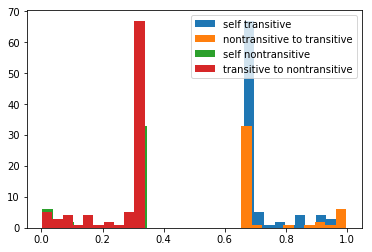

In [29]:
probs = np.sum(trans_matrix[transitives, :][:, transitives], axis=1)
plt.hist(probs)
print('Transition probability of "transitive to self": {} +- {}'.format(
        round(np.mean(probs), 2), round(np.std(probs), 2)))

probs = np.sum(trans_matrix[~transitives, :][:, transitives], axis=1)
plt.hist(probs)
print('Transition probability of "not transitive to transitive": {} +- {}'.format(
        round(np.mean(probs), 2), round(np.std(probs), 2)))

probs = np.sum(trans_matrix[~transitives, :][:, ~transitives], axis=1)
plt.hist(probs)
print('Transition probability of "not transitive to self": {} +- {}'.format(
        round(np.mean(probs), 2), round(np.std(probs), 2)))

probs = np.sum(trans_matrix[transitives, :][:, ~transitives], axis=1)
plt.hist(probs)
print('Transition probability of "transitive to not transitive": {} +- {}'.format(
        round(np.mean(probs), 2), round(np.std(probs), 2)))

plt.legend(['self transitive', 'nontransitive to transitive', 'self nontransitive', 'transitive to nontransitive']);

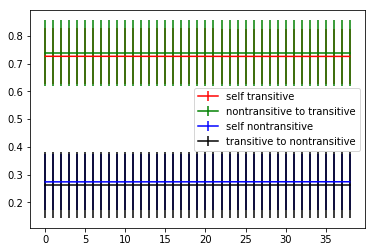

In [30]:
self_transitive_means = []
self_nontransitive_means = []
nontransitive_to_transitive_means = []
transitive_to_nontransitive_means = []
self_transitive_stds = []
self_nontransitive_stds = []
nontransitive_to_transitive_stds = []
transitive_to_nontransitive_stds = []

for matrix in M:
    trans_matrix = matrix.value
    
    probs = np.sum(trans_matrix[transitives, :][:, transitives], axis=1)
    self_transitive_means.append(np.mean(probs))
    self_transitive_stds.append(np.std(probs))

    probs = np.sum(trans_matrix[~transitives, :][:, transitives], axis=1)
    nontransitive_to_transitive_means.append(np.mean(probs))
    nontransitive_to_transitive_stds.append(np.std(probs))

    probs = np.sum(trans_matrix[~transitives, :][:, ~transitives], axis=1)
    transitive_to_nontransitive_means.append(np.mean(probs))
    transitive_to_nontransitive_stds.append(np.std(probs))

    probs = np.sum(trans_matrix[transitives, :][:, ~transitives], axis=1)
    self_nontransitive_means.append(np.mean(probs))
    self_nontransitive_stds.append(np.std(probs))
    

plt.errorbar(x=np.arange(l-1), y=self_transitive_means, yerr=self_transitive_stds, fmt='r')
plt.errorbar(x=np.arange(l-1), y=nontransitive_to_transitive_means, yerr=nontransitive_to_transitive_stds, fmt='g')
plt.errorbar(x=np.arange(l-1), y=self_nontransitive_means, yerr=self_nontransitive_stds, fmt='b')
plt.errorbar(x=np.arange(l-1), y=transitive_to_nontransitive_means, yerr=transitive_to_nontransitive_stds, fmt='k')
plt.legend(['self transitive', 'nontransitive to transitive', 'self nontransitive', 'transitive to nontransitive']);


# plt.errorbar(x=np.arange(39), y=self_transitive_means) #, yerr=self_transitive_stds)
# plt.errorbar(x=np.arange(39), y=nontransitive_to_transitive_means) #, yerr=nontransitive_to_transitive_stds)
# plt.errorbar(x=np.arange(39), y=self_nontransitive_means) #, yerr=self_nontransitive_stds)
# plt.errorbar(x=np.arange(39), y=transitive_to_nontransitive_means) #, yerr=transitive_to_nontransitive_stds)
# plt.legend(['self transitive', 'nontransitive to transitive', 'self nontransitive', 'transitive to nontransitive']);

## Separated 

/cs/student/omid55/.local/lib/python3.4/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


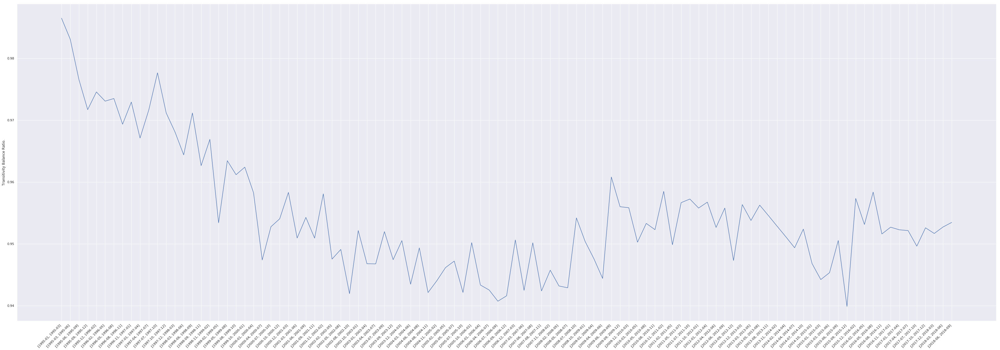

In [56]:
sns.set(rc={'figure.figsize': (60, 20)})
transitivity_balance = []
for period_triads in result['triads_types']:
    balanced = 0.0
    for triad_index in period_triads.values():
        if transitive_balances[triad_index]:
            balanced += 1.0
    balanced /= len(period_triads)
    transitivity_balance.append(balanced)
plt.plot(transitivity_balance)
plt.ylabel('Transitivity Balance Ratio.')
# seting xticks
ax = plt.axes()
number_of_periods = len(periods)
ax.set_xticks(list(range(number_of_periods)))
labels = ['[{}, {}]'.format(periods[i][0][:7], periods[i][1][:7]) for i in range(number_of_periods)]
ax.set_xticklabels(labels, rotation=45);
for tick in ax.xaxis.get_majorticklabels():
    tick.set_horizontalalignment("right")

## Accumulative 

/cs/student/omid55/.local/lib/python3.4/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


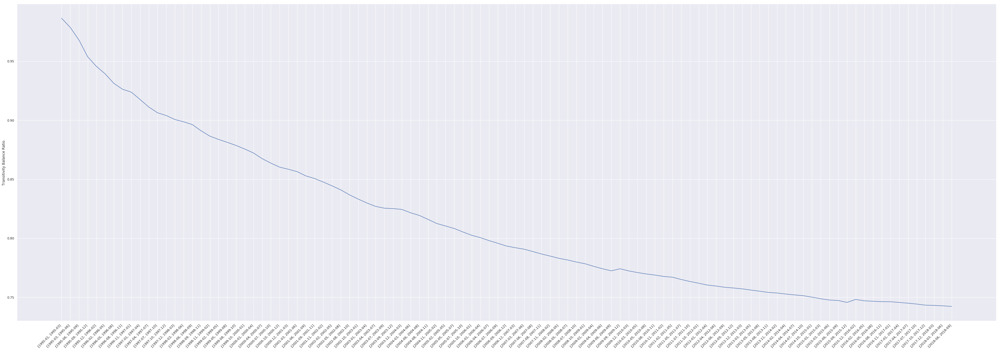

In [57]:
sns.set(rc={'figure.figsize': (60, 20)})
acc_transitivity_balance = []
for period_triads in acc_result['triads_types']:
    balanced = 0.0
    for triad_index in period_triads.values():
        if transitive_balances[triad_index]:
            balanced += 1.0
    balanced /= len(period_triads)
    acc_transitivity_balance.append(balanced)
plt.plot(acc_transitivity_balance)
plt.ylabel('Transitivity Balance Ratio.')
# seting xticks
ax = plt.axes()
number_of_periods = len(periods)
ax.set_xticks(list(range(number_of_periods)))
labels = ['[{}, {}]'.format(periods[i][0][:7], periods[i][1][:7]) for i in range(number_of_periods)]
ax.set_xticklabels(labels, rotation=45);
for tick in ax.xaxis.get_majorticklabels():
    tick.set_horizontalalignment("right")

# Van De Rijt balance

In [62]:
edge_balances = []
for separate_dgraph in separate_dgraphs:
    edge_balances.append(network_utils.compute_vanderijt_edge_balance(separate_dgraph))

In [63]:
network_mean_balance = []
for index, edge_balance in enumerate(edge_balances):
    balanced_edges = list(np.ones(
        len(set(separate_dgraphs[index].edges()) - set(edge_balance.keys()))))
    network_mean_balance.append(
        np.mean(balanced_edges + [item['#balanced_node3'] / item['#nodes3']
                 for item in list(edge_balance.values())]))

/cs/student/omid55/.local/lib/python3.4/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


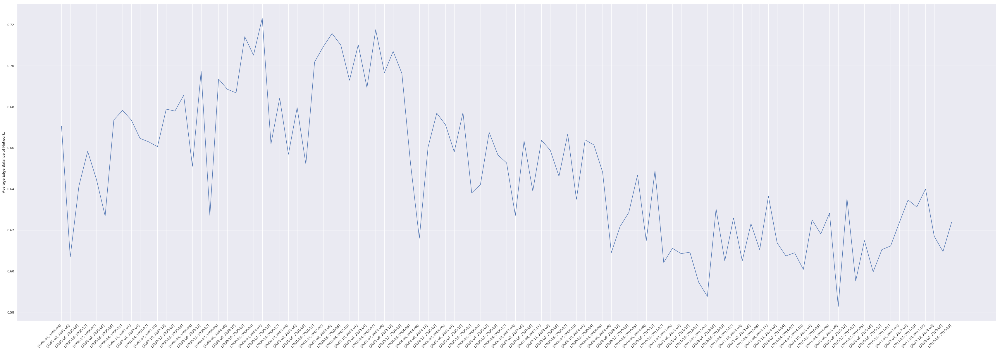

In [64]:
plt.plot(network_mean_balance)
plt.ylabel('Average Edge Balance of Network.')
# seting xticks
ax = plt.axes()
number_of_periods = len(periods)
ax.set_xticks(list(range(number_of_periods)))
labels = ['[{}, {}]'.format(periods[i][0][:7], periods[i][1][:7]) for i in range(number_of_periods)]
ax.set_xticklabels(labels, rotation=45);
for tick in ax.xaxis.get_majorticklabels():
    tick.set_horizontalalignment("right")

# Saving all variables

In [65]:
utils.save_all_variables_of_current_session(locals(), '/local/home/student/omid55/sbt_data_saved/avg_all_vars.pkl')

Just this variable was not saved: f
